# 0. Imports and Useful Functions from Other Notebooks

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import itertools
sns.set()
df = pd.read_pickle('female_test.pkl')
dft = pd.read_pickle('female_train.pkl')
import os
import pickle
from glob import glob
from scipy.stats import pearsonr
from scipy.stats import gaussian_kde
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import ElasticNet, ElasticNetCV
from datetime import datetime

In [2]:
def scatter_plot_heatmap(x, y, xlabel, ylabel, title, equality_line=True, set_scale=False):
    
    if isinstance(x, pd.Series):
        x = x.to_numpy()
    
    if isinstance(y, pd.Series):
        y = y.to_numpy()
    
    fig = plt.figure(figsize=[7.2, 7.2])
    sns.set_style("darkgrid", {'image.cmap': u'plasma'})
    xy = np.vstack([x,y])
    z = gaussian_kde(xy)(xy)
    # Sort the points by density, so that the densest points are plotted last
    idx = z.argsort()
    x, y, z = x[idx], y[idx], z[idx]
    plt.scatter(x,y,c=z,s=50)
    if equality_line == True:
        plt.plot(x, x, ls="-", color = sns.xkcd_rgb['black'], label='Equality Line') #this is just the line of equality
    
    X_mat=np.vstack((np.ones(len(x)), x)).T
    beta_hat = np.linalg.inv(X_mat.T.dot(X_mat)).dot(X_mat.T).dot(y)
    b,w = beta_hat[0],beta_hat[1]
    x2 = np.linspace(np.min(x),np.max(x),num=10)
    y2 = w * x2 + b
    plt.plot(x2,y2,ls='--', color= sns.xkcd_rgb['red'], label='Linear Regression Line')
    
    pearson_correlation = pearsonr(x,y)[0]
    
    if set_scale == True:
        x_min, x_max = np.min(x), np.max(x)
        y_min, y_max = np.min(y), np.max(y)
        c_min, c_max = min(x_min, y_min), max(x_max, y_max)
        plt.xlim([c_min-2, c_max+2])
        plt.ylim([c_min-2, c_max+2])
    
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    
    lbl = 'Pearson R = '+str(round(pearson_correlation,3))
    plt.plot([],[],' ',label=lbl)
    
    plt.title(title)
    plt.legend()
    plt.show()
    
def kde_plot(x, y, xlabel, ylabel, title):
    plt.figure()
    sns.kdeplot(x, label='Ground Truth')
    sns.kdeplot(y, label= ylabel)
    plt.legend()
    plt.title(title)
    
def age_deconfounding(predicted_ages, chronological_ages):
    
    if isinstance(predicted_ages, pd.Series):
        predicted_ages = predicted_ages.to_numpy()
    
    if isinstance(chronological_ages, pd.Series):
        chronological_ages = chronological_ages.to_numpy()
    
    ones = np.ones(len(chronological_ages))
    chronological_ages_squared = np.square(chronological_ages)
    chronological_ages_confounds = np.array([ones, chronological_ages])
    
    ones_predicted = np.ones(len(predicted_ages))
    predicted_ages_squared = np.square(predicted_ages)
    predicted_ages_confounds = np.array([ones_predicted, predicted_ages])
    
    predicted_ages = np.reshape(predicted_ages, (len(predicted_ages), 1) )
    beta = np.dot( np.linalg.pinv(chronological_ages_confounds.T), predicted_ages )

    corrected_predicted_ages = (predicted_ages.flatten() - beta[0])/beta[1]
    
    return corrected_predicted_ages

# 1. Fitting All Variables

In [3]:
# df_train = {}
# for idx in range(len(df)):
#     name = dft.iloc[idx].modality
# #     data = dft.iloc[idx].dataframe.output_age_decon.to_list()
#     data = dft.iloc[idx].dataframe.mean_output_age.to_list()
#     df_train[name] = data
    
# df_train = pd.DataFrame.from_dict(df_train)
# df_train['target_age'] = dft.iloc[0].dataframe.target_age.to_list()

In [4]:
# df_test = {}
# for idx in range(len(df)):
#     name = df.iloc[idx].modality
# #     data = df.iloc[idx].dataframe.output_age_decon.to_list()
#     data = df.iloc[idx].dataframe.mean_output_age.to_list()
#     df_test[name] = data
    
# df_test = pd.DataFrame.from_dict(df_test)
# df_test['target_age'] = df.iloc[0].dataframe.target_age.to_list()

In [5]:
from sklearn.model_selection import train_test_split

df_test = {}
df_test['Unnamed: 0'] = df.iloc[0].dataframe['Unnamed: 0'].to_list()
for idx in range(len(df)):
    name = df.iloc[idx].modality
    data = df.iloc[idx].dataframe.mean_output_age.to_list()
    df_test[name] = data
    
df_test = pd.DataFrame.from_dict(df_test)
df_test['target_age'] = df.iloc[0].dataframe.target_age.to_list()

df_testA, df_testB = train_test_split(df_test, test_size=0.5, random_state=1)
subjects_testA = df_testA['Unnamed: 0'].to_list()
subjects_testB = df_testB['Unnamed: 0'].to_list()
df_testA = df_testA.drop(labels='Unnamed: 0', axis=1)
df_testB = df_testB.drop(labels='Unnamed: 0', axis=1)

df_train = df_testA
df_test = df_testB

In [6]:
df_train

,T1_nonlinear,T1_linear,jacobian,vbm,T2_nonlinear,T2_lesions,swi,rsfmri_0,rsfmri_1,rsfmri_2,...,tbss_FA,tbss_ICVF,tbss_ISOVF,tbss_L1,tbss_L2,tbss_L3,tbss_MD,tbss_MO,tbss_OD,target_age
2820,66.709417,67.442993,61.093726,62.254519,69.164342,63.855006,67.249040,58.140988,62.120589,64.160736,...,62.182788,61.906055,63.804283,61.755967,58.793064,62.017001,62.214266,65.457215,64.070314,66.449886
1708,60.944236,61.842161,58.154415,63.287874,59.937619,60.383603,64.117655,57.543353,54.386728,55.125870,...,59.943876,59.250686,62.674294,59.842834,60.130049,60.041532,60.133045,58.552697,60.884393,56.750799
3530,69.986284,70.044437,67.995620,68.787147,66.860631,63.243362,65.436874,67.694233,64.469723,67.990499,...,69.095557,68.243078,70.294473,71.528098,68.952060,68.205580,68.265059,67.692567,71.046120,74.181393
3480,50.189046,49.536327,55.061271,52.386892,51.970549,55.862569,54.179867,54.311277,60.954406,58.720743,...,52.460709,51.984690,52.651951,51.896004,51.796198,53.048449,51.241098,53.523593,52.749642,48.054909
670,71.524370,74.981445,69.319275,72.855853,68.487738,74.630128,70.888287,67.358183,62.182683,68.813820,...,69.198738,68.378360,69.722930,69.319782,69.967300,67.481915,68.142391,68.747928,68.246657,71.225457
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2895,72.453860,72.777170,71.681043,71.683783,68.714974,69.766270,65.685925,68.641963,70.857667,65.476047,...,72.687613,70.522855,69.902572,70.420770,72.571650,73.341687,71.503297,68.441695,70.658153,68.973630
2763,53.351702,52.271532,55.079981,52.161547,53.909411,59.786398,53.030368,53.165982,57.423242,53.322554,...,54.309854,54.178987,56.800108,56.448681,54.016900,55.505735,58.626230,55.986900,56.154284,54.153767
905,69.209973,69.500987,68.698557,66.651488,68.785348,63.463698,66.667837,69.449155,71.894450,69.530817,...,63.842171,67.179692,66.388185,68.495769,66.448707,68.125218,69.551362,71.481080,67.318527,69.441940
3980,52.488741,52.919326,49.097110,55.224999,54.686887,56.643762,55.647718,51.043516,51.264160,49.018145,...,52.269901,53.618629,52.570537,50.347670,49.235783,51.978335,49.282260,49.503878,51.560833,55.862215


In [7]:
df_test

,T1_nonlinear,T1_linear,jacobian,vbm,T2_nonlinear,T2_lesions,swi,rsfmri_0,rsfmri_1,rsfmri_2,...,tbss_FA,tbss_ICVF,tbss_ISOVF,tbss_L1,tbss_L2,tbss_L3,tbss_MD,tbss_MO,tbss_OD,target_age
4782,63.245763,60.347539,59.175664,60.535280,60.572191,64.271554,60.995139,61.454180,65.820454,54.018154,...,59.640923,59.256958,60.798890,59.529524,60.710006,61.519483,58.473717,63.440821,60.856472,59.311073
1499,65.723238,64.545638,64.115105,61.995279,61.336338,58.351572,61.548383,63.829018,65.781898,63.909287,...,60.730879,62.307837,59.981651,61.838904,59.056288,59.426216,60.391799,60.675784,61.064435,67.523907
1355,70.625488,72.846277,67.263212,67.866833,67.953740,64.834815,69.404198,67.038805,72.272427,69.569033,...,69.970463,69.134120,70.144314,70.540548,68.802525,70.392927,70.302002,69.416728,68.678743,72.236872
428,66.489107,65.828297,69.445412,70.458772,68.375243,74.661483,67.512283,67.176399,65.978737,64.585167,...,68.711838,68.486243,63.146150,66.291610,65.741838,64.530488,65.988057,69.211123,63.804908,69.261758
4145,52.520869,50.627655,50.201043,55.607993,52.392310,54.855268,51.198625,54.453357,52.335854,53.213187,...,51.796479,53.298255,51.953147,51.934909,52.652825,51.864011,52.028369,53.204612,50.712734,48.488699
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4863,68.392203,68.626732,62.527637,69.205427,69.337220,60.014212,67.382435,61.358376,65.911358,65.441105,...,68.193215,68.005068,67.585417,68.064463,68.890253,67.697787,67.649173,66.978093,68.282287,70.577186
4789,73.262425,75.177746,72.687402,73.095372,71.387027,71.550072,68.853650,70.244118,70.091700,75.162663,...,76.573107,74.818037,75.255967,73.523410,75.733007,73.303215,75.431483,75.108463,75.181920,69.101712
883,59.688874,60.022259,64.018817,62.083768,57.404459,61.996371,60.924057,73.446907,68.175377,66.366097,...,64.946223,64.153781,64.620801,66.337545,64.970903,64.048392,66.100290,63.985211,61.135144,57.618169
1688,70.857363,68.741170,71.347395,70.061517,70.100983,65.109477,68.053762,66.053088,64.121276,65.389990,...,65.896517,69.423343,68.763145,69.311439,69.794000,70.722923,68.751759,70.241538,71.175175,73.835046


In [9]:
def ElasticNet_wrap(df_train, df_test, cross_validation_flag = False, 
                    modalities = None, number_of_modalities=None, 
                    show_plots=False, verbose=False, fix_alpha_one=False, deconfound=False):
    
    Xtrain = []
    Ytrain = []
    
    if modalities == None:
        if number_of_modalities == None:
            for col in df_train.columns[:-1]:
                Xtrain.append(np.array(df_train[col].to_list()))
        else:
            for col in df_train.columns[:number_of_modalities]:
                print(col)
                Xtrain.append(np.array(df_train[col].to_list()))
    else:
        for modality in modalities:
            Xtrain.append(np.array(df_train[modality].to_list()))

    Xtrain = np.array(Xtrain)
    Ytrain = np.array(df_train['target_age'].to_list())

    if cross_validation_flag == True:
        l1_ratio = [0.01, 
                    .1, .11, .12, 0.13, 0.14, .15, .16, 0.17, 0.18, .19,
                    .2, .21, .22, 0.23, 0.24, .25, .26, 0.27, 0.28, .29,
                    0.3, 0.4, 
                    .5, .51, .52, 0.53, 0.54, .55, .56, 0.57, 0.58, .59,
                    .6, .61, .62, 0.63, 0.64, .65, .66, 0.67, 0.68, .69,
                    .7, .71, .72, 0.73, 0.74, .75, .76, 0.77, 0.78, .79,
                     0.8, .9, .91, .92, 0.93, 0.94, .95, .96, 0.97, 0.98, .99, 1.0]
        n_alphas = 1000
        model = ElasticNetCV(l1_ratio=l1_ratio,
                             n_alphas=n_alphas
                            )
    else:
        model = ElasticNet(alpha=0.14766659013829683, l1_ratio=1.0)

    start_time = datetime.now()
        
    reg = model.fit(Xtrain.T, Ytrain)
    
    end_time = datetime.now()
    
    
    coefficients = reg.coef_
    intercept = reg.intercept_
     
    Xtest = []
    
    if modalities == None:
        if number_of_modalities == None:
            for col in df_train.columns[:-1]:
                Xtest.append(np.array(df_test[col].to_list()))
        else:
            for col in df_train.columns[:number_of_modalities]:
                Xtest.append(np.array(df_test[col].to_list()))
    else:
        for modality in modalities:
            Xtest.append(np.array(df_test[modality].to_list()))
        
    Xtest = np.array(Xtest)
    Ytest = np.array(df_test['target_age'].to_list())

    Yhat = reg.predict(Xtest.T)
    Age_Deltas = Yhat - Ytest
    
    if deconfound == True:
        Yhat_decon = age_deconfounding(Yhat, Ytest)
        Age_Deltas_decon = Yhat_decon - Ytest
    else:
        Yhat_decon = None
        Age_Deltas_decon = None
    
    mae = np.abs(Age_Deltas).mean()
    pr = pearsonr(Ytest, Yhat)[0]
    
    if deconfound == True:
        mae_decon = np.abs(Age_Deltas_decon).mean()
        pr_decon = pearsonr(Ytest, Yhat_decon)[0]
    else:
        mae_decon = None
        pr_decon = None
    
    if verbose == True:
        print('MAE=', mae)
        print('PR=', pr)
        print('Time To Complete: {}'.format(end_time - start_time))
        if deconfound == True:
            print('MAE Decon=', mae_decon)
            print('PR Decon=', pr_decon)
    
    if show_plots == True:
        scatter_plot_heatmap(x=Ytest, y=Yhat, xlabel='Ground Truth', 
                               ylabel='Predicted Age Deconfounded', title=None, set_scale=True)

        scatter_plot_heatmap(x=Ytest, y=Age_Deltas, xlabel='Ground Truth', 
                               ylabel='Predicted Age Delta Deconfounded', title=None, set_scale=False, 
                               equality_line=False)

        kde_plot(x=Ytest, y=Yhat, xlabel='Ground Truth', ylabel='Predicted Age Deconfounded', title=None)
        
        if deconfound == True:
            scatter_plot_heatmap(x=Ytest, y=Yhat_decon, xlabel='Ground Truth', 
                                   ylabel='Predicted Age Deconfounded', title=None, set_scale=True)

            scatter_plot_heatmap(x=Ytest, y=Age_Deltas_decon, xlabel='Ground Truth', 
                                   ylabel='Predicted Age Delta Deconfounded', title=None, set_scale=False, 
                                   equality_line=False)

            kde_plot(x=Ytest, y=Yhat_decon, xlabel='Ground Truth', ylabel='Predicted Age Deconfounded', title=None)            
    
    if deconfound == True:
        return (reg, coefficients, intercept, mae_decon, pr_decon, Xtrain, Ytrain, Xtest, Ytest, Yhat_decon,
                Age_Deltas_decon, Yhat, Age_Deltas)
    else:
        return (reg, coefficients, intercept, mae, pr, Xtrain, Ytrain, Xtest, Ytest, Yhat, Age_Deltas)

Modality      : MAE             |  MAE (Decon)       

T1_nonlinear  :  2.227 ± 0.024  |   2.429 ± 0.025 

T1_linear     :  2.332 ± 0.025  |   2.550 ± 0.027 

T2_nonlinear  :  2.204 ± 0.024  |   2.372 ± 0.026 


MAE= 2.0005213071310353
PR= 0.9382902068097944
Time To Complete: 0:00:00.013837
MAE Decon= 2.1385071041103334
PR Decon= 0.9382902068097944


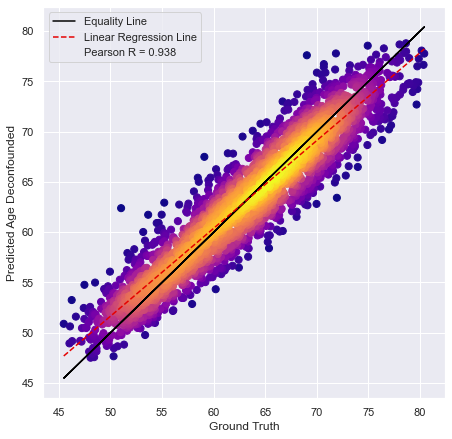

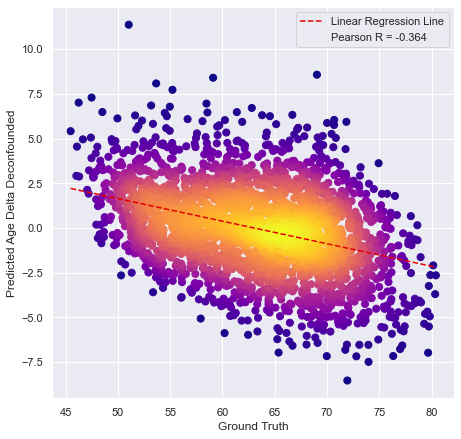

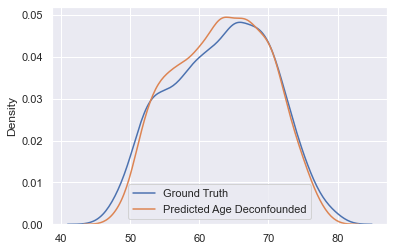

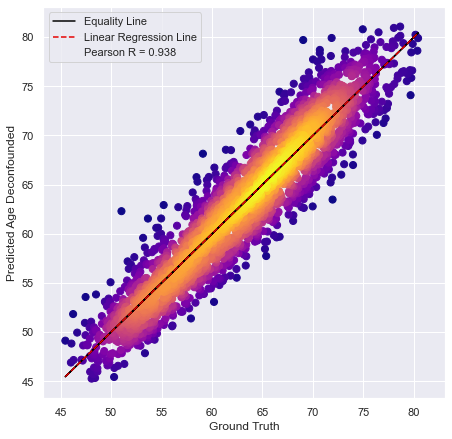

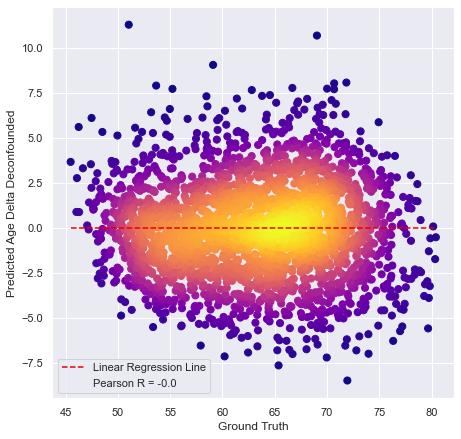

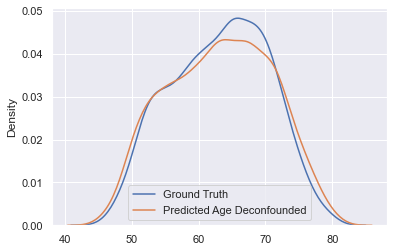

In [14]:
# reg, coefficients, intercept, mae_decon, pr_decon, Xtrain, Ytrain, Xtest, Ytest, Yhat_decon, Age_Deltas_decon = ElasticNet_wrap(
#                     df_train, df_test, number_of_modalities=None, show_plots=True, verbose=True, 
#                     cross_validation_flag = False, deconfound=True)

1.070425374941409
-4.521451247138579


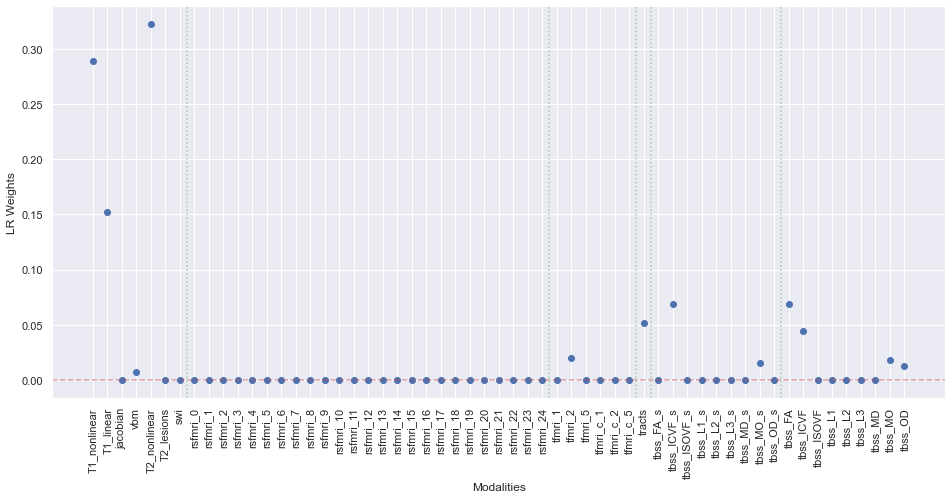

In [15]:
# plt.figure(figsize=(16, 7.2))
# # plt.plot(coefficients)
# plt.scatter(np.arange(0, Xtrain.shape[0]), coefficients)
# plt.xticks(np.arange(0, Xtrain.shape[0]), dft.modality.to_list(), rotation=90);
# plt.xlabel("Modalities")
# plt.ylabel("LR Weights")
# plt.axhline(y=0, color='r', linestyle='--', alpha=0.5);
# plt.axvline(x=6.5, color='g', linestyle='dotted', alpha=0.5);
# plt.axvline(x=31.5, color='g', linestyle='dotted', alpha=0.5);
# plt.axvline(x=37.5, color='g', linestyle='dotted', alpha=0.5);
# plt.axvline(x=38.5, color='g', linestyle='dotted', alpha=0.5);
# plt.axvline(x=47.5, color='g', linestyle='dotted', alpha=0.5);
# print(coefficients.sum())
# print(reg.intercept_)

MAE= 1.9859554340605872
PR= 0.9394865744142373
Time To Complete: 0:00:44.671677
MAE Decon= 2.116722692598795
PR Decon= 0.9394865744142372


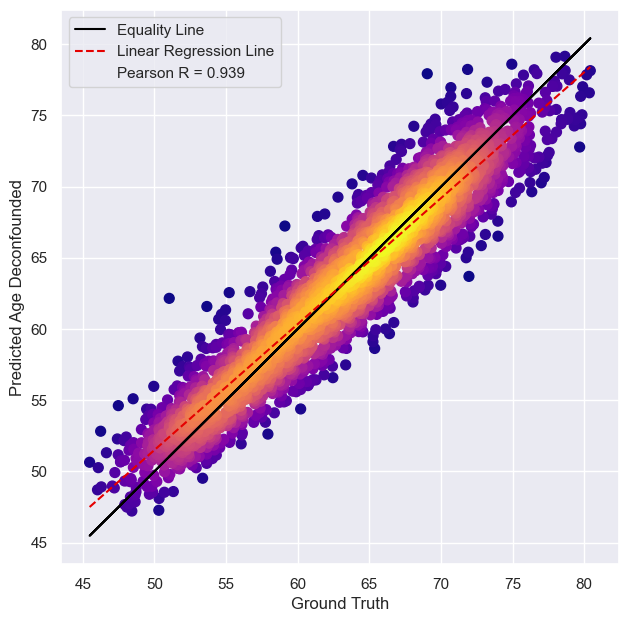

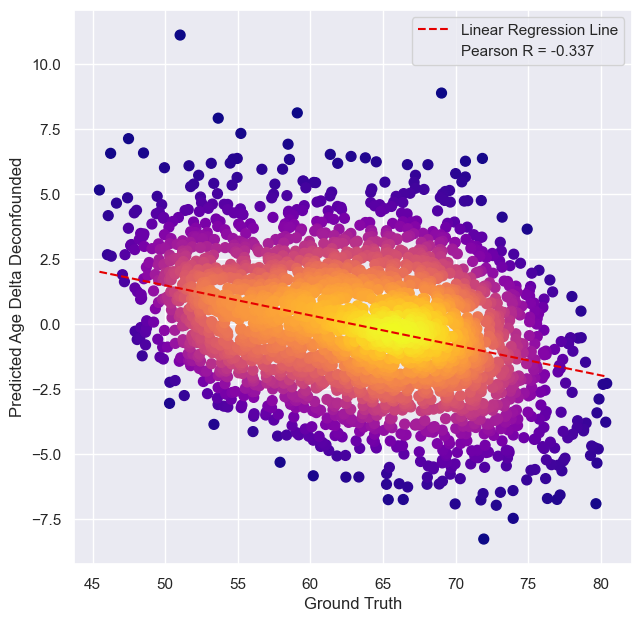

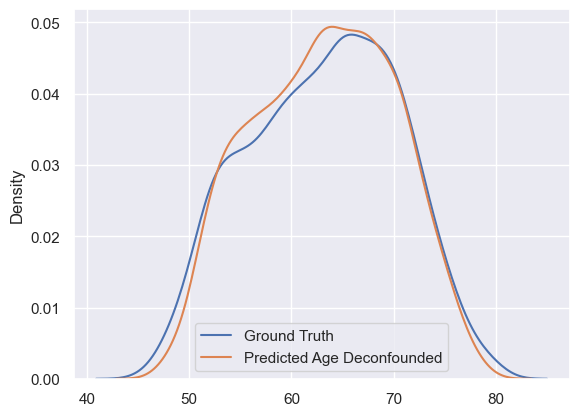

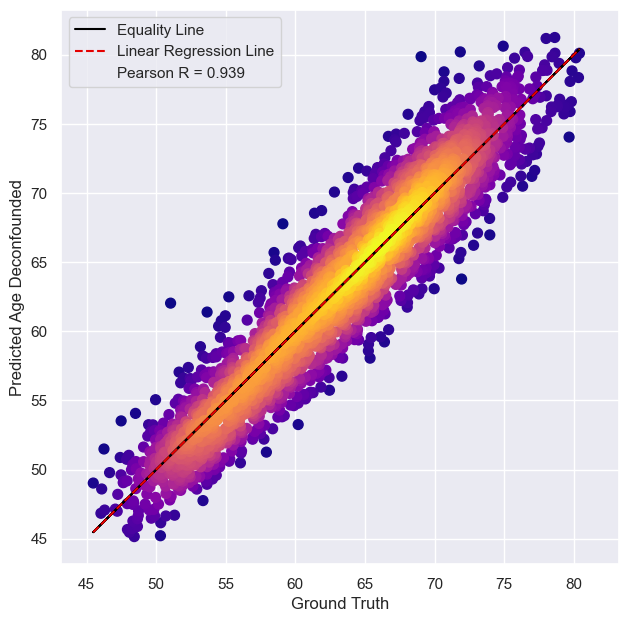

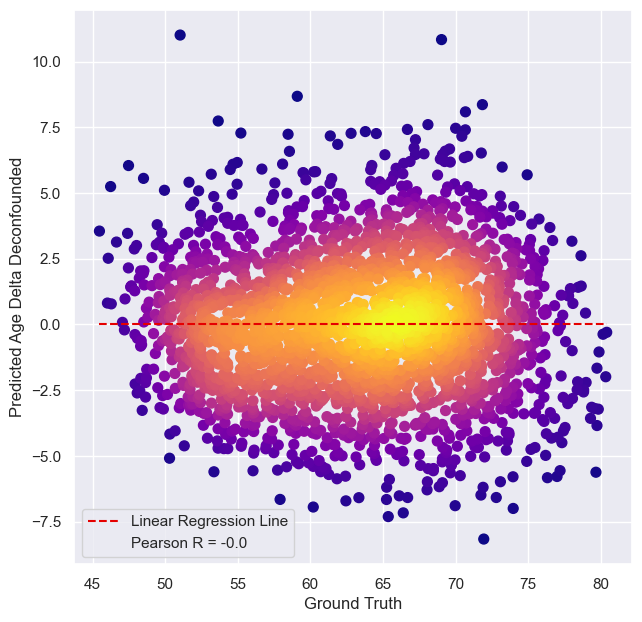

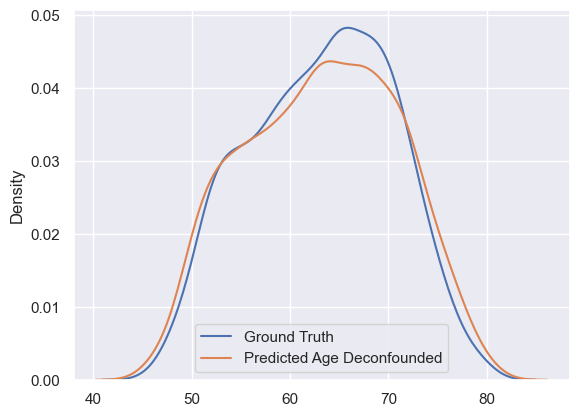

In [9]:
reg, coefficients, intercept, mae_decon, pr_decon, Xtrain, Ytrain, Xtest, Ytest, Yhat_decon, Age_Deltas_decon, _, _ = ElasticNet_wrap(
                    df_train, df_test, number_of_modalities=None, show_plots=True, verbose=True, 
                    cross_validation_flag = True, fix_alpha_one=False, deconfound=True)

1.0595038574051736
-3.8171360784740003
0.14766463343295133 1.0


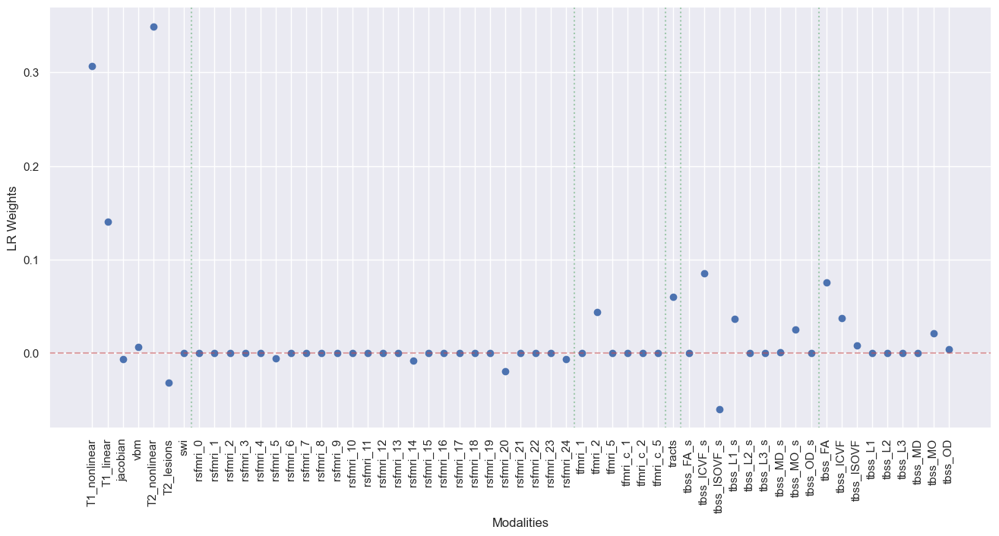

In [10]:
plt.figure(figsize=(16, 7.2))
# plt.plot(coefficients)
plt.scatter(np.arange(0, Xtrain.shape[0]), coefficients)
plt.xticks(np.arange(0, Xtrain.shape[0]), dft.modality.to_list(), rotation=90);
plt.xlabel("Modalities")
plt.ylabel("LR Weights")
plt.axhline(y=0, color='r', linestyle='--', alpha=0.5);
plt.axvline(x=6.5, color='g', linestyle='dotted', alpha=0.5);
plt.axvline(x=31.5, color='g', linestyle='dotted', alpha=0.5);
plt.axvline(x=37.5, color='g', linestyle='dotted', alpha=0.5);
plt.axvline(x=38.5, color='g', linestyle='dotted', alpha=0.5);
plt.axvline(x=47.5, color='g', linestyle='dotted', alpha=0.5);
print(coefficients.sum())
print(reg.intercept_)
print(reg.alpha_, reg.l1_ratio_)

MAE= 1.9859554998631135
PR= 0.9394865670696124
Time To Complete: 0:00:00.024008
MAE Decon= 2.116722827603213
PR Decon= 0.9394865670696123


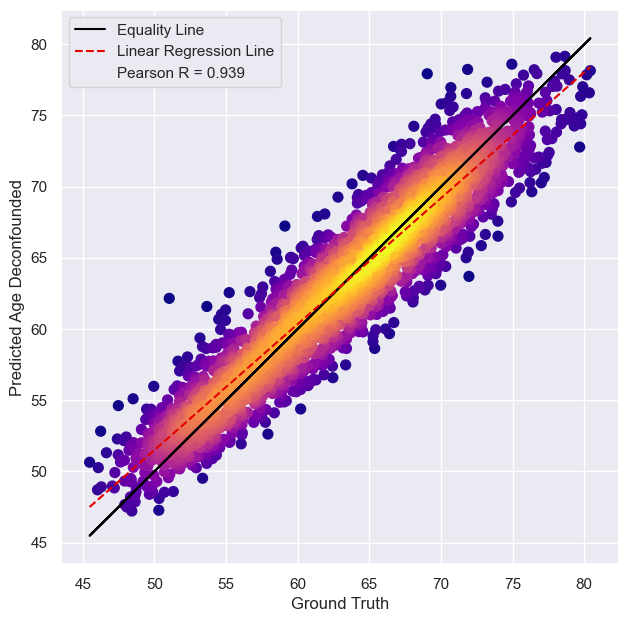

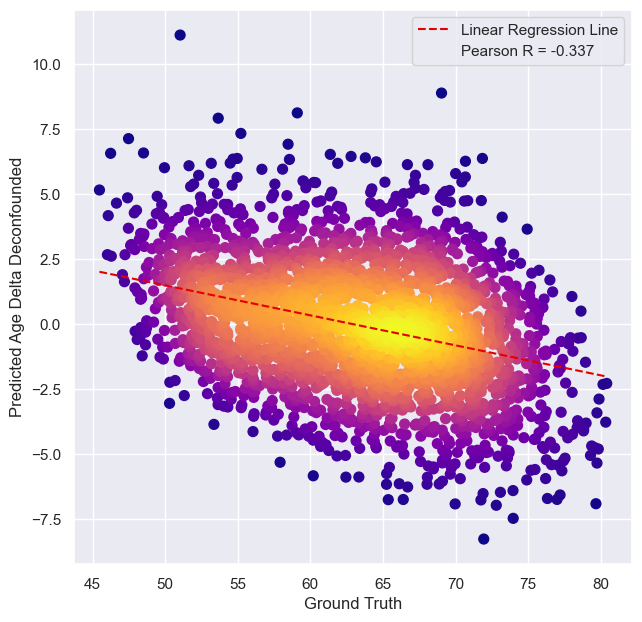

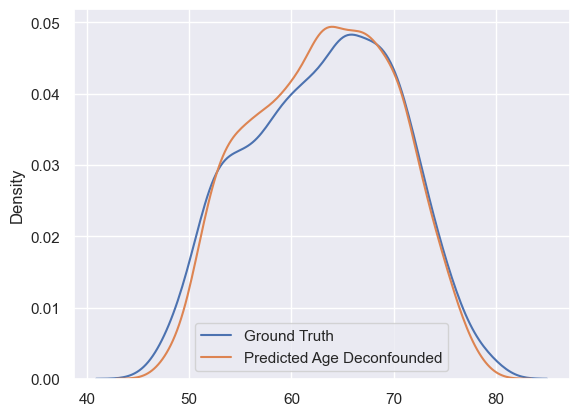

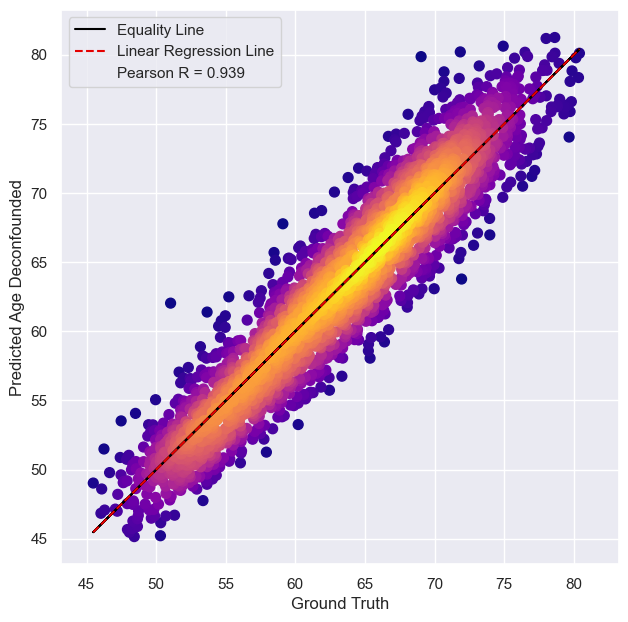

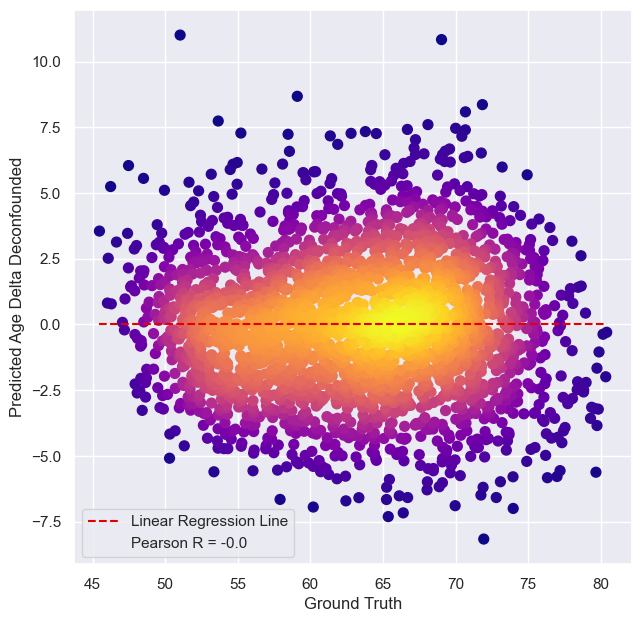

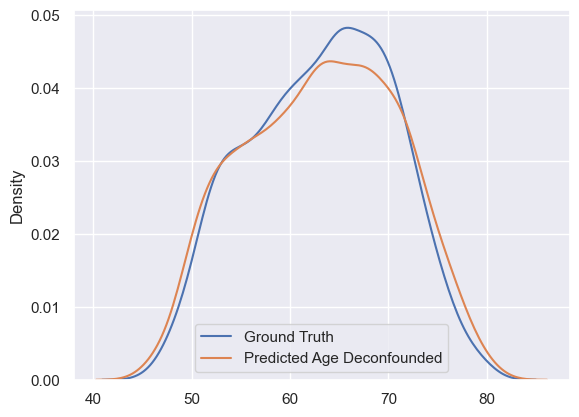

In [11]:
reg, coefficients, intercept, mae_decon, pr_decon, Xtrain, Ytrain, Xtest, Ytest, Yhat_decon, Age_Deltas_decon, Yhat, Age_Deltas = ElasticNet_wrap(
                    df_train, df_test, number_of_modalities=None, show_plots=True, verbose=True, 
                    cross_validation_flag = False, deconfound=True)

1.0595040068860655
-3.8171455560366283


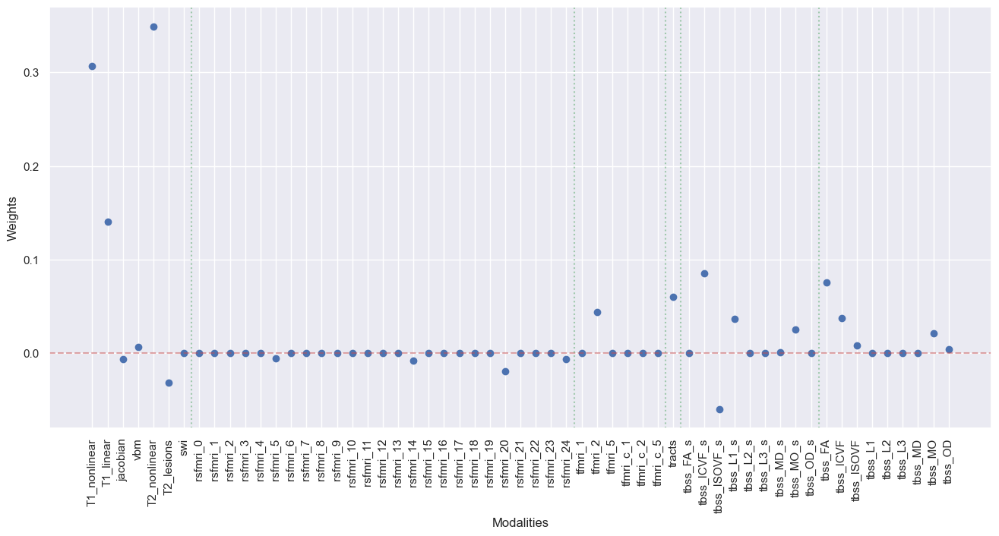

In [12]:
plt.figure(figsize=(16, 7.2))
# plt.plot(coefficients)
plt.scatter(np.arange(0, Xtrain.shape[0]), coefficients)
plt.xticks(np.arange(0, Xtrain.shape[0]), dft.modality.to_list(), rotation=90);
plt.xlabel("Modalities")
plt.ylabel("Weights")
plt.axhline(y=0, color='r', linestyle='--', alpha=0.5);
plt.axvline(x=6.5, color='g', linestyle='dotted', alpha=0.5);
plt.axvline(x=31.5, color='g', linestyle='dotted', alpha=0.5);
plt.axvline(x=37.5, color='g', linestyle='dotted', alpha=0.5);
plt.axvline(x=38.5, color='g', linestyle='dotted', alpha=0.5);
plt.axvline(x=47.5, color='g', linestyle='dotted', alpha=0.5);
print(coefficients.sum())
print(reg.intercept_)

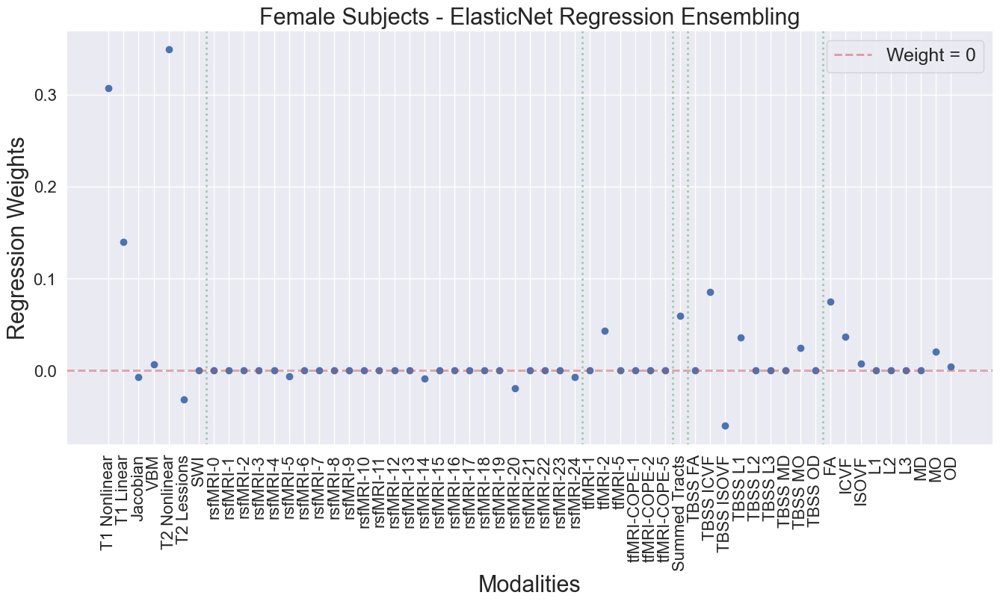

In [13]:
title_font_size=22
ticks_font_size=16
legend_font = 18
# figsize=(16, 9.6)

namesNN = [
    'T1 Nonlinear', 'T1 Linear', 'Jacobian', 'VBM', 'T2 Nonlinear', 'T2 Lessions', 'SWI', 'rsfMRI-0', 'rsfMRI-1',
    'rsfMRI-2', 'rsfMRI-3', 'rsfMRI-4', 'rsfMRI-5', 'rsfMRI-6', 'rsfMRI-7', 'rsfMRI-8', 'rsfMRI-9', 'rsfMRI-10', 
    'rsfMRI-11', 'rsfMRI-12', 'rsfMRI-13', 'rsfMRI-14', 'rsfMRI-15', 'rsfMRI-16', 'rsfMRI-17', 'rsfMRI-18', 'rsfMRI-19',
    'rsfMRI-20', 'rsfMRI-21', 'rsfMRI-22', 'rsfMRI-23', 'rsfMRI-24', 'tfMRI-1', 'tfMRI-2', 'tfMRI-5', 'tfMRI-COPE-1',
    'tfMRI-COPE-2', 'tfMRI-COPE-5', 'Summed Tracts', 'TBSS FA', 'TBSS ICVF', 'TBSS ISOVF', 'TBSS L1', 'TBSS L2',
    'TBSS L3', 'TBSS MD', 'TBSS MO', 'TBSS OD', 'FA', 'ICVF', 'ISOVF', 'L1', 'L2', 'L3', 'MD', 'MO', 'OD'
]

fig = plt.figure(figsize=(16, 7.2))

plt.scatter(np.arange(0, Xtrain.shape[0]), coefficients)
plt.xticks(np.arange(0, Xtrain.shape[0]), namesNN, rotation=90, fontsize= ticks_font_size);
plt.xlabel("Modalities", fontsize=title_font_size)
plt.yticks(fontsize=ticks_font_size)
plt.ylabel("Regression Weights", fontsize=title_font_size)
plt.axhline(y=0, color='r', linestyle='--', alpha=0.5, linewidth=2, label='Weight = 0');
plt.axvline(x=6.5, color='g', linestyle='dotted', alpha=0.5, linewidth=2);
plt.axvline(x=31.5, color='g', linestyle='dotted', alpha=0.5, linewidth=2);
plt.axvline(x=37.5, color='g', linestyle='dotted', alpha=0.5, linewidth=2);
plt.axvline(x=38.5, color='g', linestyle='dotted', alpha=0.5, linewidth=2);
plt.axvline(x=47.5, color='g', linestyle='dotted', alpha=0.5, linewidth=2);

plt.legend(loc=1, fontsize=legend_font)

plt.title('Female Subjects - ElasticNet Regression Ensembling', fontsize=title_font_size)

fig.savefig('Female_elastic_net_weights.png', bbox_inches='tight')



In [14]:
original_coefficients = np.copy(coefficients)
original_mae_decon = np.copy(mae_decon)

In [10]:
df_output = pd.DataFrame.from_dict({
    'modality': 'ElasticNetFull',
    'dataframe': [pd.DataFrame.from_dict({
                'Unnamed: 0': subjects_testB,
                'age_delta_decon': Age_Deltas_decon,
                'mean_age_delta': Age_Deltas,
                'target_age': df_testB.target_age.values,
                'mean_output_age': Yhat
                })]
})

output_name = 'female_ensembles_testset.pkl'

if os.path.exists(output_name):
    df_ensambles = pd.read_pickle(output_name)
    if df_output.iloc[0].modality in df_ensambles.modality.to_list():
        pass
    else:
        df_ensambles = pd.concat([df_ensambles, df_output])
        df_ensambles.to_pickle(output_name, protocol = 4)
else:
    df_output.to_pickle(output_name, protocol = 4)

In [11]:
df_ensambles.iloc[2].dataframe

,Unnamed: 0,age_delta_decon,mean_age_delta,target_age,mean_output_age
0,25731272,1.777072,1.998115,59.311073,61.309189
1,23327192,-3.787658,-3.871940,67.523907,63.651967
2,21569423,-1.184589,-2.112407,72.236872,70.124465
3,25730176,-1.347789,-1.913760,69.261758,67.347998
4,23094690,1.942242,3.392058,48.488699,51.880756
...,...,...,...,...,...
2506,23930771,-0.670639,-1.466354,70.577186,69.110832
2507,24847070,6.459332,5.011656,69.101712,74.113368
2508,23169754,1.707006,2.131319,57.618169,59.749489
2509,25240989,-2.702104,-3.639222,73.835046,70.195824


In [19]:
abs(df_ensambles.iloc[2].dataframe.age_delta_decon).mean()

2.116722827603213

In [20]:
abs(df_ensambles.iloc[1].dataframe.age_delta_decon).mean()

2.121598228970742

In [21]:
abs(df_ensambles.iloc[0].dataframe.age_delta_decon).mean()

3.076201645560478

In [16]:
df_ensambles

NameError: name 'df_ensambles' is not defined

# K-Fold Cross Validation

In [17]:
from sklearn.model_selection import KFold

In [18]:
df_train.head()

,T1_nonlinear,T1_linear,jacobian,vbm,T2_nonlinear,T2_lesions,swi,rsfmri_0,rsfmri_1,rsfmri_2,...,tbss_FA,tbss_ICVF,tbss_ISOVF,tbss_L1,tbss_L2,tbss_L3,tbss_MD,tbss_MO,tbss_OD,target_age
2820,66.709417,67.442993,61.093726,62.254519,69.164342,63.855006,67.249040,58.140988,62.120589,64.160736,...,62.182788,61.906055,63.804283,61.755967,58.793064,62.017001,62.214266,65.457215,64.070314,66.449886
1708,60.944236,61.842161,58.154415,63.287874,59.937619,60.383603,64.117655,57.543353,54.386728,55.125870,...,59.943876,59.250686,62.674294,59.842834,60.130049,60.041532,60.133045,58.552697,60.884393,56.750799
3530,69.986284,70.044437,67.995620,68.787147,66.860631,63.243362,65.436874,67.694233,64.469723,67.990499,...,69.095557,68.243078,70.294473,71.528098,68.952060,68.205580,68.265059,67.692567,71.046120,74.181393
3480,50.189046,49.536327,55.061271,52.386892,51.970549,55.862569,54.179867,54.311277,60.954406,58.720743,...,52.460709,51.984690,52.651951,51.896004,51.796198,53.048449,51.241098,53.523593,52.749642,48.054909
670,71.524370,74.981445,69.319275,72.855853,68.487738,74.630128,70.888287,67.358183,62.182683,68.813820,...,69.198738,68.378360,69.722930,69.319782,69.967300,67.481915,68.142391,68.747928,68.246657,71.225457


In [19]:
dct_coef = {}
i = 0
mae_decon_lst = []

kf = KFold(n_splits=5)
for train, test in kf.split(df_train):
    
    reg, coefficients, intercept, mae_decon, pr_decon, Xtrain, Ytrain, Xtest, Ytest, Yhat_decon, Age_Deltas_decon, Yhat, Age_Deltas = ElasticNet_wrap(
                    df_train.iloc[train], df_test, number_of_modalities=None, 
                    show_plots=False, 
                    verbose=False, 
                    cross_validation_flag = False, deconfound=True)
    
    dct_coef[i] = coefficients
    i += 1
    mae_decon_lst.append(mae_decon)

In [20]:
df_coef = pd.DataFrame.from_dict(dct_coef)

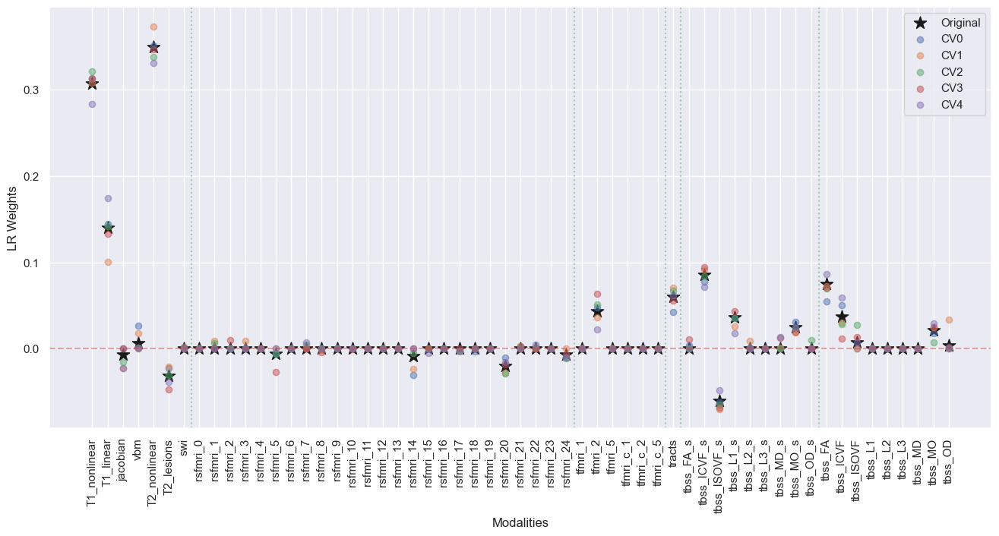

In [21]:
plt.figure(figsize=(16, 7.2))
# plt.plot(coefficients)
plt.scatter(np.arange(0, Xtrain.shape[0]), original_coefficients, color='k', label= 'Original', s=150, marker='*')
for i in range(len(df_coef.columns)):
    plt.scatter(np.arange(0, Xtrain.shape[0]), df_coef[i], alpha=0.5, label='CV'+str(i))
plt.xticks(np.arange(0, Xtrain.shape[0]), dft.modality.to_list(), rotation=90);
plt.xlabel("Modalities")
plt.ylabel("LR Weights")
plt.axhline(y=0, color='r', linestyle='--', alpha=0.5);
plt.axvline(x=6.5, color='g', linestyle='dotted', alpha=0.5);
plt.axvline(x=31.5, color='g', linestyle='dotted', alpha=0.5);
plt.axvline(x=37.5, color='g', linestyle='dotted', alpha=0.5);
plt.axvline(x=38.5, color='g', linestyle='dotted', alpha=0.5);
plt.axvline(x=47.5, color='g', linestyle='dotted', alpha=0.5);
plt.legend()

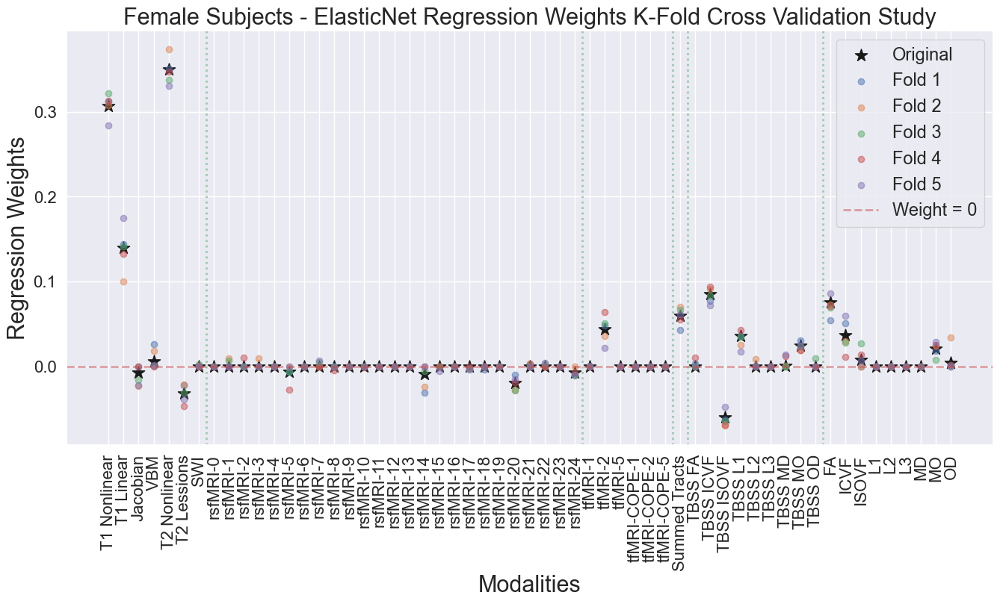

In [22]:
title_font_size=22
ticks_font_size=16
legend_font = 18
# figsize=(16, 9.6)

namesNN = [
    'T1 Nonlinear', 'T1 Linear', 'Jacobian', 'VBM', 'T2 Nonlinear', 'T2 Lessions', 'SWI', 'rsfMRI-0', 'rsfMRI-1',
    'rsfMRI-2', 'rsfMRI-3', 'rsfMRI-4', 'rsfMRI-5', 'rsfMRI-6', 'rsfMRI-7', 'rsfMRI-8', 'rsfMRI-9', 'rsfMRI-10', 
    'rsfMRI-11', 'rsfMRI-12', 'rsfMRI-13', 'rsfMRI-14', 'rsfMRI-15', 'rsfMRI-16', 'rsfMRI-17', 'rsfMRI-18', 'rsfMRI-19',
    'rsfMRI-20', 'rsfMRI-21', 'rsfMRI-22', 'rsfMRI-23', 'rsfMRI-24', 'tfMRI-1', 'tfMRI-2', 'tfMRI-5', 'tfMRI-COPE-1',
    'tfMRI-COPE-2', 'tfMRI-COPE-5', 'Summed Tracts', 'TBSS FA', 'TBSS ICVF', 'TBSS ISOVF', 'TBSS L1', 'TBSS L2',
    'TBSS L3', 'TBSS MD', 'TBSS MO', 'TBSS OD', 'FA', 'ICVF', 'ISOVF', 'L1', 'L2', 'L3', 'MD', 'MO', 'OD'
]

fig = plt.figure(figsize=(16, 7.2))

plt.scatter(np.arange(0, Xtrain.shape[0]), original_coefficients, color='k', label= 'Original', s=150, marker='*')
for i in range(len(df_coef.columns)):
    plt.scatter(np.arange(0, Xtrain.shape[0]), df_coef[i], alpha=0.5, label='Fold '+str(i+1))

plt.xticks(np.arange(0, Xtrain.shape[0]), namesNN, rotation=90, fontsize= ticks_font_size);
plt.xlabel("Modalities", fontsize=title_font_size)
plt.yticks(fontsize=ticks_font_size)
plt.ylabel("Regression Weights", fontsize=title_font_size)
plt.axhline(y=0, color='r', linestyle='--', alpha=0.5, linewidth=2, label='Weight = 0');
plt.axvline(x=6.5, color='g', linestyle='dotted', alpha=0.5, linewidth=2);
plt.axvline(x=31.5, color='g', linestyle='dotted', alpha=0.5, linewidth=2);
plt.axvline(x=37.5, color='g', linestyle='dotted', alpha=0.5, linewidth=2);
plt.axvline(x=38.5, color='g', linestyle='dotted', alpha=0.5, linewidth=2);
plt.axvline(x=47.5, color='g', linestyle='dotted', alpha=0.5, linewidth=2);

plt.legend(loc=1, fontsize=legend_font-1)

plt.title('Female Subjects - ElasticNet Regression Weights K-Fold Cross Validation Study', fontsize=title_font_size)

fig.savefig('Female_elastic_net_weights_cross_validation.png', bbox_inches='tight')



In [23]:
print(np.mean(mae_decon_lst))
print(mae_decon_lst)

2.118704397282105
[2.116039423502639, 2.11428225044257, 2.120659060899173, 2.124213180586347, 2.118328070979796]


In [24]:
from sklearn.model_selection import ShuffleSplit

dct_coef = {}
i = 0
mae_decon_lst = []

kf = ShuffleSplit(n_splits=100)
for train, test in kf.split(df_train):
    
    reg, coefficients, intercept, mae_decon, pr_decon, Xtrain, Ytrain, Xtest, Ytest, Yhat_decon, Age_Deltas_decon, Yhat, Age_Deltas = ElasticNet_wrap(
                    df_train.iloc[train], df_test, number_of_modalities=None, 
                    show_plots=False, 
                    verbose=False, 
                    cross_validation_flag = False, deconfound=True)
    
    dct_coef[i] = coefficients
    i += 1
    mae_decon_lst.append(mae_decon)
    
df_coef = pd.DataFrame.from_dict(dct_coef)

Text(0.5, 0, 'ElasticNet MAE')

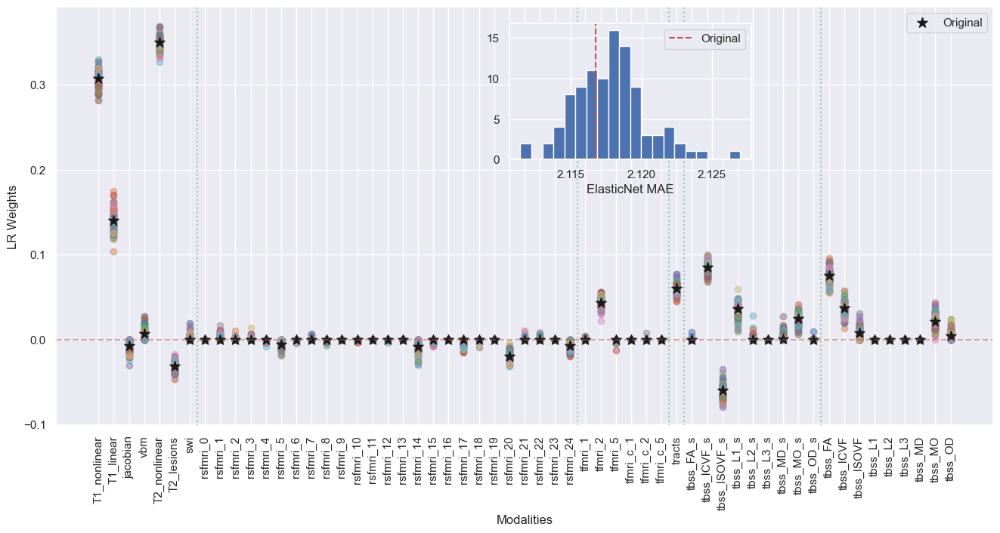

In [25]:
fig, ax1 = plt.subplots(figsize=(16, 7.2))
l, b, h, w = 0.5, 0.6, .25, .2
ax2 = fig.add_axes([l, b, w, h])


for i in range(len(df_coef.columns)):
    ax1.scatter(np.arange(0, Xtrain.shape[0]), df_coef[i], alpha=0.5) #, label='run'+str(i))
ax1.scatter(np.arange(0, Xtrain.shape[0]), original_coefficients, color='k', s=100, label= 'Original', marker='*', zorder=1)

ax1.set_xticks(np.arange(0, Xtrain.shape[0]), dft.modality.to_list(), rotation=90);
ax1.set_xlabel("Modalities")
ax1.set_ylabel("LR Weights")
ax1.axhline(y=0, color='r', linestyle='--', alpha=0.5);
ax1.axvline(x=6.5, color='g', linestyle='dotted', alpha=0.5);
ax1.axvline(x=31.5, color='g', linestyle='dotted', alpha=0.5);
ax1.axvline(x=37.5, color='g', linestyle='dotted', alpha=0.5);
ax1.axvline(x=38.5, color='g', linestyle='dotted', alpha=0.5);
ax1.axvline(x=47.5, color='g', linestyle='dotted', alpha=0.5);
ax1.legend()

ax2.hist(mae_decon_lst, bins=20);
ax2.axvline(x=original_mae_decon, color='r', linestyle='--', label='Original')
ax2.legend()
ax2.set_xlabel('ElasticNet MAE')

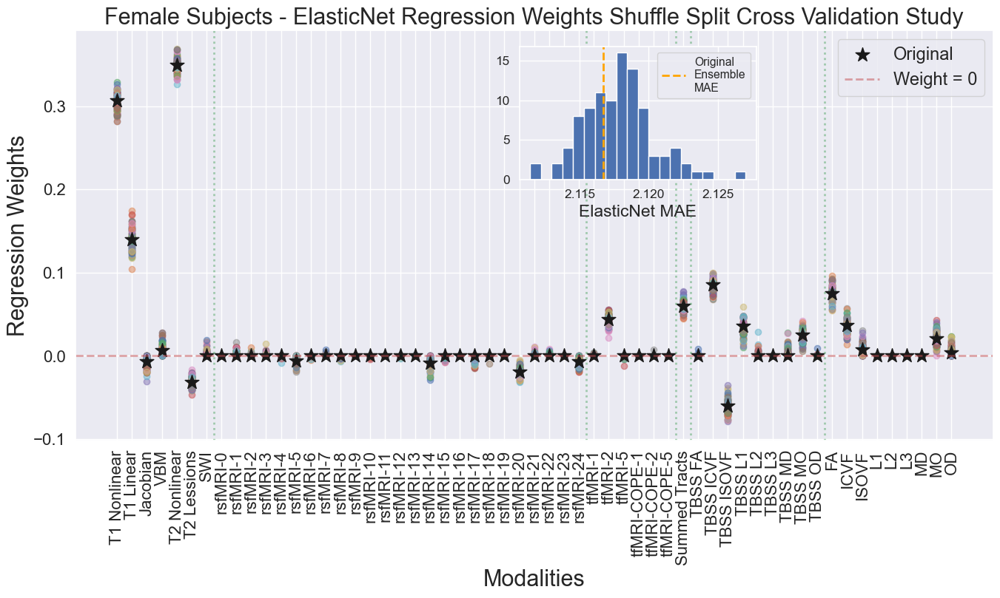

In [26]:
title_font_size=22
ticks_font_size=16
legend_font = 18
# figsize=(16, 9.6)

namesNN = [
    'T1 Nonlinear', 'T1 Linear', 'Jacobian', 'VBM', 'T2 Nonlinear', 'T2 Lessions', 'SWI', 'rsfMRI-0', 'rsfMRI-1',
    'rsfMRI-2', 'rsfMRI-3', 'rsfMRI-4', 'rsfMRI-5', 'rsfMRI-6', 'rsfMRI-7', 'rsfMRI-8', 'rsfMRI-9', 'rsfMRI-10', 
    'rsfMRI-11', 'rsfMRI-12', 'rsfMRI-13', 'rsfMRI-14', 'rsfMRI-15', 'rsfMRI-16', 'rsfMRI-17', 'rsfMRI-18', 'rsfMRI-19',
    'rsfMRI-20', 'rsfMRI-21', 'rsfMRI-22', 'rsfMRI-23', 'rsfMRI-24', 'tfMRI-1', 'tfMRI-2', 'tfMRI-5', 'tfMRI-COPE-1',
    'tfMRI-COPE-2', 'tfMRI-COPE-5', 'Summed Tracts', 'TBSS FA', 'TBSS ICVF', 'TBSS ISOVF', 'TBSS L1', 'TBSS L2',
    'TBSS L3', 'TBSS MD', 'TBSS MO', 'TBSS OD', 'FA', 'ICVF', 'ISOVF', 'L1', 'L2', 'L3', 'MD', 'MO', 'OD'
]

fig, ax1 = plt.subplots(figsize=(16, 7.2))

for i in range(len(df_coef.columns)):
    ax1.scatter(np.arange(0, Xtrain.shape[0]), df_coef[i], alpha=0.5) #, label='run'+str(i))
ax1.scatter(np.arange(0, Xtrain.shape[0]), original_coefficients, color='k', s=200, label= 'Original', marker='*', zorder=1)

ax1.set_xticks(np.arange(0, Xtrain.shape[0]), namesNN, rotation=90, fontsize= ticks_font_size);
ax1.set_xlabel("Modalities", fontsize=title_font_size)
# ax1.set_yticks(fontsize=title_font_size)
ax1.tick_params(axis='both', which='major', labelsize=ticks_font_size)
ax1.set_ylabel("Regression Weights", fontsize=title_font_size)
ax1.axhline(y=0, color='r', linestyle='--', alpha=0.5, linewidth=2, label='Weight = 0');
ax1.axvline(x=6.5, color='g', linestyle='dotted', alpha=0.5, linewidth=2);
ax1.axvline(x=31.5, color='g', linestyle='dotted', alpha=0.5, linewidth=2);
ax1.axvline(x=37.5, color='g', linestyle='dotted', alpha=0.5, linewidth=2);
ax1.axvline(x=38.5, color='g', linestyle='dotted', alpha=0.5, linewidth=2);
ax1.axvline(x=47.5, color='g', linestyle='dotted', alpha=0.5, linewidth=2);

ax1.legend(loc=1, fontsize=legend_font-1)

ax1.set_title('Female Subjects - ElasticNet Regression Weights Shuffle Split Cross Validation Study', fontsize=title_font_size)

pos_x, pos_y, h, w = 0.5, 0.6, .25, .2
ax2 = fig.add_axes([pos_x, pos_y, w, h])

ax2.hist(mae_decon_lst, bins=20);
ax2.axvline(x=original_mae_decon, color='orange', linestyle='--', linewidth=2, label='Original\nEnsemble\nMAE')
ax2.legend(fontsize=legend_font/4*2.5, loc=1)
ax2.set_xlabel('ElasticNet MAE', fontsize=title_font_size/4*3)
ax2.tick_params(axis='both', which='major', labelsize=ticks_font_size/4*3.1)

fig.savefig('Female_elastic_net_weights_sufflesplit_cross_validation.png', bbox_inches='tight')




# HERE BE DRAGONS! NOTHING ELSE!

## 1.1 Fitting a subclass of modalities, based on the observed performance from above

In [115]:
reg, coefficients, intercept, mae, pr, Xtrain, Ytrain, Xtest, Ytest, Yhat, Age_Deltas = ElasticNet_wrap(
                    df_train, df_test, number_of_modalities=None, show_plots=False, verbose=True, 
                    cross_validation_flag = False, deconfound=True)

coef_df = pd.DataFrame.from_dict({
    'modalities' : dft.modality.to_list(),
    'coefficients' : coefficients
})

current_mods = coef_df.modalities.values
modality_names = [
    'T1 Nonlinear', 'T1 Linear', 'Jacobian', 'VBM', 'T2 Nonlinear', 'T2 Lessions', 'SWI', 'rsfMRI-0', 'rsfMRI-1',
    'rsfMRI-2', 'rsfMRI-3', 'rsfMRI-4', 'rsfMRI-5', 'rsfMRI-6', 'rsfMRI-7', 'rsfMRI-8', 'rsfMRI-9', 'rsfMRI-10', 
    'rsfMRI-11', 'rsfMRI-12', 'rsfMRI-13', 'rsfMRI-14', 'rsfMRI-15', 'rsfMRI-16', 'rsfMRI-17', 'rsfMRI-18', 'rsfMRI-19',
    'rsfMRI-20', 'rsfMRI-21', 'rsfMRI-22', 'rsfMRI-23', 'rsfMRI-24', 'tfMRI-1', 'tfMRI-2', 'tfMRI-5', 'tfMRI-COPE-1',
    'tfMRI-COPE-2', 'tfMRI-COPE-5', 'Summed Tracts', 'TBSS FA', 'TBSS ICVF', 'TBSS ISOVF', 'TBSS L1', 'TBSS L2',
    'TBSS L3', 'TBSS MD', 'TBSS MO', 'TBSS OD', 'FA', 'ICVF', 'ISOVF', 'L1', 'L2', 'L3', 'MD', 'MO', 'OD'
]
for idx, mod in enumerate(current_mods):
    coef_df.loc[coef_df["modalities"] == mod, "modalities"] = modality_names[idx]


coef_df['abs_coef'] = np.abs(coef_df.coefficients)
coef_df = coef_df.sort_values('abs_coef', ascending=False)

modality_labels = coef_df.modalities.values

reg, coefficients, intercept, mae, pr, Xtrain, Ytrain, Xtest, Ytest, Yhat, Age_Deltas = ElasticNet_wrap(
                    df_train, df_test, number_of_modalities=None, show_plots=False, verbose=True, 
                    cross_validation_flag = False, deconfound=True)

coef_df = pd.DataFrame.from_dict({
    'modalities' : dft.modality.to_list(),
    'coefficients' : coefficients
})


coef_df['abs_coef'] = np.abs(coef_df.coefficients)
coef_df = coef_df.sort_values('abs_coef', ascending=False)
coef_df

MAE= 1.9859554998631126
PR= 0.9394865670696113
Time To Complete: 0:00:00.017283
MAE Decon= 2.1167228276032124
PR Decon= 0.9394865670696114
MAE= 1.9859554998631126
PR= 0.9394865670696113
Time To Complete: 0:00:00.017651
MAE Decon= 2.1167228276032124
PR Decon= 0.9394865670696114


,modalities,coefficients,abs_coef
4,T2_nonlinear,0.349376,0.349376
0,T1_nonlinear,0.306988,0.306988
1,T1_linear,0.139973,0.139973
40,tbss_ICVF_s,0.085252,0.085252
48,tbss_FA,0.075180,0.075180
41,tbss_ISOVF_s,-0.059977,0.059977
38,tracts,0.059920,0.059920
33,tfmri_2,0.043641,0.043641
49,tbss_ICVF,0.036992,0.036992
42,tbss_L1_s,0.036104,0.036104


MAE= 1.9904203233987563
PR= 0.9390827423253572
Time To Complete: 0:00:00.002355
MAE Decon= 2.1252504569512096
PR Decon= 0.939082742325357


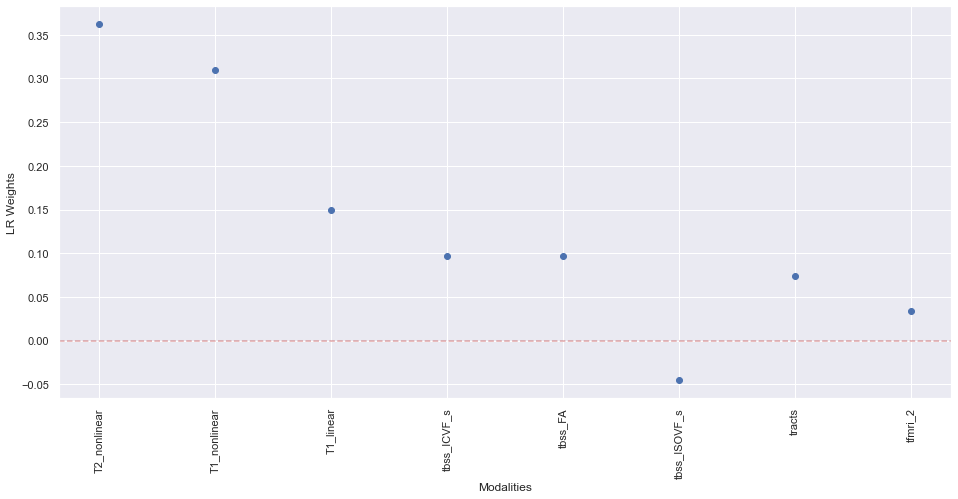

In [116]:
cutoff_weight = 0.04

misc_mod = coef_df[coef_df.abs_coef >= cutoff_weight].modalities.to_list()
x = ElasticNet_wrap(df_train, df_test, modalities=misc_mod, 
                              number_of_modalities=None, show_plots=False, verbose=True, 
                                cross_validation_flag = False, deconfound=True)
plt.figure(figsize=(16, 7.2))
plt.scatter(np.arange(0, x[5].shape[0]), x[1])
plt.xticks(np.arange(0, x[5].shape[0]), misc_mod, rotation=90);
plt.xlabel("Modalities")
plt.ylabel("LR Weights")
plt.axhline(y=0, color='r', linestyle='--', alpha=0.5);

## 1.2 Fitting Variables Progressivelly, in order of Beta-Weight-Coef value

In [117]:
coef_df

,modalities,coefficients,abs_coef
4,T2_nonlinear,0.349376,0.349376
0,T1_nonlinear,0.306988,0.306988
1,T1_linear,0.139973,0.139973
40,tbss_ICVF_s,0.085252,0.085252
48,tbss_FA,0.075180,0.075180
41,tbss_ISOVF_s,-0.059977,0.059977
38,tracts,0.059920,0.059920
33,tfmri_2,0.043641,0.043641
49,tbss_ICVF,0.036992,0.036992
42,tbss_L1_s,0.036104,0.036104


In [118]:
ordered_modalities0 = coef_df.modalities.to_list()

maes_list0 = []
number_of_modalities0 = []

for i in range(2, len(coef_df)+1):
    modalities0 = ordered_modalities0[:i]
    x = ElasticNet_wrap(df_train, df_test, modalities=modalities0, 
                              number_of_modalities=None, show_plots=False, verbose=False,
                       cross_validation_flag = False, deconfound=True)
    mae = x[3]    
    maes_list0.append(mae)
    number_of_modalities0.append(i)

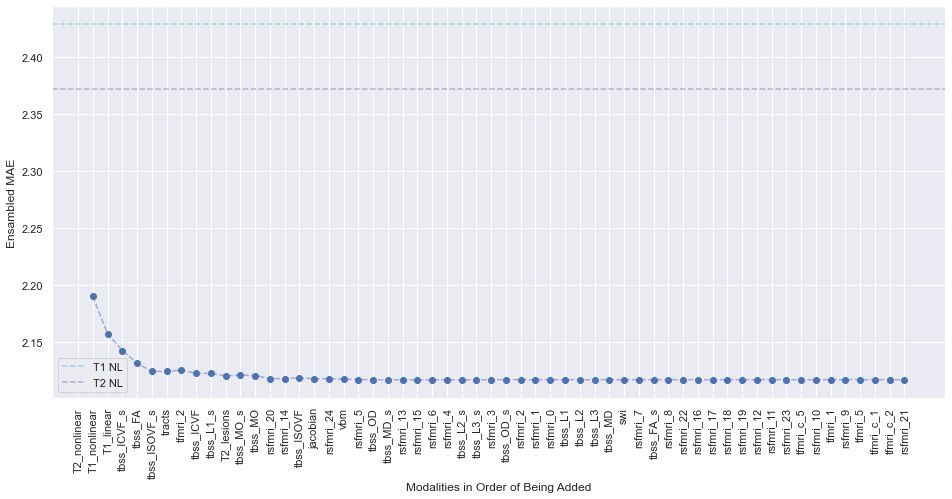

In [120]:
plt.figure(figsize=(16, 7.2))
plt.scatter(number_of_modalities0, maes_list0)
plt.plot(number_of_modalities0, maes_list0, 'b--', alpha=0.5)
plt.xticks(np.arange(1, Xtrain.shape[0]+1), ordered_modalities0, rotation=90);
plt.xlabel("Modalities in Order of Being Added")
plt.ylabel("Ensambled MAE")
plt.axhline(y=2.429, color='c', linestyle='--', alpha=0.5, label='T1 NL');
plt.axhline(y=2.372, color='m', linestyle='--', alpha=0.5, label='T2 NL');
plt.legend()

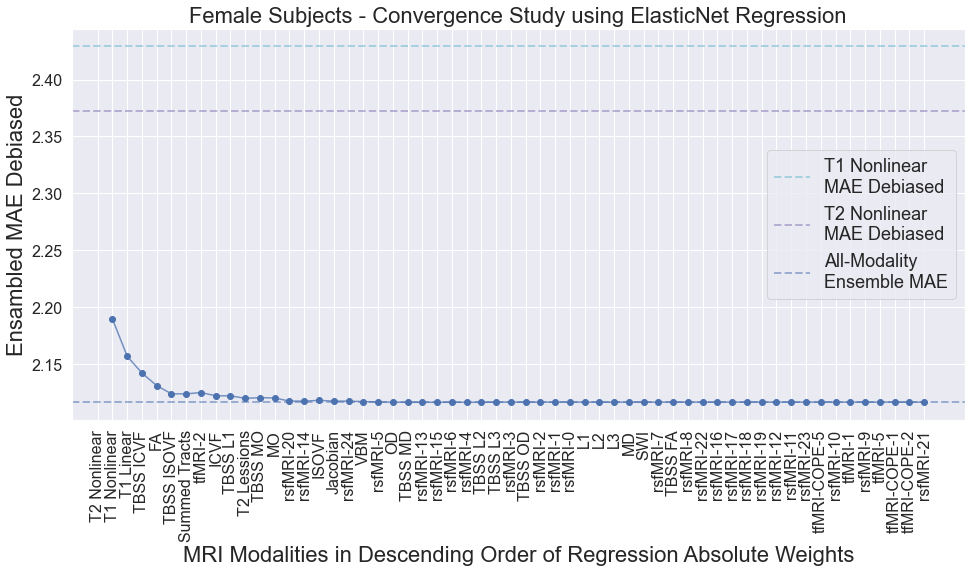

In [134]:
title_font_size=22
ticks_font_size=16
legend_font = 18
# figsize=(16, 9.6)

fig = plt.figure(figsize=(16, 7.2))
plt.scatter(number_of_modalities0, maes_list0)
plt.plot(number_of_modalities0, maes_list0, 'b-', alpha=0.75)
plt.xticks(np.arange(1, Xtrain.shape[0]+1), modality_labels, rotation=90, fontsize= ticks_font_size);
plt.yticks(fontsize=ticks_font_size);
plt.xlabel("MRI Modalities in Descending Order of Regression Absolute Weights", fontsize=title_font_size)
plt.ylabel("Ensambled MAE Debiased", fontsize=title_font_size)
plt.axhline(y=2.429, color='c', linestyle='--', alpha=0.5, label='T1 Nonlinear\nMAE Debiased', linewidth=2);
plt.axhline(y=2.372, color='m', linestyle='--', alpha=0.5, label='T2 Nonlinear\nMAE Debiased', linewidth=2);
plt.axhline(y=2.1167228276032124, color='b', linestyle='--', alpha=0.5, label='All-Modality\nEnsemble MAE', linewidth=2);
plt.legend(loc='center right', fontsize=legend_font)

plt.title('Female Subjects - Convergence Study using ElasticNet Regression', fontsize=title_font_size)

fig.savefig('Female_elastic_net_convergence_study.png', bbox_inches='tight')



# 2. Fitting Variables Progressivelly, in order of best Test MAEs

In [79]:
modality_decon_maes = []

for idx in range(len(df)):
    modality_decon_mae = np.abs(df.iloc[idx].dataframe.age_delta_decon).mean()
    modality_decon_maes.append(modality_decon_mae)
    
mae_df = pd.DataFrame.from_dict({
    'modality': df.modality.to_list(),
    'mae_decon': modality_decon_maes
})

mae_df = mae_df.sort_values('mae_decon')
mae_df.head()

,modality,mae_decon
4,T2_nonlinear,2.372096
0,T1_nonlinear,2.429445
1,T1_linear,2.549555
3,vbm,2.925637
49,tbss_ICVF,2.951742


In [80]:
ordered_modalities = mae_df.modality.to_list()
maes_list = []
prs_list = []
number_of_modalities = []

for i in range(2, len(mae_df)+1):
    modalities = ordered_modalities[:i]
    x = ElasticNet_wrap(df_train, df_test, modalities=modalities, 
                              number_of_modalities=None, show_plots=False, verbose=False,
                             cross_validation_flag = False, deconfound=True)
    mae = x[3]
    pr = x[4]
    maes_list.append(mae)
    prs_list.append(pr)
    number_of_modalities.append(i)

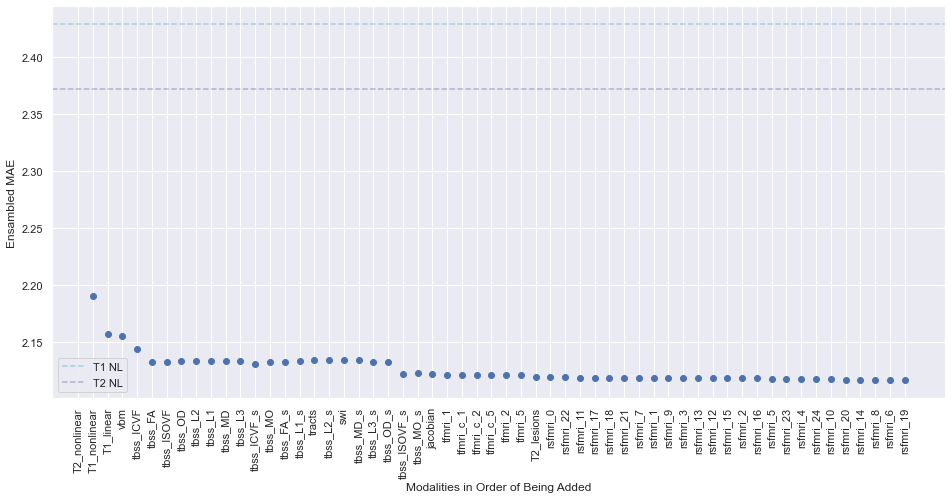

In [81]:
plt.figure(figsize=(16, 7.2))
plt.scatter(number_of_modalities, maes_list)
plt.xticks(np.arange(1, Xtrain.shape[0]+1), ordered_modalities, rotation=90);
plt.xlabel("Modalities in Order of Being Added")
plt.ylabel("Ensambled MAE")
plt.axhline(y=2.429, color='c', linestyle='--', alpha=0.5, label='T1 NL');
plt.axhline(y=2.372, color='m', linestyle='--', alpha=0.5, label='T2 NL');
plt.legend()

# 3. Fitting Variables Progressivelly, in order of best Train MAEs

In [82]:
modality_decon_maest = []

for idx in range(len(dft)):
    modality_decon_maet = np.abs(dft.iloc[idx].dataframe.age_delta_decon).mean()
    modality_decon_maest.append(modality_decon_maet)
    
mae_dft = pd.DataFrame.from_dict({
    'modality': dft.modality.to_list(),
    'mae_decon': modality_decon_maest
})

mae_dft = mae_dft.sort_values('mae_decon')
mae_dft.head()

,modality,mae_decon
0,T1_nonlinear,0.637949
1,T1_linear,0.652155
55,tbss_MO,0.685403
32,tfmri_1,0.917476
6,swi,1.199708


In [83]:
ordered_modalitiest = mae_dft.modality.to_list()
maes_listt = []
number_of_modalitiest = []

for i in range(2, len(mae_df)+1):
    modalities = ordered_modalitiest[:i]
    x = ElasticNet_wrap(df_train, df_test, modalities=modalities, 
                              number_of_modalities=None, show_plots=False, verbose=False,
                       cross_validation_flag = False, deconfound=True)
    mae = x[3]
    maes_listt.append(mae)
    number_of_modalitiest.append(i)

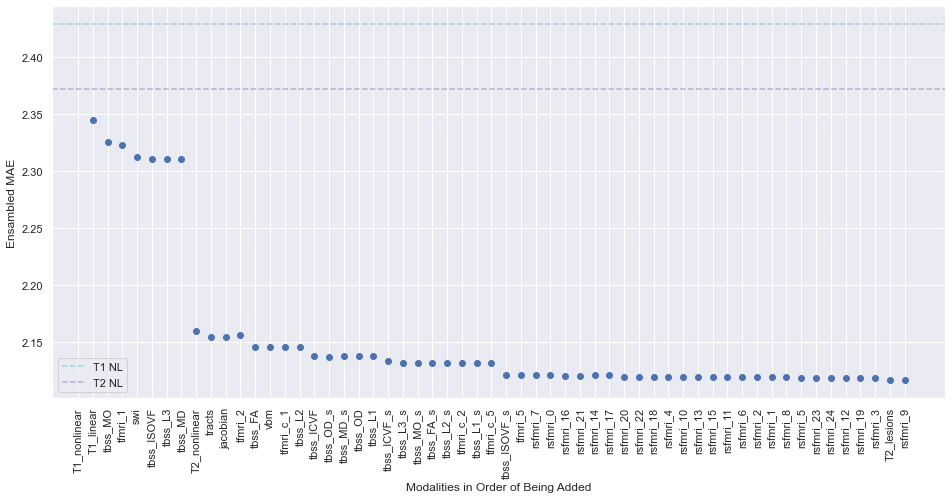

In [84]:
plt.figure(figsize=(16, 7.2))
plt.scatter(number_of_modalitiest, maes_listt)
plt.xticks(np.arange(1, Xtrain.shape[0]+1), ordered_modalitiest, rotation=90);
plt.xlabel("Modalities in Order of Being Added")
plt.ylabel("Ensambled MAE")
plt.axhline(y=2.429, color='c', linestyle='--', alpha=0.5, label='T1 NL');
plt.axhline(y=2.372, color='m', linestyle='--', alpha=0.5, label='T2 NL');
plt.legend()

# 4. Fit Model to subgroups of variables (Notebook 4)

In [85]:
custom_modalities = ['T1_nonlinear', 'rsfmri_0', 'tfmri_1', 'tracts', 'tbss_FA']
custom_modalities_2 = ['T2_nonlinear', 'rsfmri_0', 'tfmri_1', 'tracts', 'tbss_ICVF']
custom_modalities_3 = ['T1_nonlinear', 'T2_nonlinear', 'swi', 'tracts', 'rsfmri_0', 'tfmri_1']

MAE= 2.14462465098021
PR= 0.928872013945168
Time To Complete: 0:00:00.001875
MAE Decon= 2.3282172961735204
PR Decon= 0.9288720139451682


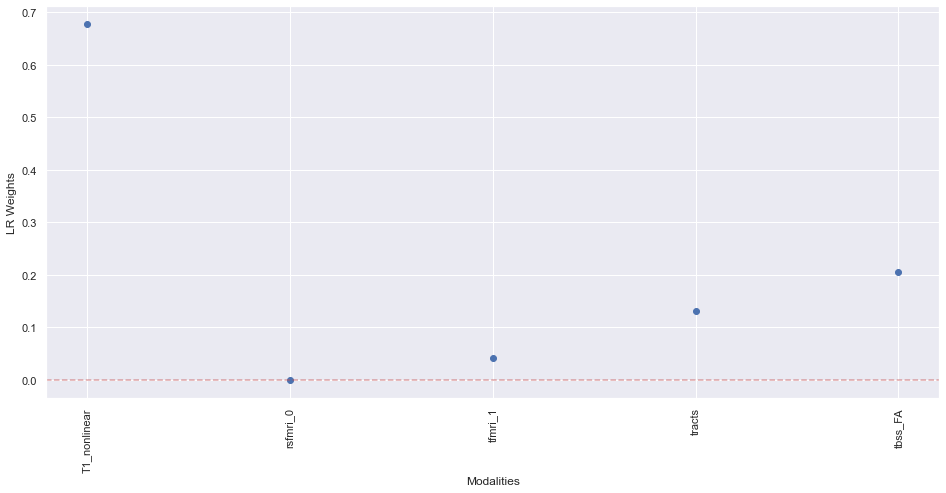

In [86]:
x = ElasticNet_wrap(df_train, df_test, modalities=custom_modalities, 
                              number_of_modalities=None, show_plots=False, verbose=True,
                         cross_validation_flag = False, deconfound=True)
plt.figure(figsize=(16, 7.2))
plt.scatter(np.arange(0, x[5].shape[0]), x[1])
plt.xticks(np.arange(0, x[5].shape[0]), custom_modalities, rotation=90);
plt.xlabel("Modalities")
plt.ylabel("LR Weights")
plt.axhline(y=0, color='r', linestyle='--', alpha=0.5);

MAE= 2.0945602346774708
PR= 0.9320344251746703
Time To Complete: 0:00:00.001746
MAE Decon= 2.2538924098365687
PR Decon= 0.9320344251746705


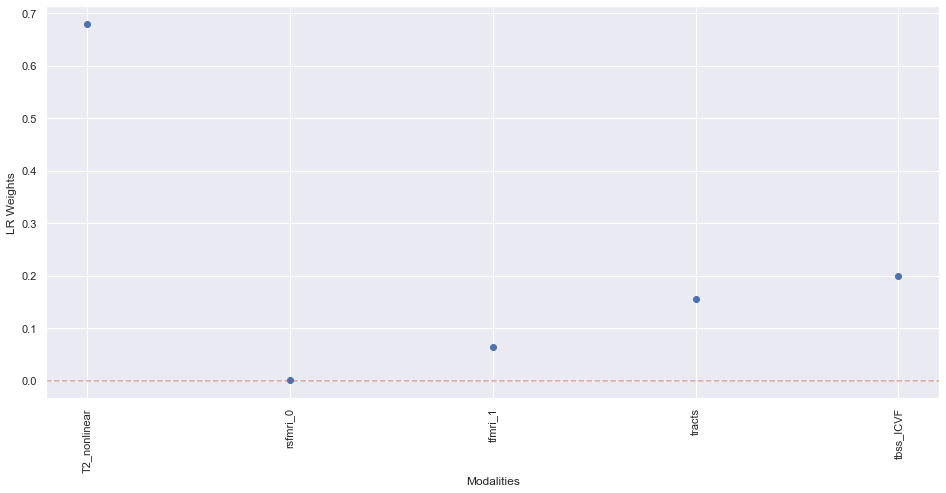

In [87]:
x = ElasticNet_wrap(df_train, df_test, modalities=custom_modalities_2, 
                              number_of_modalities=None, show_plots=False, verbose=True,
                   cross_validation_flag = False, deconfound=True)
plt.figure(figsize=(16, 7.2))
plt.scatter(np.arange(0, x[5].shape[0]), x[1])
plt.xticks(np.arange(0, x[5].shape[0]), custom_modalities_2, rotation=90);
plt.xlabel("Modalities")
plt.ylabel("LR Weights")
plt.axhline(y=0, color='r', linestyle='--', alpha=0.5);

MAE= 2.0311779969012944
PR= 0.9362641413976182
Time To Complete: 0:00:00.001984
MAE Decon= 2.1751348793180583
PR Decon= 0.9362641413976182


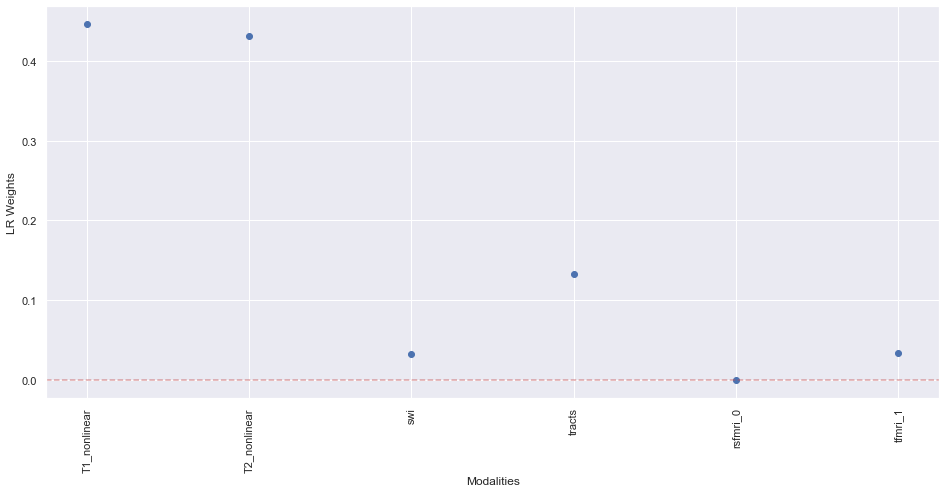

In [88]:
x = ElasticNet_wrap(df_train, df_test, modalities=custom_modalities_3, 
                              number_of_modalities=None, show_plots=False, verbose=True,
                         cross_validation_flag = False, deconfound=True)
plt.figure(figsize=(16, 7.2))
plt.scatter(np.arange(0, x[5].shape[0]), x[1])
plt.xticks(np.arange(0, x[5].shape[0]), custom_modalities_3, rotation=90);
plt.xlabel("Modalities")
plt.ylabel("LR Weights")
plt.axhline(y=0, color='r', linestyle='--', alpha=0.5);

In [89]:
df_test.head()

,T1_nonlinear,T1_linear,jacobian,vbm,T2_nonlinear,T2_lesions,swi,rsfmri_0,rsfmri_1,rsfmri_2,...,tbss_FA,tbss_ICVF,tbss_ISOVF,tbss_L1,tbss_L2,tbss_L3,tbss_MD,tbss_MO,tbss_OD,target_age
4782,63.242840,60.355662,59.177989,60.538992,60.568585,64.279689,61.004917,61.451899,65.815619,54.009106,...,59.670480,59.256958,60.796351,59.529524,60.708833,61.508114,58.473717,63.444120,60.847814,59.311073
1499,65.738404,64.550203,64.118985,61.991364,61.348681,58.357935,61.555806,63.819972,65.788400,63.894708,...,60.738383,62.307837,59.973627,61.838904,59.055421,59.413115,60.391799,60.673612,61.059331,67.523907
1355,70.614193,72.846405,67.257215,67.865927,67.952662,64.827625,69.416208,67.035893,72.286382,69.549343,...,69.974695,69.134120,70.155668,70.540548,68.804543,70.383452,70.302002,69.434500,68.681620,72.236872
428,66.499747,65.836336,69.453427,70.455682,68.372493,74.654607,67.507990,67.177075,65.981235,64.564125,...,68.720490,68.486243,63.138453,66.291610,65.741440,64.522894,65.988057,69.207203,63.802098,69.261758
4145,52.520388,50.636996,50.202714,55.596379,52.397855,54.866074,51.204718,54.455219,52.328196,53.205974,...,51.799659,53.298255,51.957278,51.934909,52.661677,51.843652,52.028369,53.210644,50.714350,48.488699


In [25]:
def combination_ensambling(df, df_train, df_test, custom_modalities=None, 
                           min_objects=None, max_objects=None, verbose=True):
       
    ensamble_names = []
    ensambled_dfs = []
    mae_improvements = []
    min_single_maes = []
    ensambled_maes = []
    
    if verbose:
        print("{:13} : {:6}  |  {:5} ".format('Modality', 'MAE', "PR"))
        print('-----------------------------------------------------------------------------------------------')
    
    
    modalities = df.modality.to_list()
    subjects = df.iloc[0].dataframe['Unnamed: 0'].to_list()
    
    if custom_modalities == None:
        custom_modalities = modalities
    
    objects = len(custom_modalities)
    
    if min_objects == None:
        min_objects = 2
    
    if max_objects == None:
        max_objects = objects+1
    else:
        max_objects = max_objects+1
    
    for sample in range(min_objects, max_objects):
        for subset in itertools.combinations(custom_modalities, sample):
            subset = list(subset)

            component_age_delta_decon_mean = []
            for modality in subset:
                component_age_delta_decon_mean.append(np.abs(df.iloc[modalities.index(modality)].dataframe.age_delta_decon).mean())

            x = ElasticNet_wrap(df_train, df_test, modalities=subset, 
                              number_of_modalities=None, show_plots=False, verbose=False,
                               cross_validation_flag = False, deconfound=True)
            
            mae = x[3]
            pr = x[4]

            if (mae < np.array(component_age_delta_decon_mean)).all():
                
                if verbose:
                    print(subset)
                
                name = ''
                
                for modality in subset:
                    if verbose:
                        print('{:13} :  {:.3f}  |  {:.3f}'.format(
                            modality, 
                            np.abs(df.iloc[modalities.index(modality)].dataframe.age_delta_decon).mean(),
                            pearsonr(df.iloc[modalities.index(modality)].dataframe.target_age, df.iloc[modalities.index(modality)].dataframe.output_age_decon)[0]))
                    if name == '':
                        name = modality
                    else:
                        name += ' '
                        name += modality
                if verbose:
                    print('{:13} :  {:.3f}  |  {:.3f}'.format(
                        'Ensamble', 
                        mae,
                        pr,
                    ))

                ensamble_names.append(name)
                
                mae_improvement = min(np.array(component_age_delta_decon_mean)) - mae
                mae_improvements.append(mae_improvement)
                
                min_single_mae = min(np.array(component_age_delta_decon_mean))
                min_single_maes.append(min_single_mae)

                ensambled_maes.append(mae)
                
                if verbose:
                    print('------------------------------------------------------------')
                
    ensamble_dct = {'modality': ensamble_names,
                    'min_single_mae': min_single_maes, 'ensambled_mae': ensambled_maes,
                    'mae_improvement': mae_improvements}
    ensamble_dct = pd.DataFrame.from_dict(ensamble_dct)
    
    return ensamble_dct

In [91]:
tmp_dct = combination_ensambling(df, df_train, df_test, custom_modalities=custom_modalities, 
                           min_objects=None, max_objects=None, verbose=True)

Modality      : MAE     |  PR    
-----------------------------------------------------------------------------------------------
['T1_nonlinear', 'tracts']
T1_nonlinear  :  2.429  |  0.924
tracts        :  3.614  |  0.848
Ensamble      :  2.388  |  0.925
------------------------------------------------------------
['T1_nonlinear', 'tbss_FA']
T1_nonlinear  :  2.429  |  0.924
tbss_FA       :  2.997  |  0.887
Ensamble      :  2.337  |  0.929
------------------------------------------------------------
['rsfmri_0', 'tfmri_1']
rsfmri_0      :  5.711  |  0.712
tfmri_1       :  4.250  |  0.807
Ensamble      :  4.152  |  0.813
------------------------------------------------------------
['rsfmri_0', 'tbss_FA']
rsfmri_0      :  5.711  |  0.712
tbss_FA       :  2.997  |  0.887
Ensamble      :  2.991  |  0.887
------------------------------------------------------------
['tfmri_1', 'tracts']
tfmri_1       :  4.250  |  0.807
tracts        :  3.614  |  0.848
Ensamble      :  3.319  |  0.867
------

In [92]:
tmp_dct.sort_values('mae_improvement', ascending=False)

,modality,min_single_mae,ensambled_mae,mae_improvement
4,tfmri_1 tracts,3.613602,3.319138,0.294464
12,rsfmri_0 tfmri_1 tracts,3.613602,3.319332,0.294269
20,rsfmri_0 tfmri_1 tracts tbss_FA,2.997422,2.844514,0.152907
15,tfmri_1 tracts tbss_FA,2.997422,2.844527,0.152895
5,tfmri_1 tbss_FA,2.997422,2.885613,0.111808
13,rsfmri_0 tfmri_1 tbss_FA,2.997422,2.887221,0.110201
19,T1_nonlinear tfmri_1 tracts tbss_FA,2.429445,2.328214,0.101230
21,T1_nonlinear rsfmri_0 tfmri_1 tracts tbss_FA,2.429445,2.328217,0.101227
18,T1_nonlinear rsfmri_0 tracts tbss_FA,2.429445,2.329870,0.099575
11,T1_nonlinear tracts tbss_FA,2.429445,2.329885,0.099559


In [93]:
tmp_dct.sort_values('ensambled_mae')

,modality,min_single_mae,ensambled_mae,mae_improvement
19,T1_nonlinear tfmri_1 tracts tbss_FA,2.429445,2.328214,0.101230
21,T1_nonlinear rsfmri_0 tfmri_1 tracts tbss_FA,2.429445,2.328217,0.101227
18,T1_nonlinear rsfmri_0 tracts tbss_FA,2.429445,2.329870,0.099575
11,T1_nonlinear tracts tbss_FA,2.429445,2.329885,0.099559
17,T1_nonlinear rsfmri_0 tfmri_1 tbss_FA,2.429445,2.335269,0.094175
10,T1_nonlinear tfmri_1 tbss_FA,2.429445,2.335274,0.094171
1,T1_nonlinear tbss_FA,2.429445,2.336843,0.092601
8,T1_nonlinear rsfmri_0 tbss_FA,2.429445,2.338164,0.091280
9,T1_nonlinear tfmri_1 tracts,2.429445,2.377868,0.051577
16,T1_nonlinear rsfmri_0 tfmri_1 tracts,2.429445,2.378162,0.051283


In [94]:
tmp_dct_2 = combination_ensambling(df, df_train, df_test, custom_modalities=custom_modalities_2, 
                           min_objects=None, max_objects=None, verbose=True)

Modality      : MAE     |  PR    
-----------------------------------------------------------------------------------------------
['T2_nonlinear', 'rsfmri_0']
T2_nonlinear  :  2.372  |  0.925
rsfmri_0      :  5.711  |  0.712
Ensamble      :  2.348  |  0.926
------------------------------------------------------------
['T2_nonlinear', 'tfmri_1']
T2_nonlinear  :  2.372  |  0.925
tfmri_1       :  4.250  |  0.807
Ensamble      :  2.308  |  0.928
------------------------------------------------------------
['T2_nonlinear', 'tracts']
T2_nonlinear  :  2.372  |  0.925
tracts        :  3.614  |  0.848
Ensamble      :  2.304  |  0.929
------------------------------------------------------------
['T2_nonlinear', 'tbss_ICVF']
T2_nonlinear  :  2.372  |  0.925
tbss_ICVF     :  2.952  |  0.891
Ensamble      :  2.281  |  0.931
------------------------------------------------------------
['rsfmri_0', 'tfmri_1']
rsfmri_0      :  5.711  |  0.712
tfmri_1       :  4.250  |  0.807
Ensamble      :  4.152  | 

In [95]:
tmp_dct_2.sort_values('ensambled_mae')

,modality,min_single_mae,ensambled_mae,mae_improvement
22,T2_nonlinear tfmri_1 tracts tbss_ICVF,2.372096,2.253723,0.118373
24,T2_nonlinear rsfmri_0 tfmri_1 tracts tbss_ICVF,2.372096,2.253892,0.118204
14,T2_nonlinear tracts tbss_ICVF,2.372096,2.262118,0.109978
21,T2_nonlinear rsfmri_0 tracts tbss_ICVF,2.372096,2.265432,0.106664
13,T2_nonlinear tfmri_1 tbss_ICVF,2.372096,2.268117,0.103979
20,T2_nonlinear rsfmri_0 tfmri_1 tbss_ICVF,2.372096,2.270547,0.101549
3,T2_nonlinear tbss_ICVF,2.372096,2.281062,0.091034
11,T2_nonlinear rsfmri_0 tbss_ICVF,2.372096,2.285026,0.087070
12,T2_nonlinear tfmri_1 tracts,2.372096,2.285565,0.086531
19,T2_nonlinear rsfmri_0 tfmri_1 tracts,2.372096,2.288140,0.083956


In [96]:
tmp_dct_3 = combination_ensambling(df, df_train, df_test, custom_modalities=custom_modalities_3, 
                           min_objects=None, max_objects=None, verbose=True)

Modality      : MAE     |  PR    
-----------------------------------------------------------------------------------------------
['T1_nonlinear', 'T2_nonlinear']
T1_nonlinear  :  2.429  |  0.924
T2_nonlinear  :  2.372  |  0.925
Ensamble      :  2.190  |  0.936
------------------------------------------------------------
['T1_nonlinear', 'swi']
T1_nonlinear  :  2.429  |  0.924
swi           :  3.626  |  0.848
Ensamble      :  2.404  |  0.925
------------------------------------------------------------
['T1_nonlinear', 'tracts']
T1_nonlinear  :  2.429  |  0.924
tracts        :  3.614  |  0.848
Ensamble      :  2.388  |  0.925
------------------------------------------------------------
['T2_nonlinear', 'swi']
T2_nonlinear  :  2.372  |  0.925
swi           :  3.626  |  0.848
Ensamble      :  2.327  |  0.928
------------------------------------------------------------
['T2_nonlinear', 'tracts']
T2_nonlinear  :  2.372  |  0.925
tracts        :  3.614  |  0.848
Ensamble      :  2.304  |  0.

rsfmri_0      :  5.711  |  0.712
tfmri_1       :  4.250  |  0.807
Ensamble      :  2.307  |  0.929
------------------------------------------------------------
['T2_nonlinear', 'tracts', 'rsfmri_0', 'tfmri_1']
T2_nonlinear  :  2.372  |  0.925
tracts        :  3.614  |  0.848
rsfmri_0      :  5.711  |  0.712
tfmri_1       :  4.250  |  0.807
Ensamble      :  2.288  |  0.930
------------------------------------------------------------
['swi', 'tracts', 'rsfmri_0', 'tfmri_1']
swi           :  3.626  |  0.848
tracts        :  3.614  |  0.848
rsfmri_0      :  5.711  |  0.712
tfmri_1       :  4.250  |  0.807
Ensamble      :  3.013  |  0.887
------------------------------------------------------------
['T1_nonlinear', 'T2_nonlinear', 'swi', 'tracts', 'rsfmri_0']
T1_nonlinear  :  2.429  |  0.924
T2_nonlinear  :  2.372  |  0.925
swi           :  3.626  |  0.848
tracts        :  3.614  |  0.848
rsfmri_0      :  5.711  |  0.712
Ensamble      :  2.178  |  0.936
-------------------------------------

In [97]:
tmp_dct_3.sort_values('ensambled_mae')

,modality,min_single_mae,ensambled_mae,mae_improvement
35,T1_nonlinear T2_nonlinear tracts tfmri_1,2.372096,2.173974,0.198123
49,T1_nonlinear T2_nonlinear tracts rsfmri_0 tfmri_1,2.372096,2.173974,0.198123
47,T1_nonlinear T2_nonlinear swi tracts tfmri_1,2.372096,2.175135,0.196961
52,T1_nonlinear T2_nonlinear swi tracts rsfmri_0 ...,2.372096,2.175135,0.196961
13,T1_nonlinear T2_nonlinear tracts,2.372096,2.177226,0.194870
31,T1_nonlinear T2_nonlinear swi tracts,2.372096,2.177288,0.194808
46,T1_nonlinear T2_nonlinear swi tracts rsfmri_0,2.372096,2.177578,0.194518
34,T1_nonlinear T2_nonlinear tracts rsfmri_0,2.372096,2.178702,0.193395
33,T1_nonlinear T2_nonlinear swi tfmri_1,2.372096,2.184258,0.187838
15,T1_nonlinear T2_nonlinear tfmri_1,2.372096,2.184931,0.187165


## 4.1. Attempt at Multiple Combinations - with 2

In [26]:
modalities = df.modality.to_list()
corr_output_age_decons = []
corr_age_delta_decons = []
ensamble_names = []
min_maes = []
ensambled_maes = []

for subset in itertools.combinations(modalities, 2):
    subset = list(subset)
    ensamble_name = subset[0] + ' ' + subset[1]
    ensamble_names.append(ensamble_name)
    
    corr_output_age_decon = pearsonr(df.iloc[modalities.index(subset[0])].dataframe.output_age_decon, 
                                    df.iloc[modalities.index(subset[1])].dataframe.output_age_decon)[0]
    corr_output_age_decons.append(corr_output_age_decon)
    
    corr_age_delta_decon = pearsonr(df.iloc[modalities.index(subset[0])].dataframe.age_delta_decon, 
                                    df.iloc[modalities.index(subset[1])].dataframe.age_delta_decon)[0]
    corr_age_delta_decons.append(corr_age_delta_decon)
    
    min_mae = min(
                    np.abs(df.iloc[modalities.index(subset[0])].dataframe.age_delta_decon).mean(),
                    np.abs(df.iloc[modalities.index(subset[1])].dataframe.age_delta_decon).mean()
    )
    min_maes.append(min_mae)
           
    ensambled_mae = ElasticNet_wrap(df_train, df_test, modalities=subset, 
                              number_of_modalities=None, show_plots=False, verbose=False,
                                   cross_validation_flag = False, deconfound=True)[3]
    ensambled_maes.append(ensambled_mae)
    
    
    
pr_df = pd.DataFrame.from_dict({
    'ensamble_name': ensamble_names,
    'corr_output_age_decon': corr_output_age_decons,
    'corr_age_delta_decon' : corr_age_delta_decons,
    'min_mae': min_maes,
    'ensambled_mae': ensambled_maes,
})

pr_df['mae_improvements'] = pr_df['min_mae'] - pr_df['ensambled_mae']



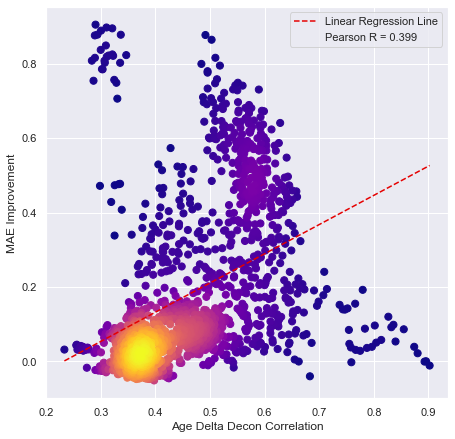

In [27]:
scatter_plot_heatmap(x=pr_df.corr_age_delta_decon, y=pr_df.mae_improvements, 
                     xlabel='Age Delta Decon Correlation', 
                   ylabel='MAE Improvement', title=None, set_scale=False, 
                   equality_line=False)

In [100]:
pr_df[pr_df.mae_improvements >= 0.7].sort_values('ensambled_mae')

,ensamble_name,corr_output_age_decon,corr_age_delta_decon,min_mae,ensambled_mae,mae_improvements
292,T2_lesions rsfmri_21,0.649280,0.290462,5.509571,4.604315,0.905256
293,T2_lesions rsfmri_22,0.661807,0.310517,5.509571,4.612167,0.897404
288,T2_lesions rsfmri_17,0.665654,0.321120,5.509571,4.614362,0.895209
278,T2_lesions rsfmri_7,0.653459,0.300602,5.509571,4.620319,0.889252
283,T2_lesions rsfmri_12,0.646034,0.294012,5.509571,4.630707,0.878864
271,T2_lesions rsfmri_0,0.680805,0.336737,5.509571,4.631764,0.877807
295,T2_lesions rsfmri_24,0.639015,0.289240,5.509571,4.633567,0.876004
276,T2_lesions rsfmri_5,0.650544,0.309370,5.509571,4.660221,0.849350
287,T2_lesions rsfmri_16,0.646841,0.300010,5.509571,4.672187,0.837383
280,T2_lesions rsfmri_9,0.662468,0.321224,5.509571,4.684380,0.825191


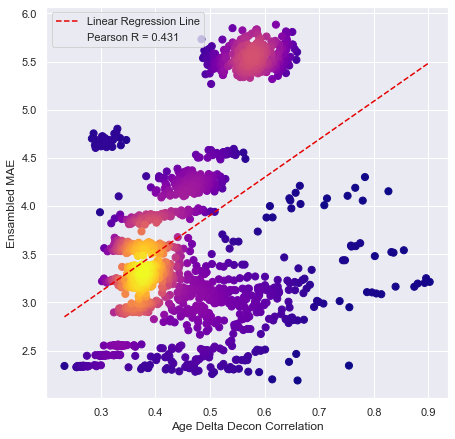

In [101]:
scatter_plot_heatmap(x=pr_df.corr_age_delta_decon, y=pr_df.ensambled_mae, 
                     xlabel='Age Delta Decon Correlation', 
                   ylabel='Ensambled MAE', title=None, set_scale=False, 
                   equality_line=False)

In [102]:
pr_df[(pr_df.ensambled_mae <= 2.3) & (pr_df.mae_improvements > 0)].sort_values('ensambled_mae')

,ensamble_name,corr_output_age_decon,corr_age_delta_decon,min_mae,ensambled_mae,mae_improvements
3,T1_nonlinear T2_nonlinear,0.950525,0.660433,2.372096,2.190087,0.182009
58,T1_linear T2_nonlinear,0.940698,0.614030,2.372096,2.201549,0.170547
261,T2_nonlinear tbss_FA,0.909119,0.503908,2.372096,2.257009,0.115088
269,T2_nonlinear tbss_OD,0.904035,0.507414,2.372096,2.276339,0.095757
165,vbm T2_nonlinear,0.926968,0.590078,2.372096,2.276788,0.095308
253,T2_nonlinear tbss_ICVF_s,0.893361,0.472986,2.372096,2.280603,0.091494
262,T2_nonlinear tbss_ICVF,0.922437,0.570215,2.372096,2.281062,0.091034
252,T2_nonlinear tbss_FA_s,0.882704,0.443728,2.372096,2.284787,0.087309
268,T2_nonlinear tbss_MO,0.890697,0.479139,2.372096,2.291116,0.080981


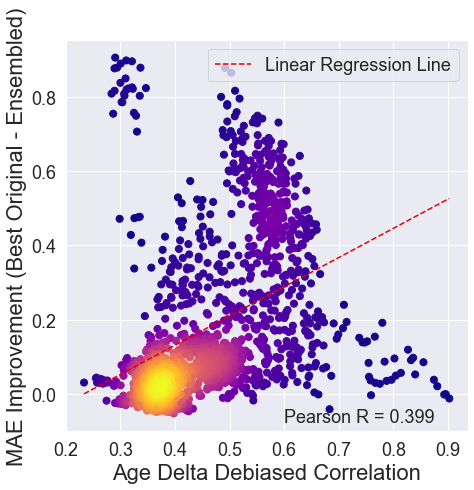

In [28]:
title_font_size=22
ticks_font_size=18
legend_font = 18
figsize=(7.2, 7.2)

x=pr_df.corr_age_delta_decon
y=pr_df.mae_improvements
xlabel='Age Delta Debiased Correlation'
ylabel='MAE Improvement (Best Original - Ensembled)'
title=None
set_scale=False 
equality_line=False


if isinstance(x, pd.Series):
    x = x.to_numpy()

if isinstance(y, pd.Series):
    y = y.to_numpy()

fig = plt.figure(figsize=figsize)

sns.set_style("darkgrid", {'image.cmap': u'plasma'})
xy = np.vstack([x,y])
z = gaussian_kde(xy)(xy)
# Sort the points by density, so that the densest points are plotted last
idx = z.argsort()
x, y, z = x[idx], y[idx], z[idx]
plt.scatter(x,y,c=z,s=50)
if equality_line == True:
    plt.plot(x, x, ls="-", color = sns.xkcd_rgb['black'], label='Equality Line') #this is just the line of equality

X_mat=np.vstack((np.ones(len(x)), x)).T
beta_hat = np.linalg.inv(X_mat.T.dot(X_mat)).dot(X_mat.T).dot(y)
b,w = beta_hat[0],beta_hat[1]
x2 = np.linspace(np.min(x),np.max(x),num=10)
y2 = w * x2 + b
plt.plot(x2,y2,ls='--', color= sns.xkcd_rgb['red'], label='Linear Regression Line')

pearson_correlation = pearsonr(x,y)[0]
text_x = 0.6
text_y = -0.075
lbl = 'Pearson R = '+str(round(pearson_correlation,3))
plt.text(text_x, text_y, lbl, fontsize=legend_font)

if set_scale == True:
    x_min, x_max = np.min(x), np.max(x)
    y_min, y_max = np.min(y), np.max(y)
    c_min, c_max = min(x_min, y_min), max(x_max, y_max)
    plt.xlim([c_min-2, c_max+2])
    plt.ylim([c_min-2, c_max+2])

plt.xlabel(xlabel, fontsize = title_font_size)
plt.ylabel(ylabel, fontsize = title_font_size)

plt.xticks(fontsize=ticks_font_size)
plt.yticks(fontsize=ticks_font_size)


# plt.plot([],[],' ',label=lbl)

plt.title(title, fontsize= title_font_size)
plt.legend(fontsize = legend_font)
plt.show()

fig.savefig('Female_elastic_net_ensembling_mae_improvement_vs_correlation.png', bbox_inches='tight', facecolor='white')



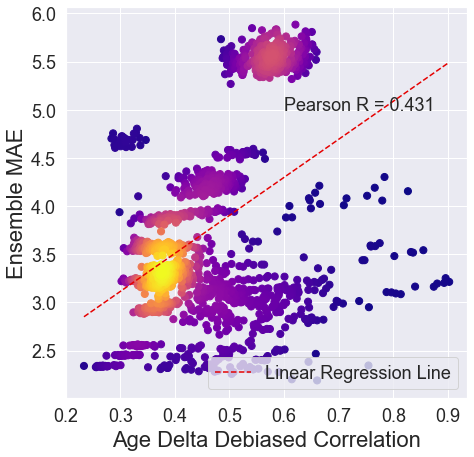

In [29]:
title_font_size=22
ticks_font_size=18
legend_font = 18
figsize=(7.2, 7.2)

x=pr_df.corr_age_delta_decon
y=pr_df.ensambled_mae
xlabel='Age Delta Debiased Correlation'
ylabel='Ensemble MAE'
title=None
set_scale=False 
equality_line=False


if isinstance(x, pd.Series):
    x = x.to_numpy()

if isinstance(y, pd.Series):
    y = y.to_numpy()

fig = plt.figure(figsize=figsize)

sns.set_style("darkgrid", {'image.cmap': u'plasma'})
xy = np.vstack([x,y])
z = gaussian_kde(xy)(xy)
# Sort the points by density, so that the densest points are plotted last
idx = z.argsort()
x, y, z = x[idx], y[idx], z[idx]
plt.scatter(x,y,c=z,s=50)
if equality_line == True:
    plt.plot(x, x, ls="-", color = sns.xkcd_rgb['black'], label='Equality Line') #this is just the line of equality

X_mat=np.vstack((np.ones(len(x)), x)).T
beta_hat = np.linalg.inv(X_mat.T.dot(X_mat)).dot(X_mat.T).dot(y)
b,w = beta_hat[0],beta_hat[1]
x2 = np.linspace(np.min(x),np.max(x),num=10)
y2 = w * x2 + b
plt.plot(x2,y2,ls='--', color= sns.xkcd_rgb['red'], label='Linear Regression Line')

pearson_correlation = pearsonr(x,y)[0]
text_x = 0.6
text_y = 5
lbl = 'Pearson R = '+str(round(pearson_correlation,3))
plt.text(text_x, text_y, lbl, fontsize=legend_font)

if set_scale == True:
    x_min, x_max = np.min(x), np.max(x)
    y_min, y_max = np.min(y), np.max(y)
    c_min, c_max = min(x_min, y_min), max(x_max, y_max)
    plt.xlim([c_min-2, c_max+2])
    plt.ylim([c_min-2, c_max+2])

plt.xlabel(xlabel, fontsize = title_font_size)
plt.ylabel(ylabel, fontsize = title_font_size)

plt.xticks(fontsize=ticks_font_size)
plt.yticks(fontsize=ticks_font_size)


# plt.plot([],[],' ',label=lbl)

plt.title(title, fontsize= title_font_size)
plt.legend(fontsize = legend_font)
plt.show()

fig.savefig('Female_elastic_net_ensembling_ensemble_mae_vs_correlation.png', bbox_inches='tight', facecolor='white')



## Attempt at Multiple Combinations with 3

In [103]:
modalities = df.modality.to_list()
ensamble_names = []
min_maes = []
ensambled_maes = []

for subset in itertools.combinations(modalities, 3):
    subset = list(subset)
    ensamble_name = subset[0] + ' ' + subset[1] + ' ' + subset[2]
    ensamble_names.append(ensamble_name)
    
    min_mae = min(
                    np.abs(df.iloc[modalities.index(subset[0])].dataframe.age_delta_decon).mean(),
                    np.abs(df.iloc[modalities.index(subset[1])].dataframe.age_delta_decon).mean(),
                    np.abs(df.iloc[modalities.index(subset[2])].dataframe.age_delta_decon).mean()
    )
    min_maes.append(min_mae)
           
    ensambled_mae = ElasticNet_wrap(df_train, df_test, modalities=subset, 
                              number_of_modalities=None, show_plots=False, verbose=False,
                                   cross_validation_flag = False, deconfound=True)[3]
    ensambled_maes.append(ensambled_mae)
    
    
    
pr_df2 = pd.DataFrame.from_dict({
    'ensamble_name': ensamble_names,
    'min_mae': min_maes,
    'ensambled_mae': ensambled_maes,
})

pr_df2['mae_improvements'] = pr_df2['min_mae'] - pr_df2['ensambled_mae']

In [104]:
print(len(pr_df2))
pr_df2[(pr_df2.ensambled_mae <= 2.275) & (pr_df2.mae_improvements > 0)].sort_values('ensambled_mae')

29260


,ensamble_name,min_mae,ensambled_mae,mae_improvements
205,T1_nonlinear T2_nonlinear tbss_FA,2.372096,2.156044,0.216052
2,T1_nonlinear T1_linear T2_nonlinear,2.372096,2.156956,0.215141
196,T1_nonlinear T2_nonlinear tbss_FA_s,2.372096,2.163922,0.208175
206,T1_nonlinear T2_nonlinear tbss_ICVF,2.372096,2.165617,0.206479
204,T1_nonlinear T2_nonlinear tbss_OD_s,2.372096,2.165788,0.206308
...,...,...,...,...
6256,T2_nonlinear rsfmri_6 tbss_OD,2.372096,2.274646,0.097450
4465,vbm T2_nonlinear rsfmri_7,2.372096,2.274785,0.097311
6379,T2_nonlinear rsfmri_9 tbss_OD,2.372096,2.274790,0.097306
7135,T2_nonlinear tbss_ICVF tbss_L3,2.372096,2.274809,0.097287


# 5. Fit Model to highly correlated groups (Notebook 4)

In [105]:
smri_mod = modalities[:7]
rsfmri_mod = modalities[7:32]
tfmri_mod = modalities[32:38]
dmri_mod = modalities[38:]
tbss_s_mod = dmri_mod[1:10]
tbss_mod = dmri_mod[10:]

rsfmri_jac_mod = rsfmri_mod + ['jacobian']
tfmri_jac_mod = tfmri_mod + ['jacobian']

fmri_mod = rsfmri_mod + tfmri_mod
fmri_jac_mod = rsfmri_mod + tfmri_mod + ['jacobian']

tbss_s_mod_tracts = dmri_mod[1:10] + ['tracts']
tbss_mod_tract = dmri_mod[10:] + ['tracts']

mod_list = [smri_mod, rsfmri_mod, tfmri_mod, dmri_mod, tbss_s_mod, tbss_mod, rsfmri_jac_mod, tfmri_jac_mod, 
             fmri_mod, fmri_jac_mod, tbss_s_mod_tracts, tbss_mod_tract]
mod_names = ['smri_mod', 'rsfmri_mod', 'tfmri_mod', 'dmri_mod', 'tbss_s_mod', 'tbss_mod', 'rsfmri_jac_mod', 
             'tfmri_jac_mod', 'fmri_mod', 'fmri_jac_mod', 'tbss_s_mod_tracts', 'tbss_mod_tract']

modality_decon_maes = []

for idx in range(len(df)):
    modality_decon_mae = np.abs(df.iloc[idx].dataframe.age_delta_decon).mean()
    modality_decon_maes.append(modality_decon_mae)
    
mae_df = pd.DataFrame.from_dict({
    'modality': df.modality.to_list(),
    'mae_decon': modality_decon_maes
})

mae_df = mae_df.sort_values('mae_decon')
mae_df.head()

def ensamble_sub_modality_groups(sub_modality_group, mae_df, df, df_train, df_test, sub_modality_name):

    ordered_modalities = mae_df.modality.to_list()
    ordered_modalities = [modality for modality in ordered_modalities if modality in sub_modality_group]
    print(ordered_modalities)

    maes_list = []

    for i in range(2, len(ordered_modalities)+1):
        modalities = ordered_modalities[:i]
        x = ElasticNet_wrap(df_train, df_test, modalities=modalities, 
                              number_of_modalities=None, show_plots=False, verbose=False,
                           cross_validation_flag = False, deconfound=True)
                
        ensambled_mae = x[3]
        maes_list.append(ensambled_mae)
        number_of_modalitiest.append(i)
        
    plt.figure(figsize=(12.8, 4.8))
    plt.subplot(121)
    plt.plot(maes_list)
    plt.title(sub_modality_name)
    plt.plot([],[],' ',label='MIN MAE=' + str(min(maes_list)))
    plt.plot([],[],' ',label='MIN LOC=' + str(1 + np.argmin(np.array(maes_list))))
    plt.legend()
    plt.xlabel('No of Modalitities Ensambled with MAE Rank')
    plt.ylabel('Ensambled MAE')
    plt.show()
    
    print('-------')


['T2_nonlinear', 'T1_nonlinear', 'T1_linear', 'vbm', 'swi', 'jacobian', 'T2_lesions']


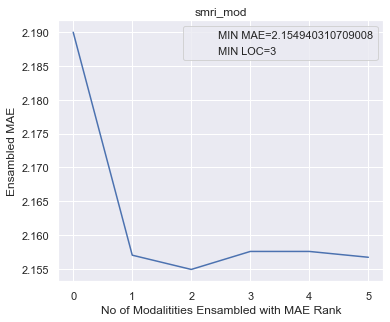

-------
['rsfmri_0', 'rsfmri_22', 'rsfmri_11', 'rsfmri_17', 'rsfmri_18', 'rsfmri_21', 'rsfmri_7', 'rsfmri_1', 'rsfmri_9', 'rsfmri_3', 'rsfmri_13', 'rsfmri_12', 'rsfmri_15', 'rsfmri_2', 'rsfmri_16', 'rsfmri_5', 'rsfmri_23', 'rsfmri_4', 'rsfmri_24', 'rsfmri_10', 'rsfmri_20', 'rsfmri_14', 'rsfmri_8', 'rsfmri_6', 'rsfmri_19']


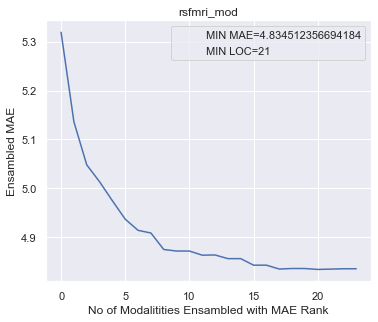

-------
['tfmri_1', 'tfmri_c_1', 'tfmri_c_2', 'tfmri_c_5', 'tfmri_2', 'tfmri_5']


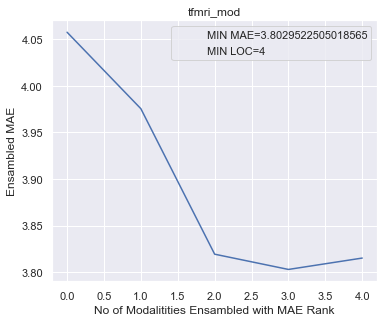

-------
['tbss_ICVF', 'tbss_FA', 'tbss_ISOVF', 'tbss_OD', 'tbss_L2', 'tbss_L1', 'tbss_MD', 'tbss_L3', 'tbss_ICVF_s', 'tbss_MO', 'tbss_FA_s', 'tbss_L1_s', 'tracts', 'tbss_L2_s', 'tbss_MD_s', 'tbss_L3_s', 'tbss_OD_s', 'tbss_ISOVF_s', 'tbss_MO_s']


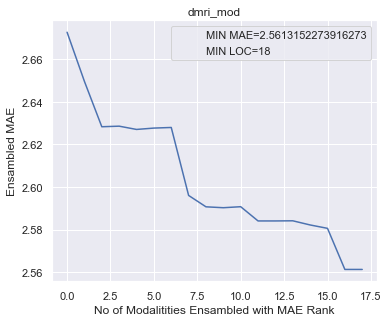

-------
['tbss_ICVF_s', 'tbss_FA_s', 'tbss_L1_s', 'tbss_L2_s', 'tbss_MD_s', 'tbss_L3_s', 'tbss_OD_s', 'tbss_ISOVF_s', 'tbss_MO_s']


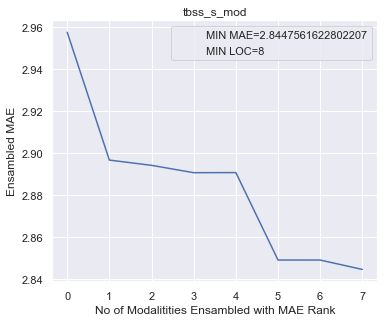

-------
['tbss_ICVF', 'tbss_FA', 'tbss_ISOVF', 'tbss_OD', 'tbss_L2', 'tbss_L1', 'tbss_MD', 'tbss_L3', 'tbss_MO']


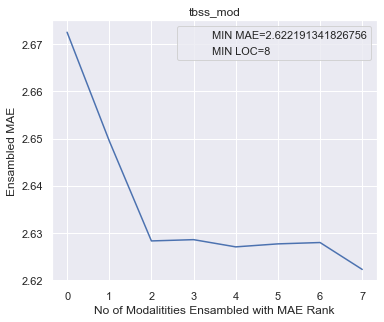

-------
['jacobian', 'rsfmri_0', 'rsfmri_22', 'rsfmri_11', 'rsfmri_17', 'rsfmri_18', 'rsfmri_21', 'rsfmri_7', 'rsfmri_1', 'rsfmri_9', 'rsfmri_3', 'rsfmri_13', 'rsfmri_12', 'rsfmri_15', 'rsfmri_2', 'rsfmri_16', 'rsfmri_5', 'rsfmri_23', 'rsfmri_4', 'rsfmri_24', 'rsfmri_10', 'rsfmri_20', 'rsfmri_14', 'rsfmri_8', 'rsfmri_6', 'rsfmri_19']


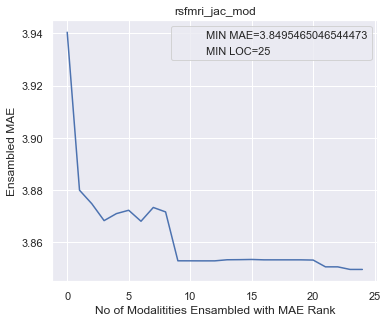

-------
['jacobian', 'tfmri_1', 'tfmri_c_1', 'tfmri_c_2', 'tfmri_c_5', 'tfmri_2', 'tfmri_5']


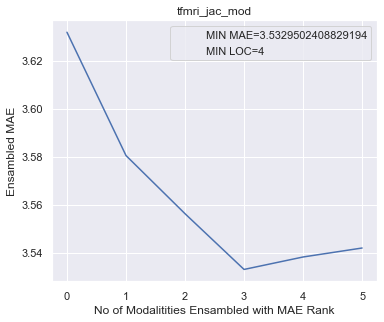

-------
['tfmri_1', 'tfmri_c_1', 'tfmri_c_2', 'tfmri_c_5', 'tfmri_2', 'tfmri_5', 'rsfmri_0', 'rsfmri_22', 'rsfmri_11', 'rsfmri_17', 'rsfmri_18', 'rsfmri_21', 'rsfmri_7', 'rsfmri_1', 'rsfmri_9', 'rsfmri_3', 'rsfmri_13', 'rsfmri_12', 'rsfmri_15', 'rsfmri_2', 'rsfmri_16', 'rsfmri_5', 'rsfmri_23', 'rsfmri_4', 'rsfmri_24', 'rsfmri_10', 'rsfmri_20', 'rsfmri_14', 'rsfmri_8', 'rsfmri_6', 'rsfmri_19']


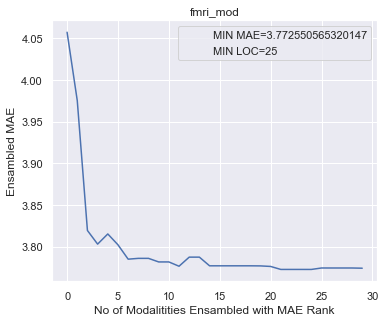

-------
['jacobian', 'tfmri_1', 'tfmri_c_1', 'tfmri_c_2', 'tfmri_c_5', 'tfmri_2', 'tfmri_5', 'rsfmri_0', 'rsfmri_22', 'rsfmri_11', 'rsfmri_17', 'rsfmri_18', 'rsfmri_21', 'rsfmri_7', 'rsfmri_1', 'rsfmri_9', 'rsfmri_3', 'rsfmri_13', 'rsfmri_12', 'rsfmri_15', 'rsfmri_2', 'rsfmri_16', 'rsfmri_5', 'rsfmri_23', 'rsfmri_4', 'rsfmri_24', 'rsfmri_10', 'rsfmri_20', 'rsfmri_14', 'rsfmri_8', 'rsfmri_6', 'rsfmri_19']


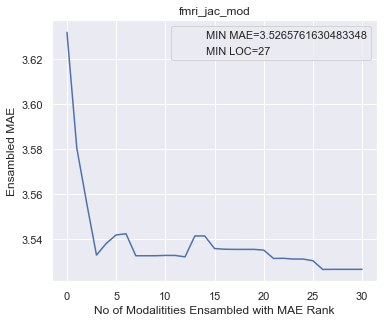

-------
['tbss_ICVF_s', 'tbss_FA_s', 'tbss_L1_s', 'tracts', 'tbss_L2_s', 'tbss_MD_s', 'tbss_L3_s', 'tbss_OD_s', 'tbss_ISOVF_s', 'tbss_MO_s']


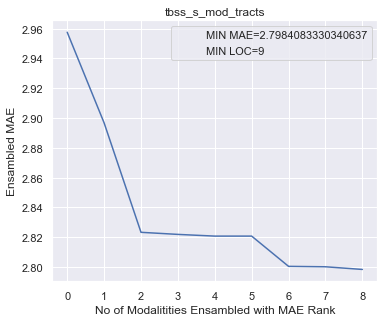

-------
['tbss_ICVF', 'tbss_FA', 'tbss_ISOVF', 'tbss_OD', 'tbss_L2', 'tbss_L1', 'tbss_MD', 'tbss_L3', 'tbss_MO', 'tracts']


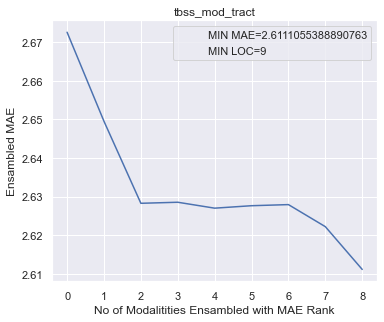

-------


In [106]:
for idx, sub_mod in enumerate(mod_list):
    ensamble_sub_modality_groups(sub_modality_group=sub_mod, mae_df=mae_df, 
                                 df=df, df_train=df_train, df_test=df_test,
                                 sub_modality_name=mod_names[idx])


In [107]:
x = tmp_dct = combination_ensambling(df, df_train, df_test, custom_modalities=smri_mod, 
                           min_objects=None, max_objects=None, verbose=False)
x.sort_values('mae_improvement', ascending=False).head()

,modality,min_single_mae,ensambled_mae,mae_improvement
48,jacobian T2_lesions swi,3.626171,3.218536,0.407636
11,jacobian T2_lesions,4.010293,3.672022,0.338270
12,jacobian swi,3.626171,3.294040,0.332131
94,T1_nonlinear T1_linear vbm T2_nonlinear T2_les...,2.372096,2.154831,0.217266
57,T1_nonlinear T1_linear vbm T2_nonlinear,2.372096,2.154943,0.217153


In [108]:
x = tmp_dct = combination_ensambling(df, df_train, df_test, custom_modalities=tfmri_mod, 
                           min_objects=None, max_objects=None, verbose=False)
x.sort_values('mae_improvement', ascending=False).head()

,modality,min_single_mae,ensambled_mae,mae_improvement
53,tfmri_1 tfmri_2 tfmri_c_1 tfmri_c_2 tfmri_c_5,4.249898,3.802983,0.446915
39,tfmri_1 tfmri_2 tfmri_c_1 tfmri_c_5,4.249898,3.810133,0.439764
56,tfmri_1 tfmri_2 tfmri_5 tfmri_c_1 tfmri_c_2 tf...,4.249898,3.815057,0.434841
44,tfmri_1 tfmri_c_1 tfmri_c_2 tfmri_c_5,4.249898,3.819312,0.430586
40,tfmri_1 tfmri_2 tfmri_c_2 tfmri_c_5,4.249898,3.821595,0.428302


MAE= 3.7790977605478644
PR= 0.7569740160909376
Time To Complete: 0:00:00.002143
MAE Decon= 5.0135907184306925
PR Decon= 0.7569740160909376


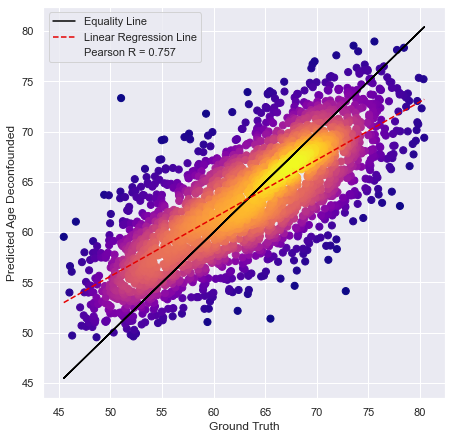

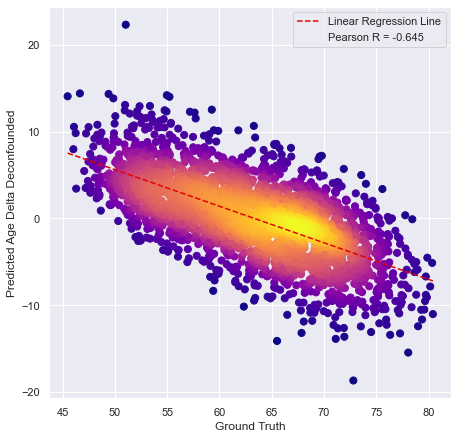

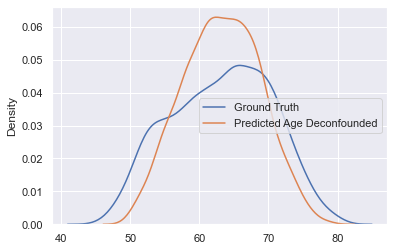

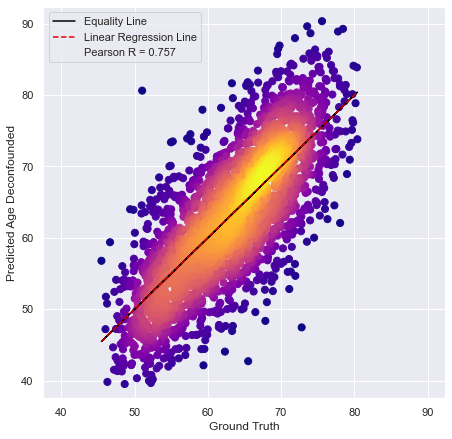

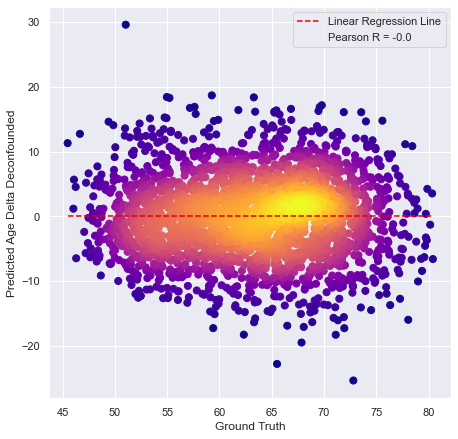

0------
1.1971028667515071
-12.588606394146332
[0.31360451 0.25751583 0.21628381 0.18217538 0.22752334]


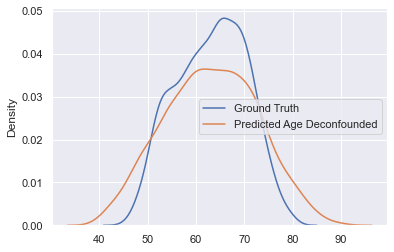

In [109]:
tmp_mod= ['rsfmri_0', 'rsfmri_22', 'rsfmri_11', 'rsfmri_17', 'rsfmri_18']
# tmp_mod = ['rsfmri_0', 'rsfmri_22', 'rsfmri_11']
x = ElasticNet_wrap(df_train, df_test, modalities = tmp_mod, 
                      number_of_modalities=None, show_plots=True, verbose=True,
                   cross_validation_flag = False, deconfound=True
                   )
print("0------")
print(x[1].sum())
print(x[2])
print(x[1])

# (reg, coefficients, intercept,

['rsfmri_0', 'rsfmri_22', 'rsfmri_11', 'rsfmri_17', 'rsfmri_18', 'rsfmri_21', 'rsfmri_7', 'rsfmri_1', 'rsfmri_9', 'rsfmri_3', 'rsfmri_13', 'rsfmri_12', 'rsfmri_15', 'rsfmri_2', 'rsfmri_16', 'rsfmri_5', 'rsfmri_23', 'rsfmri_4', 'rsfmri_24', 'rsfmri_10', 'rsfmri_20', 'rsfmri_14', 'rsfmri_8', 'rsfmri_6', 'rsfmri_19']


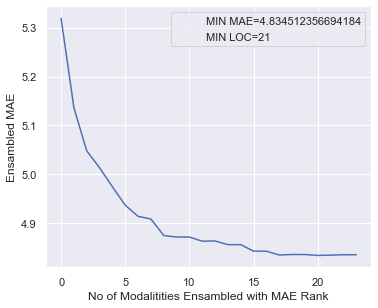

-------


In [110]:
ensamble_sub_modality_groups(sub_modality_group=rsfmri_mod, mae_df=mae_df, 
                                 df=df, df_train=df_train, df_test=df_test,
                                 sub_modality_name=None)

# 6. Fit ElasticNet to Highly Correlated Clusters

In [120]:
df.modality.to_list()

['T1_nonlinear',
 'T1_linear',
 'jacobian',
 'vbm',
 'T2_nonlinear',
 'T2_lesions',
 'swi',
 'rsfmri_0',
 'rsfmri_1',
 'rsfmri_2',
 'rsfmri_3',
 'rsfmri_4',
 'rsfmri_5',
 'rsfmri_6',
 'rsfmri_7',
 'rsfmri_8',
 'rsfmri_9',
 'rsfmri_10',
 'rsfmri_11',
 'rsfmri_12',
 'rsfmri_13',
 'rsfmri_14',
 'rsfmri_15',
 'rsfmri_16',
 'rsfmri_17',
 'rsfmri_18',
 'rsfmri_19',
 'rsfmri_20',
 'rsfmri_21',
 'rsfmri_22',
 'rsfmri_23',
 'rsfmri_24',
 'tfmri_1',
 'tfmri_2',
 'tfmri_5',
 'tfmri_c_1',
 'tfmri_c_2',
 'tfmri_c_5',
 'tracts',
 'tbss_FA_s',
 'tbss_ICVF_s',
 'tbss_ISOVF_s',
 'tbss_L1_s',
 'tbss_L2_s',
 'tbss_L3_s',
 'tbss_MD_s',
 'tbss_MO_s',
 'tbss_OD_s',
 'tbss_FA',
 'tbss_ICVF',
 'tbss_ISOVF',
 'tbss_L1',
 'tbss_L2',
 'tbss_L3',
 'tbss_MD',
 'tbss_MO',
 'tbss_OD']

In [11]:
# mods1 = ['tbss_L2', 'tbss_MD', 'tbss_L3', 'tbss_L1', 'tbss_ISOVF']
# mods2 = ['T1_nonlinear', 'T1_linear', 'vbm', 'T2_nonlinear']
# mods3 = mods1 + mods2
# mods4 = ['tbss_ICVF_s', 'tbss_ICVF']
# mods5 = ['tbss_ISOVF_s', 'tbss_L1_s', 'tbss_L2_s', 'tbss_L3_s', 'tbss_MD_s']
# mods6 = mods4 + mods5
# mods7 = mods6 + ['T2_lesions']
# mods8 = ['tracts', 'tbss_FA_s', 'tbss_FA', 'tbss_MO_s', 'tbss_MO', 'tbss_OD_s', 'tbss_OD']
# mods9 = mods3 + mods7 + mods8

# mods10 = ['jacobian', 'tfmri_5', 'tfmri_c_5', 'swi']
# mods11 = ['tfmri_1', 'tfmri_2', 'tfmri_c_1', 'tfmri_c_2']
# mods12 = mods10 + mods11
# mods13 = ['rsfmri_0', 'rsfmri_16', 'rsfmri_6']
# mods14 = ['rsfmri_2', 'rsfmri_17', 'rsfmri_21', 'rsfmri_5', 'rsfmri_9', 'rsfmri_13', 'rsfmri_20']
# mods15 = ['rsfmri_1', 'rsfmri_7']
# mods16 = mods13 + mods14 + mods15
# mods17 = ['rsfmri_3', 'rsfmri_22', 'rsfmri_15', 'rsfmri_14']
# mods18 = ['rsfmri_10', 'rsfmri_11', 'rsfmri_12', 'rsfmri_18']
# mods19 = ['rsfmri_4', 'rsfmri_8', 'rsfmri_19', 'rsfmri_23', 'rsfmri_24']
# mods20 = mods17 + mods18 + mods19
# mods21 = mods16 + mods20
# mods22 = mods12 + mods21

# cluster1 = mods1 + mods2
# cluster2 = mods7
# cluster3 = mods8
# cluster4 = mods12
# cluster5 = mods21
# cluster6 = cluster2 + cluster3
# cluster7 = cluster1 + cluster6
# cluster8 = cluster7 + cluster4
# cluster9 = mods22

# # mods = [mods1, mods2, mods3, mods4, mods5, mods6, mods7, mods8, mods9, mods10, mods11, 
# #        mods12, mods13, mods14, mods15, mods16, mods17, mods18, mods19, mods20, mods21, mods22]

# mods = [cluster1, cluster2, cluster3, cluster4, cluster5, cluster6, cluster7, cluster8, cluster9]

# output_name = 'male_ensembles_testset.pkl'

# idx = 1
# for mod in mods:
#     x = ElasticNet_wrap(df_train, df_test, modalities=mod, 
#                    number_of_modalities=None, show_plots=False, verbose=False,
#                    cross_validation_flag = False, deconfound=True)
#     print('mods:', idx, '|', x[3])
     
    
#     cluster_name = 'Cluster' + str(idx)
    
#     df_output = pd.DataFrame.from_dict({
#         'modality': cluster_name,
#         'dataframe': [pd.DataFrame.from_dict({
#                 'Unnamed: 0': subjects_testB,
#                 'age_delta_decon': x[10]
#                 })]
#         })

#     idx +=1

#     if os.path.exists(output_name):
#         df_ensambles = pd.read_pickle(output_name)
#         if df_output.iloc[0].modality in df_ensambles.modality.to_list():
#             pass
#         else:
#             df_ensambles = pd.concat([df_ensambles, df_output])
#             df_ensambles.to_pickle(output_name, protocol = 4)
#     else:
#         df_output.to_pickle(output_name, protocol = 4)

mods: 1 | 2.161982639812389
mods: 2 | 2.7444933280651864
mods: 3 | 2.7661689050032487
mods: 4 | 3.1908489174894425
mods: 5 | 4.836124100517708
mods: 6 | 2.5777429850308082
mods: 7 | 2.119164724928277
mods: 8 | 2.1188850999779265
mods: 9 | 3.1732953881957497


In [29]:
# os.remove(output_name)

In [12]:
# df_ensambles = pd.read_pickle(output_name)
# df_ensambles

,modality,dataframe
0,NaiveFull,Unnamed: 0 age_delta_decon 0 2573...
0,LinearRegressionFull,Unnamed: 0 age_delta_decon 0 2573...
0,ElasticNetFull,Unnamed: 0 age_delta_decon 0 2573...
0,Cluster1,Unnamed: 0 age_delta_decon 0 2573...
0,Cluster2,Unnamed: 0 age_delta_decon 0 2573...
0,Cluster3,Unnamed: 0 age_delta_decon 0 2573...
0,Cluster4,Unnamed: 0 age_delta_decon 0 2573...
0,Cluster5,Unnamed: 0 age_delta_decon 0 2573...
0,Cluster6,Unnamed: 0 age_delta_decon 0 2573...
0,Cluster7,Unnamed: 0 age_delta_decon 0 2573...


In [14]:
# for i in range(3,len(df_ensambles)):
#     print(abs(df_ensambles.iloc[i].dataframe.age_delta_decon).mean())

2.1619826398123903
2.744493328065182
2.766168905003253
3.1908489174894363
4.836124100517693
2.577742985030808
2.119164724928268
2.1188850999779234
3.1732953881957475
2.1205565616197104


# 6.1. Fit EN to highly correlated clusters USING C1

In [13]:
mods13 = ['rsfmri_0', 'rsfmri_16', 'rsfmri_6']
mods14 = ['rsfmri_2', 'rsfmri_17', 'rsfmri_21', 'rsfmri_5', 'rsfmri_9', 'rsfmri_13', 'rsfmri_20']
mods15 = ['rsfmri_1', 'rsfmri_7']
mods16 = mods13 + mods14 + mods15
mods17 = ['rsfmri_3', 'rsfmri_22', 'rsfmri_15', 'rsfmri_14']
mods18 = ['rsfmri_10', 'rsfmri_11', 'rsfmri_12', 'rsfmri_18']
mods19 = ['rsfmri_4', 'rsfmri_8', 'rsfmri_19', 'rsfmri_23', 'rsfmri_24']
mods20 = mods17 + mods18 + mods19
mods21 = mods16 + mods20

cluster1 = ['tbss_L2', 'tbss_MD', 'tbss_L3', 'tbss_L1', 'tbss_ISOVF']
cluster2 = ['tbss_ISOVF_s', 'tbss_L1_s', 'tbss_L2_s', 'tbss_L3_s', 'tbss_MD_s']
cluster3 = ['tracts', 'tbss_FA_s', 'tbss_FA', 'tbss_MO_s', 'tbss_MO', 'tbss_OD_s', 'tbss_OD']
cluster4 = ['T1_nonlinear', 'T1_linear', 'vbm', 'T2_nonlinear']
cluster5 = cluster4 + ['T2_lesions', 'swi', 'tbss_ICVF_s', 'tbss_ICVF']
cluster6 = ['jacobian', 'tfmri_5', 'tfmri_c_5', 'tfmri_1', 'tfmri_2', 'tfmri_c_1', 'tfmri_c_2']
cluster7 = mods21
cluster8 = cluster1 + cluster2
cluster9 = cluster8 + cluster3
cluster10 = cluster9 + cluster5
cluster11 = cluster10 + cluster6

mods = [cluster1, cluster2, cluster3, cluster4, cluster5, cluster6, cluster7, cluster8, cluster9, cluster10,
       cluster11]

idx = 1
for mod in mods:
    x = ElasticNet_wrap(df_train, df_test, modalities=mod, 
                   number_of_modalities=None, show_plots=False, verbose=False,
                   cross_validation_flag = False, deconfound=False)
#     print('mods:', idx, '|', x[3])
    print('{:.3f}'.format(x[3]))
     
    
    cluster_name = 'Cluster' + str(idx)
    
    df_output = pd.DataFrame.from_dict({
        'modality': cluster_name,
        'dataframe': [pd.DataFrame.from_dict({
                'Unnamed: 0': subjects_testB,
                'age_delta_decon': x[10]
                })]
        })

    idx +=1

#     if os.path.exists(output_name):
#         df_ensambles = pd.read_pickle(output_name)
#         if df_output.iloc[0].modality in df_ensambles.modality.to_list():
# #             iloc_idx = np.where(df_ensambles.modality.to_numpy() == df_output.iloc[0].modality)[0][0]
# #             df_ensambles.iloc[iloc_idx].dataframe = pd.DataFrame.copy(df_output.iloc[0].dataframe)
# #             df_output.to_pickle(output_name, protocol = 4)
#             pass
#         else:
#             df_ensambles = pd.concat([df_ensambles, df_output])
#             df_ensambles.to_pickle(output_name, protocol = 4)
#     else:
#         df_output.to_pickle(output_name, protocol = 4)

2.713
2.926
2.504
2.009
1.996
3.023
3.701
2.636
2.451
1.987
1.987


In [14]:
df_ensambles = pd.read_pickle(output_name)
df_ensambles

,modality,dataframe
0,NaiveFull,Unnamed: 0 age_delta_decon mean_age_de...
0,LinearRegressionFull,Unnamed: 0 age_delta_decon mean_age_de...
0,ElasticNetFull,Unnamed: 0 age_delta_decon mean_age_de...


mods: 1 | 3.0582203285870184
mods: 2 | 3.389054336184745
mods: 3 | 2.766168905003247
mods: 4 | 2.1550322887924453
mods: 5 | 2.136209314556861
mods: 6 | 3.541797886978938
mods: 7 | 4.836124100517707
mods: 8 | 2.960523371032205
mods: 9 | 2.690601008964565
mods: 10 | 2.1191445302988132
mods: 11 | 2.118870399241628


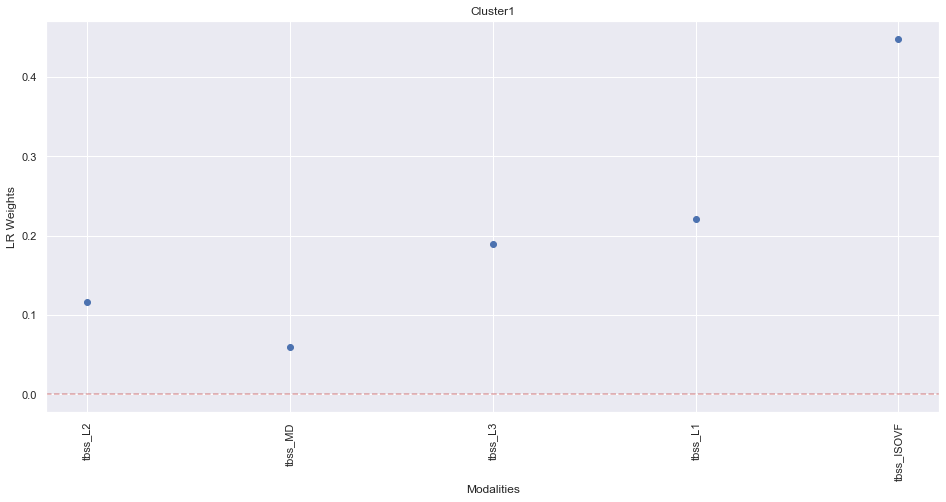

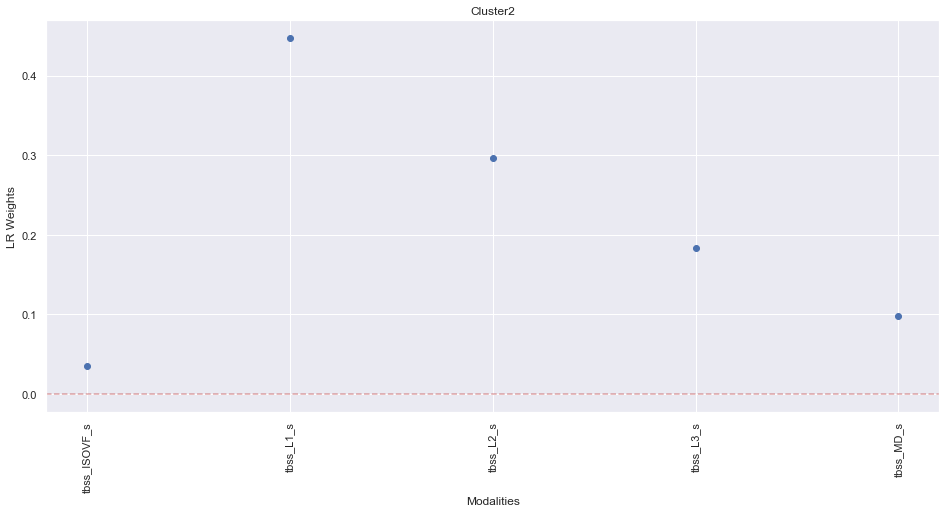

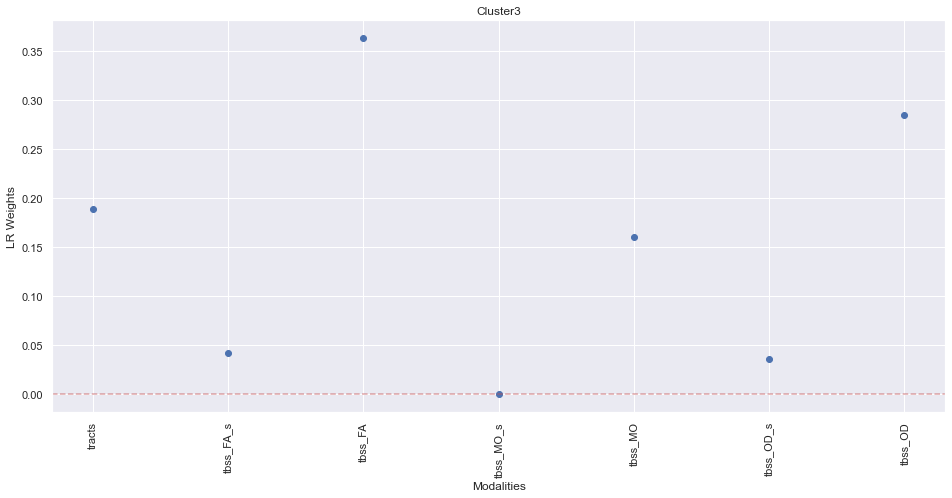

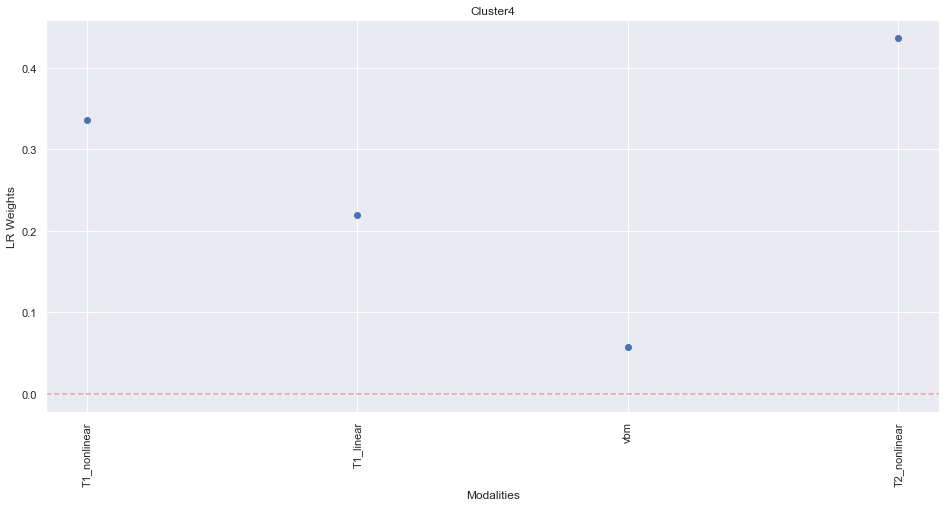

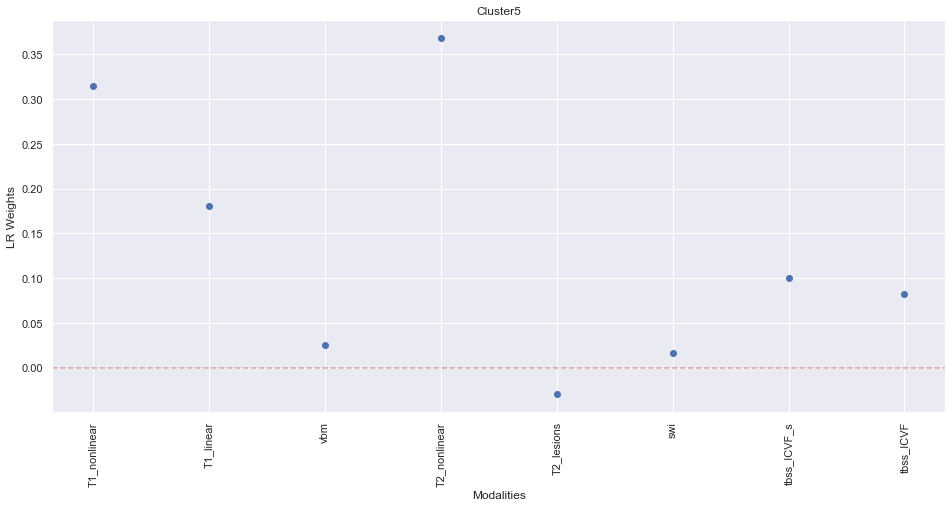

...

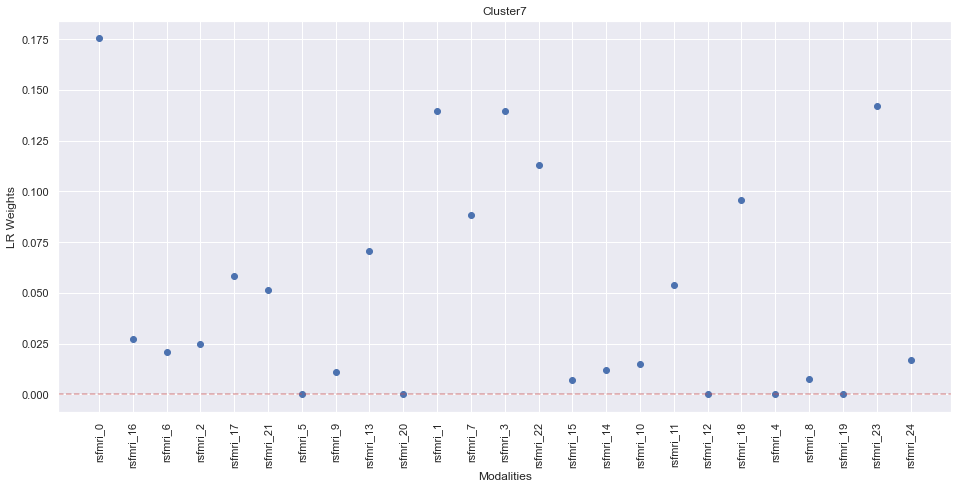

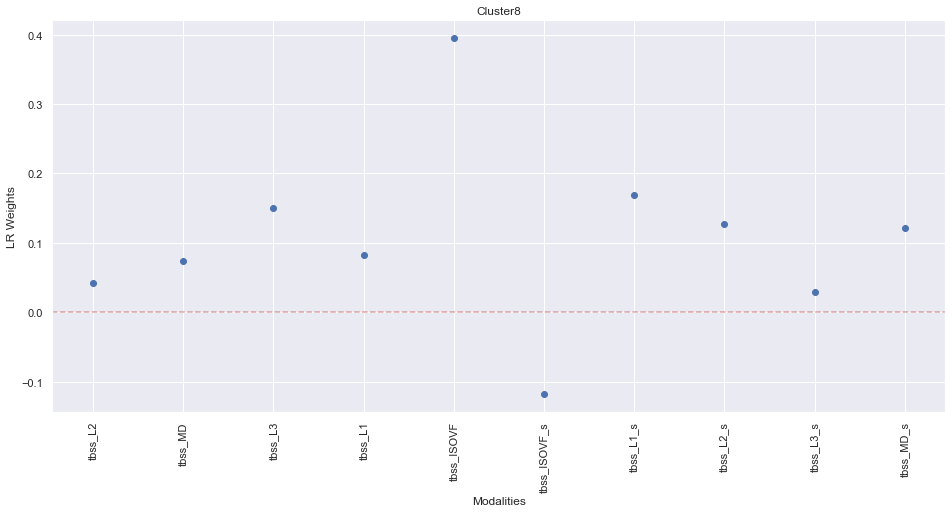

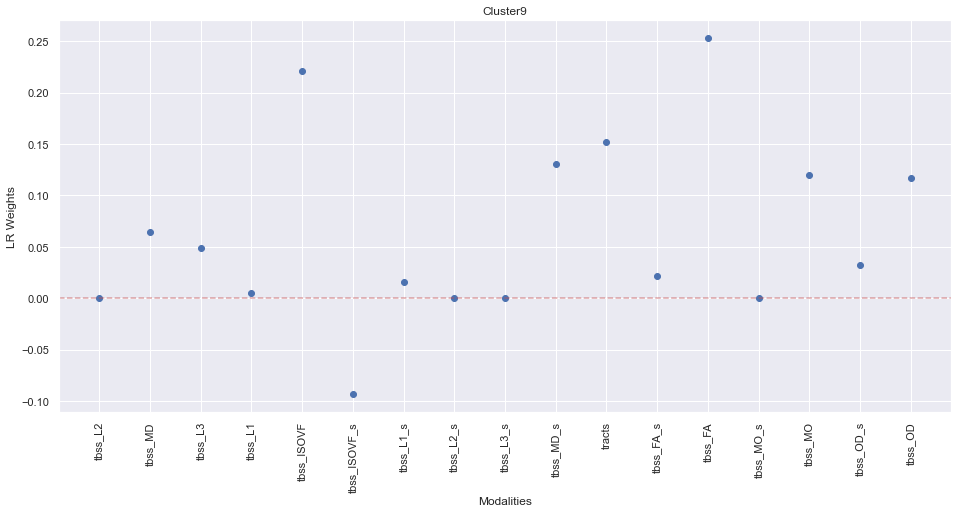

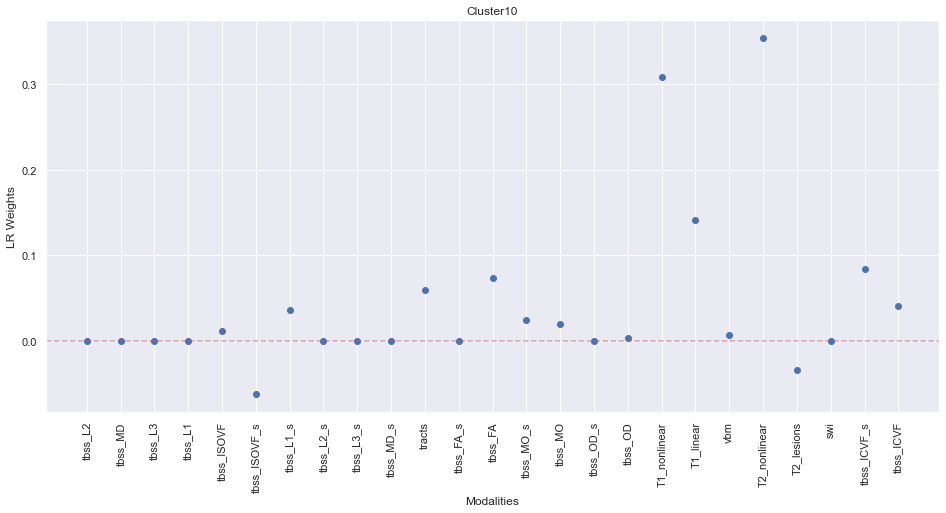

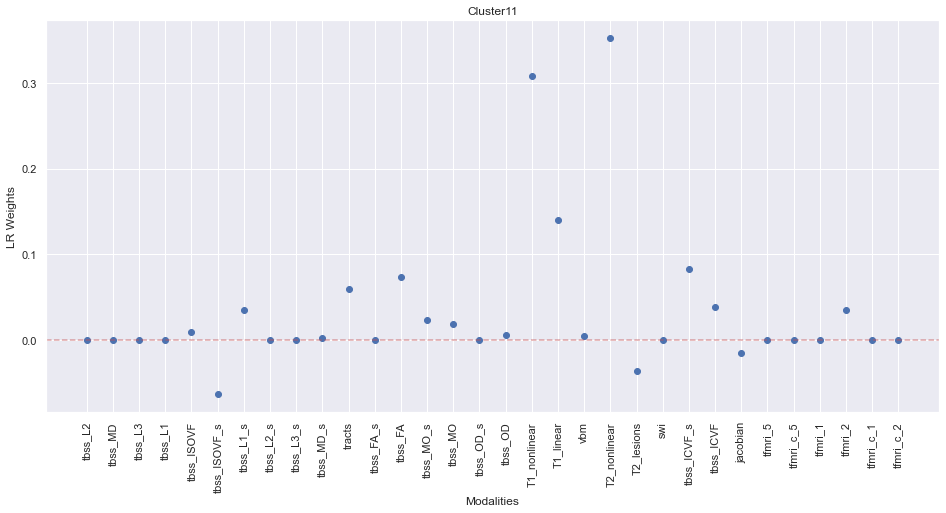

In [25]:
idx = 1
for mod in mods:
    x = ElasticNet_wrap(df_train, df_test, modalities=mod, 
                   number_of_modalities=None, show_plots=False, verbose=False,
                   cross_validation_flag = False, deconfound=True)
    print('mods:', idx, '|', x[3])
     
    cluster_name = 'Cluster' + str(idx)
    
    plt.figure(figsize=(16, 7.2))
    plt.scatter(np.arange(0, x[5].shape[0]), x[1])
    plt.xticks(np.arange(0, x[5].shape[0]), mod, rotation=90);
    plt.xlabel("Modalities")
    plt.ylabel("LR Weights")
    plt.axhline(y=0, color='r', linestyle='--', alpha=0.5);
    plt.title(cluster_name)

    idx +=1

mods: 1 | 3.058186600924246
0.4285043767389473 0.1
mods: 2 | 3.388538553685179
0.16349739917826206 0.24
mods: 3 | 2.7660579642761003
0.2530009114488033 0.21
mods: 4 | 2.1561601478732473
0.28684613430241623 0.16
mods: 5 | 2.137852901824643
0.2681124984636706 0.17
mods: 6 | 3.5419593830307745
0.04461950572356738 0.98
mods: 7 | 4.825726189425388
2.083226542655358 0.1
mods: 8 | 2.956394838220755
0.20840745706970584 0.2
mods: 9 | 2.6846898194580904
0.042290447566813195 1.0
mods: 10 | 2.118595509154391
0.2848695296176502 0.16
mods: 11 | 2.1134401201443564
0.346469470595969 0.14


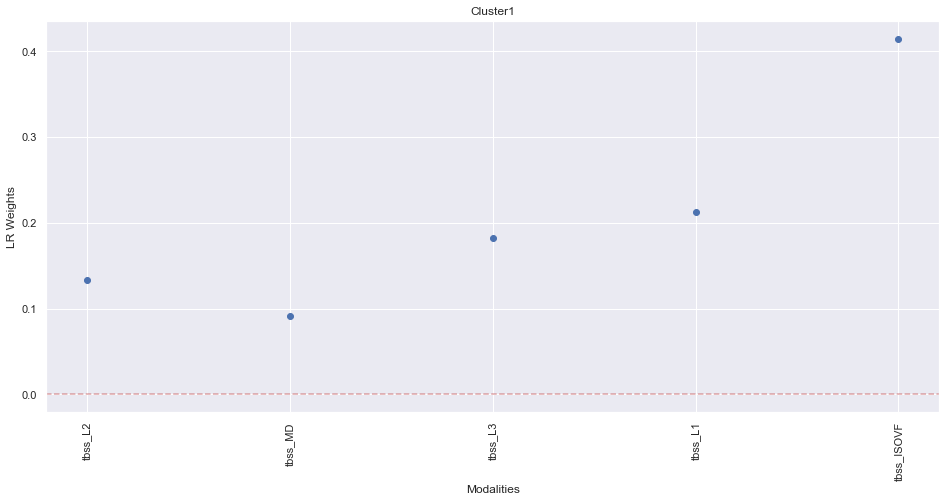

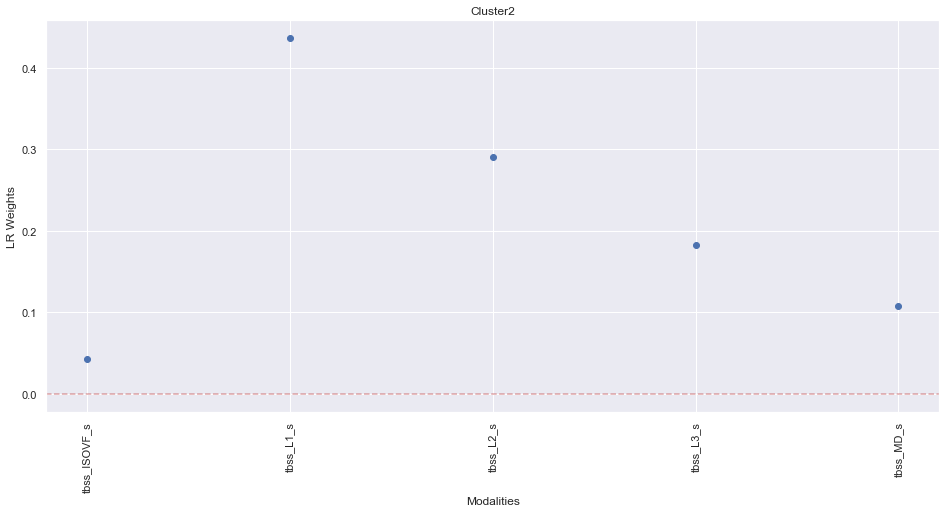

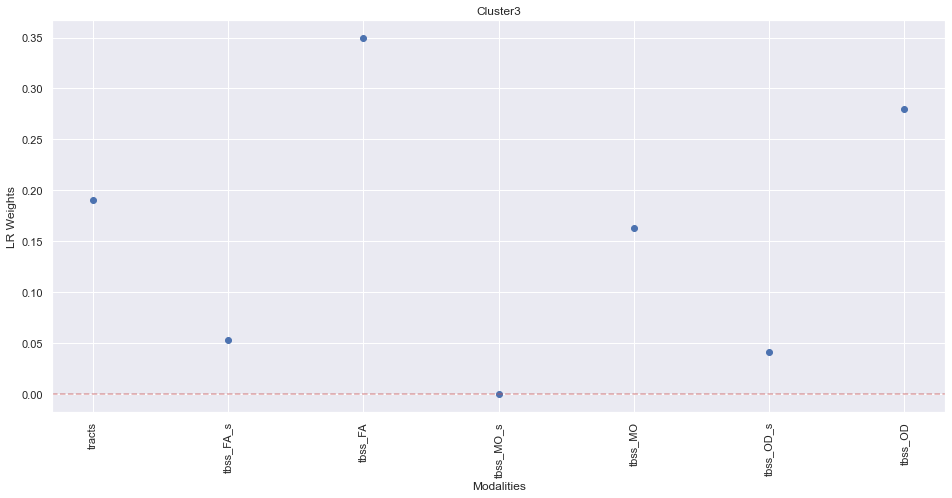

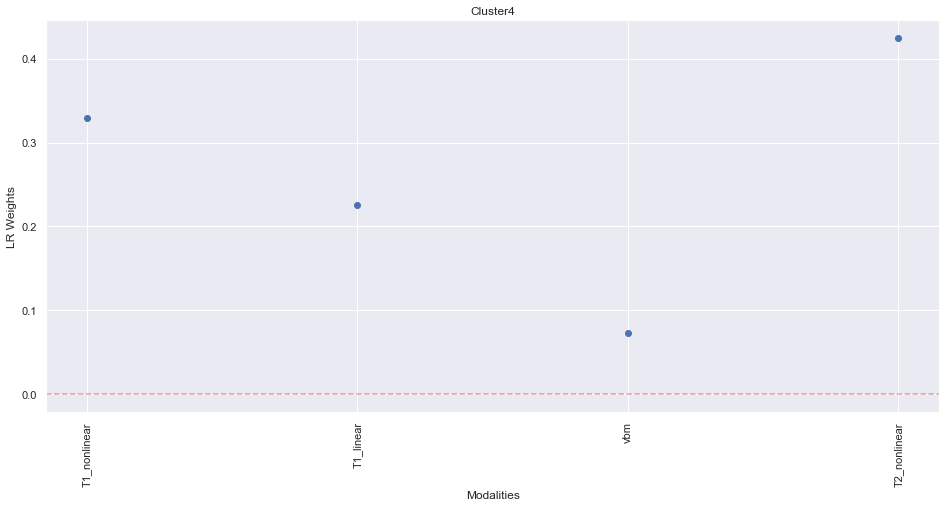

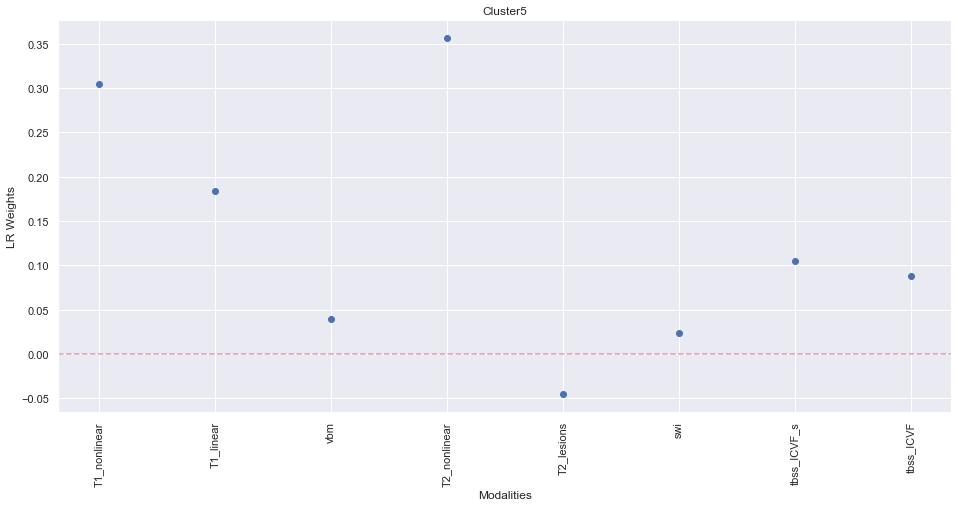

...

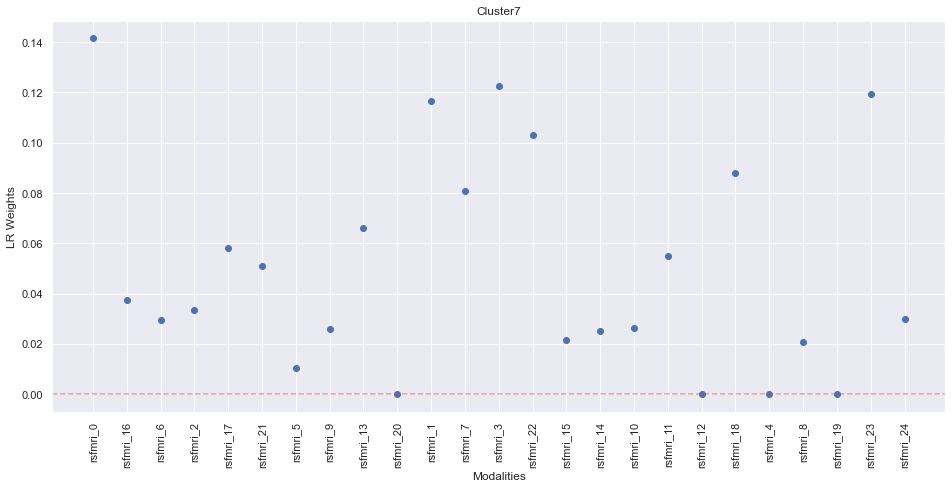

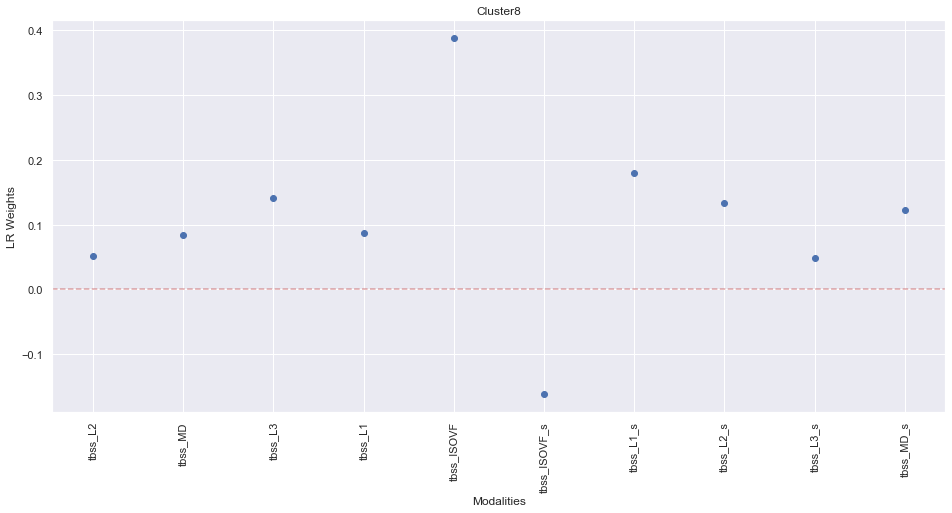

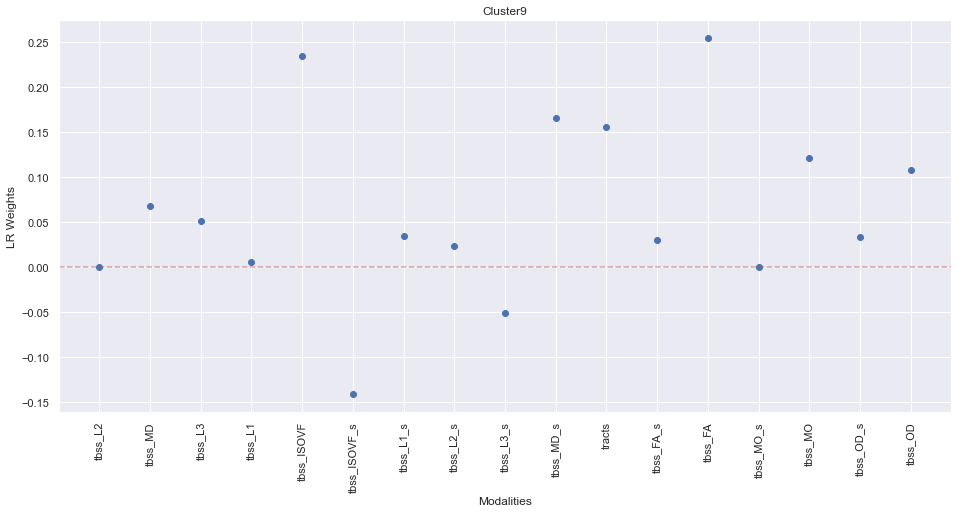

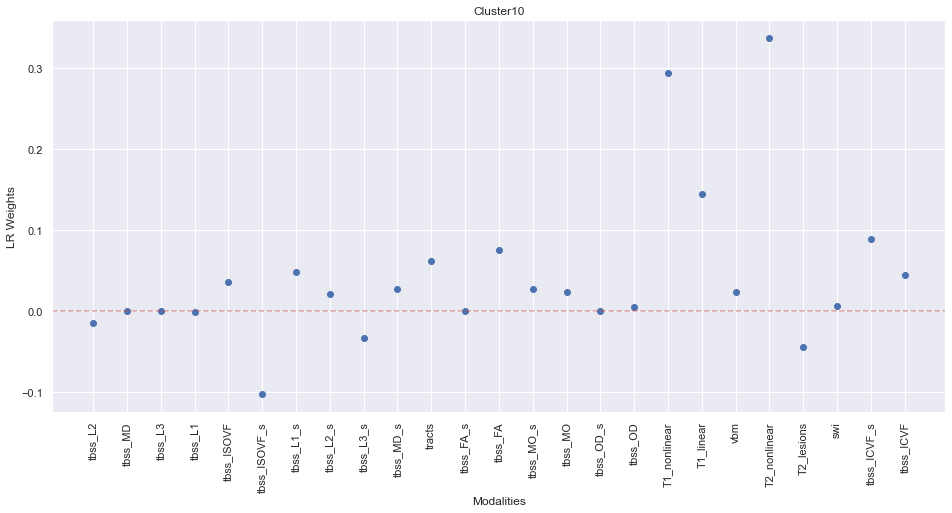

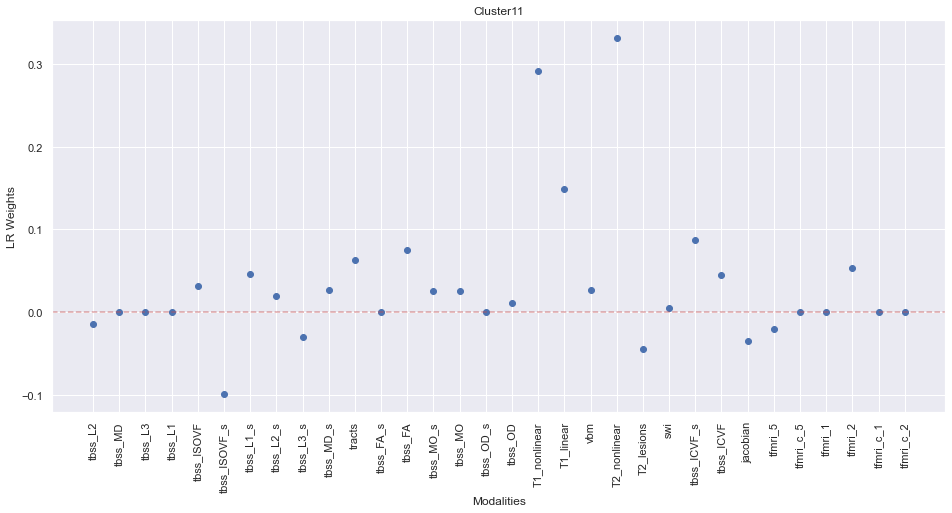

In [15]:
# (reg, coefficients, intercept, mae_decon, pr_decon, Xtrain, Ytrain, Xtest, Ytest, Yhat_decon,
#                 Age_Deltas_decon, Yhat, Age_Deltas)


idx = 1
for mod in mods:
    x = ElasticNet_wrap(df_train, df_test, modalities=mod, 
                   number_of_modalities=None, show_plots=False, verbose=False,
                   cross_validation_flag = True, deconfound=True)
    print('mods:', idx, '|', x[3])
    print(x[0].alpha_, x[0].l1_ratio_)
     
    cluster_name = 'Cluster' + str(idx)
    
    plt.figure(figsize=(16, 7.2))
    plt.scatter(np.arange(0, x[5].shape[0]), x[1])
    plt.xticks(np.arange(0, x[5].shape[0]), mod, rotation=90);
    plt.xlabel("Modalities")
    plt.ylabel("LR Weights")
    plt.axhline(y=0, color='r', linestyle='--', alpha=0.5);
    plt.title(cluster_name)

    idx +=1
    
    df_output = pd.DataFrame.from_dict({
    'modality': cluster_name,
#     'dataframe': [pd.DataFrame.from_dict({
#             'Unnamed: 0': subjects_testB,
#             'age_delta_decon': x[10]
#             })]
#     })
    'dataframe': [pd.DataFrame.from_dict({
                    'Unnamed: 0': subjects_testB,
                    'age_delta_decon': x[10],
                    'mean_age_delta': x[12],
                    'target_age': df_testB.target_age.values,
                    'mean_output_age': x[11]
                    })]
    })

    if os.path.exists(output_name):
        df_ensambles = pd.read_pickle(output_name)
        if df_output.iloc[0].modality in df_ensambles.modality.to_list():
#             iloc_idx = np.where(df_ensambles.modality.to_numpy() == df_output.iloc[0].modality)[0][0]
#             df_ensambles.iloc[iloc_idx].dataframe = pd.DataFrame.copy(df_output.iloc[0].dataframe)
#             df_output.to_pickle(output_name, protocol = 4)
            pass
        else:
            df_ensambles = pd.concat([df_ensambles, df_output])
            df_ensambles.to_pickle(output_name, protocol = 4)
    else:
        df_output.to_pickle(output_name, protocol = 4)

In [27]:
df_ensambles = pd.read_pickle(output_name)
df_ensambles

,modality,dataframe
0,NaiveFull,Unnamed: 0 age_delta_decon 0 2573...
0,LinearRegressionFull,Unnamed: 0 age_delta_decon 0 2573...
0,ElasticNetFull,Unnamed: 0 age_delta_decon 0 2573...
0,Cluster1,Unnamed: 0 age_delta_decon 0 2573...
0,Cluster2,Unnamed: 0 age_delta_decon 0 2573...
0,Cluster3,Unnamed: 0 age_delta_decon 0 2573...
0,Cluster4,Unnamed: 0 age_delta_decon 0 2573...
0,Cluster5,Unnamed: 0 age_delta_decon 0 2573...
0,Cluster6,Unnamed: 0 age_delta_decon 0 2573...
0,Cluster7,Unnamed: 0 age_delta_decon 0 2573...


MAE= 1.9859554340605872
PR= 0.9394865744142373
Time To Complete: 0:00:47.406726
MAE Decon= 2.116722692598795
PR Decon= 0.9394865744142372


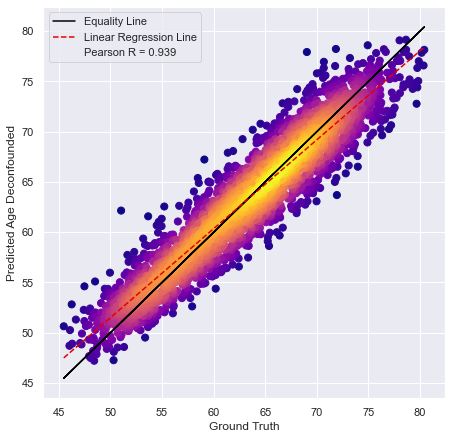

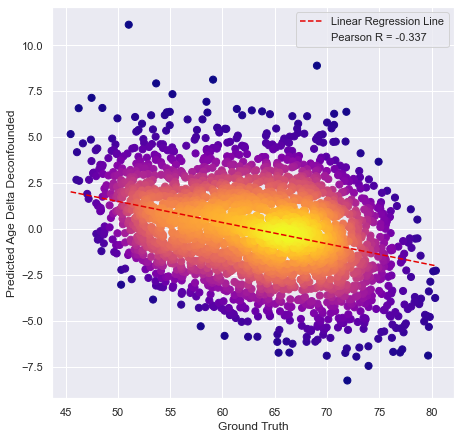

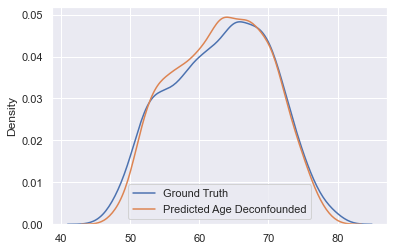

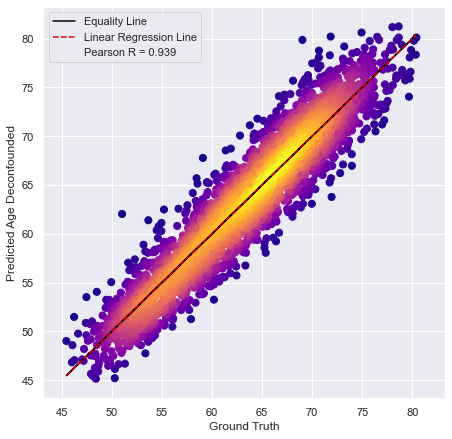

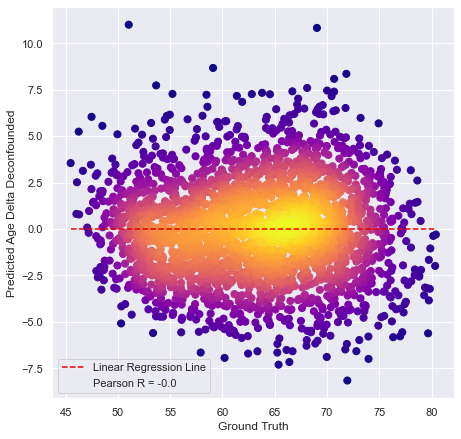

1.0595038574051736
-3.8171360784740003
0.14766463343295133 1.0


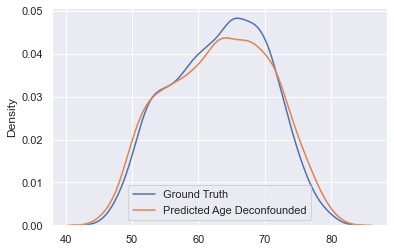

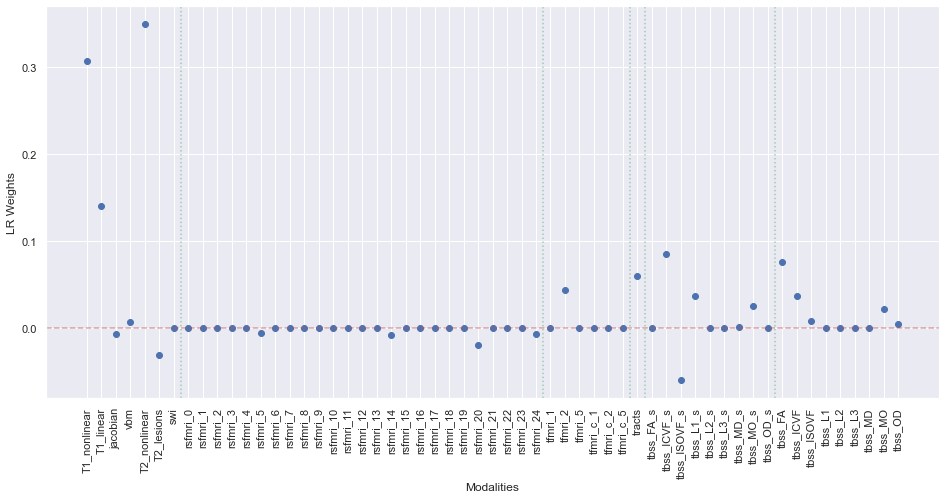

In [28]:
reg, coefficients, intercept, mae_decon, pr_decon, Xtrain, Ytrain, Xtest, Ytest, Yhat_decon, Age_Deltas_decon = ElasticNet_wrap(
                    df_train, df_test, number_of_modalities=None, show_plots=True, verbose=True, 
                    cross_validation_flag = True, fix_alpha_one=False, deconfound=True)

plt.figure(figsize=(16, 7.2))
# plt.plot(coefficients)
plt.scatter(np.arange(0, Xtrain.shape[0]), coefficients)
plt.xticks(np.arange(0, Xtrain.shape[0]), dft.modality.to_list(), rotation=90);
plt.xlabel("Modalities")
plt.ylabel("LR Weights")
plt.axhline(y=0, color='r', linestyle='--', alpha=0.5);
plt.axvline(x=6.5, color='g', linestyle='dotted', alpha=0.5);
plt.axvline(x=31.5, color='g', linestyle='dotted', alpha=0.5);
plt.axvline(x=37.5, color='g', linestyle='dotted', alpha=0.5);
plt.axvline(x=38.5, color='g', linestyle='dotted', alpha=0.5);
plt.axvline(x=47.5, color='g', linestyle='dotted', alpha=0.5);
print(coefficients.sum())
print(reg.intercept_)
print(reg.alpha_, reg.l1_ratio_)

MAE= 1.9819557399728747
PR= 0.9397495535595092
Time To Complete: 0:00:44.864232
MAE Decon= 2.1133597533869577
PR Decon= 0.9397495535595092


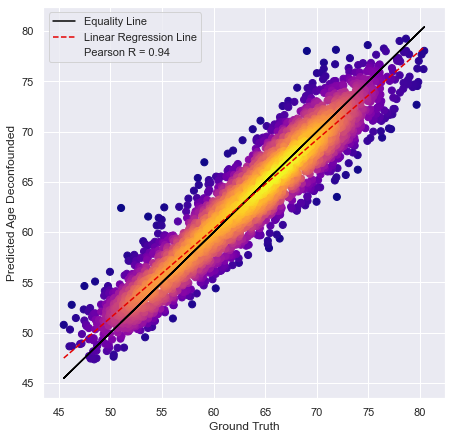

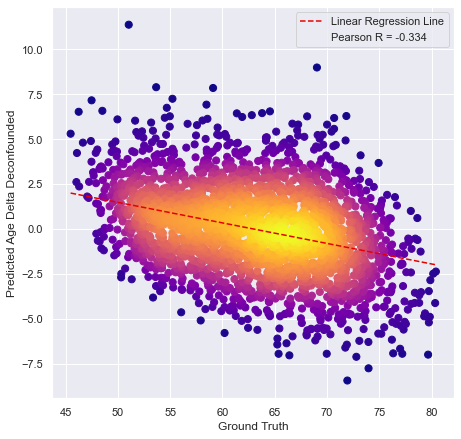

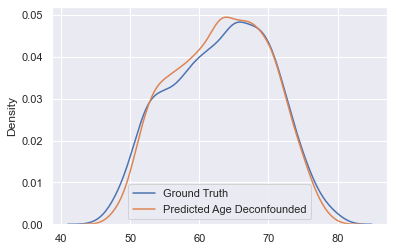

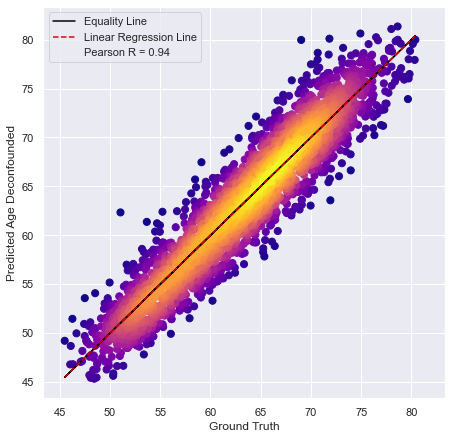

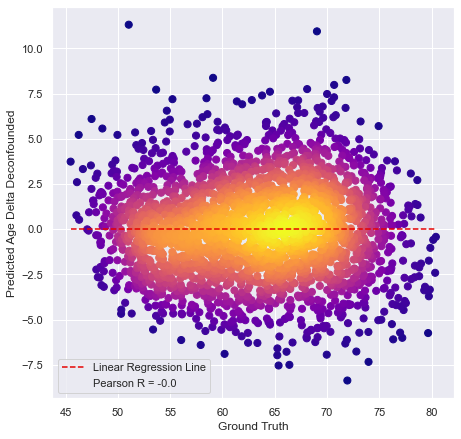

1.0679471145346215
-4.352931025574627
0.3324403731388541 0.15


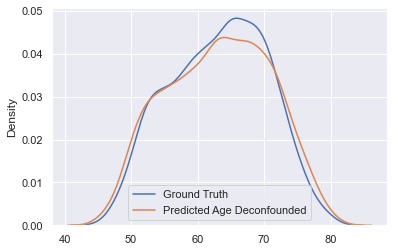

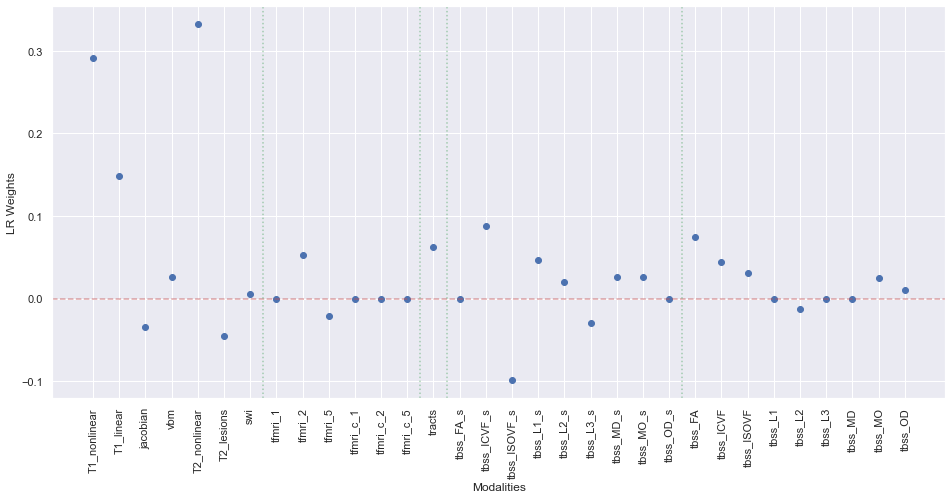

In [29]:
cluster11b=['T1_nonlinear','T1_linear','jacobian','vbm','T2_nonlinear','T2_lesions','swi','tfmri_1','tfmri_2',
'tfmri_5','tfmri_c_1','tfmri_c_2','tfmri_c_5','tracts','tbss_FA_s','tbss_ICVF_s','tbss_ISOVF_s','tbss_L1_s',
'tbss_L2_s','tbss_L3_s','tbss_MD_s','tbss_MO_s','tbss_OD_s','tbss_FA','tbss_ICVF','tbss_ISOVF','tbss_L1',
'tbss_L2','tbss_L3','tbss_MD','tbss_MO','tbss_OD']

reg, coefficients, intercept, mae_decon, pr_decon, Xtrain, Ytrain, Xtest, Ytest, Yhat_decon, Age_Deltas_decon = ElasticNet_wrap(
                    df_train, df_test, modalities = cluster11b, number_of_modalities=None, show_plots=True, verbose=True, 
                    cross_validation_flag = True, fix_alpha_one=False, deconfound=True)

plt.figure(figsize=(16, 7.2))
# plt.plot(coefficients)
plt.scatter(np.arange(0, Xtrain.shape[0]), coefficients)
plt.xticks(np.arange(0, Xtrain.shape[0]), cluster11b, rotation=90);
plt.xlabel("Modalities")
plt.ylabel("LR Weights")
plt.axhline(y=0, color='r', linestyle='--', alpha=0.5);
plt.axvline(x=6.5, color='g', linestyle='dotted', alpha=0.5);
plt.axvline(x=12.5, color='g', linestyle='dotted', alpha=0.5);
plt.axvline(x=13.5, color='g', linestyle='dotted', alpha=0.5);
plt.axvline(x=22.5, color='g', linestyle='dotted', alpha=0.5);
print(coefficients.sum())
print(reg.intercept_)
print(reg.alpha_, reg.l1_ratio_)

MAE= 1.9820352991628647
PR= 0.9397454221850404
Time To Complete: 0:00:45.253876
MAE Decon= 2.1134401201443564
PR Decon= 0.9397454221850405


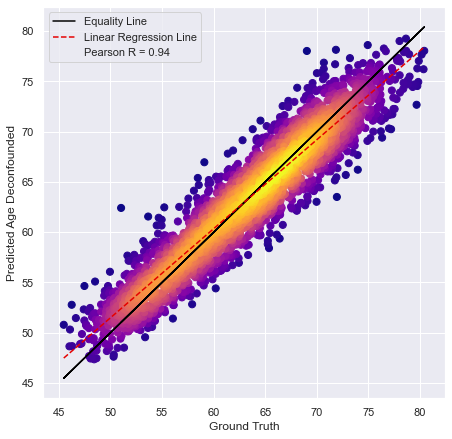

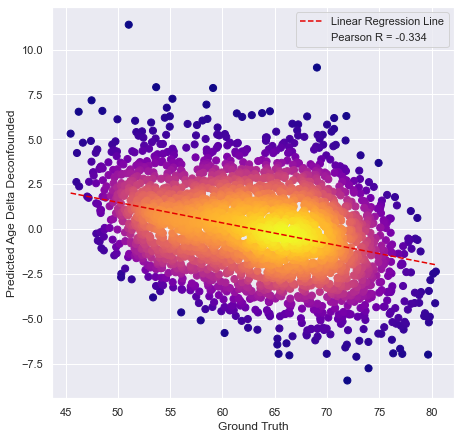

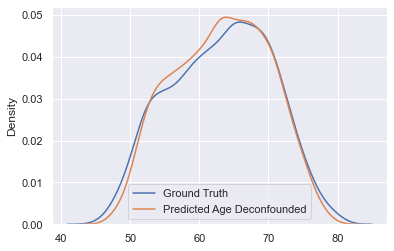

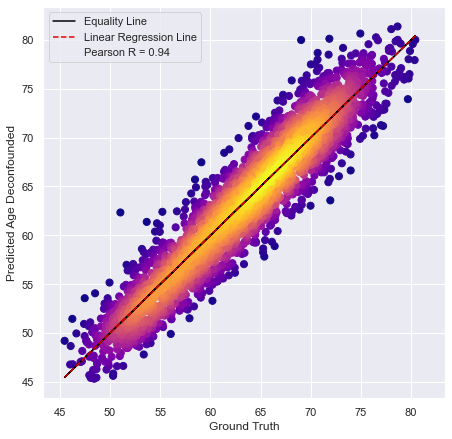

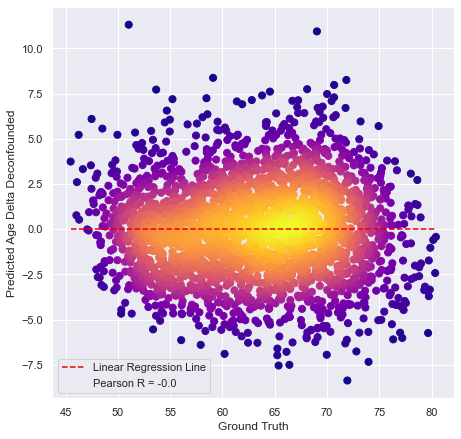

1.0679442378345947
-4.352984069583904
0.346469470595969 0.14


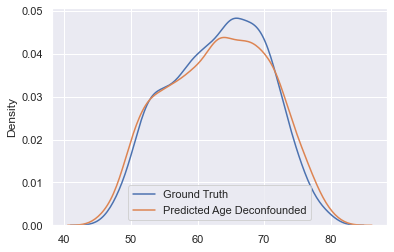

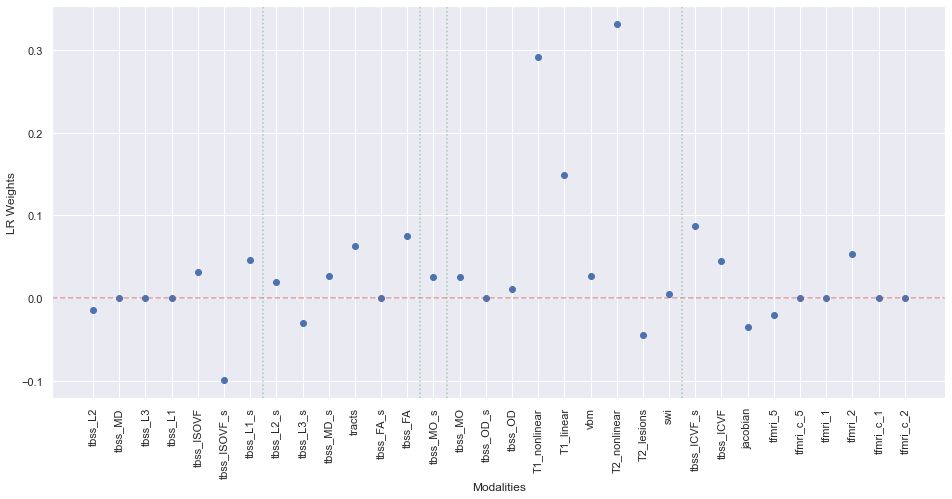

In [30]:
reg, coefficients, intercept, mae_decon, pr_decon, Xtrain, Ytrain, Xtest, Ytest, Yhat_decon, Age_Deltas_decon = ElasticNet_wrap(
                    df_train, df_test, modalities = cluster11, number_of_modalities=None, show_plots=True, verbose=True, 
                    cross_validation_flag = True, fix_alpha_one=False, deconfound=True)

plt.figure(figsize=(16, 7.2))
# plt.plot(coefficients)
plt.scatter(np.arange(0, Xtrain.shape[0]), coefficients)
plt.xticks(np.arange(0, Xtrain.shape[0]), cluster11, rotation=90);
plt.xlabel("Modalities")
plt.ylabel("LR Weights")
plt.axhline(y=0, color='r', linestyle='--', alpha=0.5);
plt.axvline(x=6.5, color='g', linestyle='dotted', alpha=0.5);
plt.axvline(x=12.5, color='g', linestyle='dotted', alpha=0.5);
plt.axvline(x=13.5, color='g', linestyle='dotted', alpha=0.5);
plt.axvline(x=22.5, color='g', linestyle='dotted', alpha=0.5);
print(coefficients.sum())
print(reg.intercept_)
print(reg.alpha_, reg.l1_ratio_)

In [31]:
np.sort(np.array(cluster11)) == np.sort(np.array(cluster11b))

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True])

In [32]:
np.array(cluster11b).sort()

In [33]:
df.modality.to_list()

['T1_nonlinear',
 'T1_linear',
 'jacobian',
 'vbm',
 'T2_nonlinear',
 'T2_lesions',
 'swi',
 'rsfmri_0',
 'rsfmri_1',
 'rsfmri_2',
 'rsfmri_3',
 'rsfmri_4',
 'rsfmri_5',
 'rsfmri_6',
 'rsfmri_7',
 'rsfmri_8',
 'rsfmri_9',
 'rsfmri_10',
 'rsfmri_11',
 'rsfmri_12',
 'rsfmri_13',
 'rsfmri_14',
 'rsfmri_15',
 'rsfmri_16',
 'rsfmri_17',
 'rsfmri_18',
 'rsfmri_19',
 'rsfmri_20',
 'rsfmri_21',
 'rsfmri_22',
 'rsfmri_23',
 'rsfmri_24',
 'tfmri_1',
 'tfmri_2',
 'tfmri_5',
 'tfmri_c_1',
 'tfmri_c_2',
 'tfmri_c_5',
 'tracts',
 'tbss_FA_s',
 'tbss_ICVF_s',
 'tbss_ISOVF_s',
 'tbss_L1_s',
 'tbss_L2_s',
 'tbss_L3_s',
 'tbss_MD_s',
 'tbss_MO_s',
 'tbss_OD_s',
 'tbss_FA',
 'tbss_ICVF',
 'tbss_ISOVF',
 'tbss_L1',
 'tbss_L2',
 'tbss_L3',
 'tbss_MD',
 'tbss_MO',
 'tbss_OD']

In [34]:
cluster1 = ['tbss_MD', 'rsfmri_0', 'tbss_MO', 'tbss_L2', 'tbss_ISOVF_s']
cluster2 = ['rsfmri_2', 'rsfmri_10', 'rsfmri_5', 'rsfmri_21', 'rsfmri_16']
cluster3 = ['tbss_FA_s', 'tbss_L3_s', 'T2_lesions']
cluster4 = ['tbss_ICVF', 'tbss_L2', 'tbss_ISOVF', 'tbss_ICVF_s', 'tbss_MD']
cluster5 = ['T2_lesions', 'tbss_FA_s', 'tbss_L3_s', 'tbss_ISOVF_s', 'tbss_L2_s']

mods: 1 | 2.9750266493077104
0.5889703069485019 0.1
mods: 2 | 5.215502627311005
0.556112845381995 0.1
mods: 3 | 3.2092152411939736
0.19795046208152842 0.2
mods: 4 | 2.711423396104367
0.4688072304295083 0.1
mods: 5 | 3.1794206331462145
0.2230077810471883 0.18


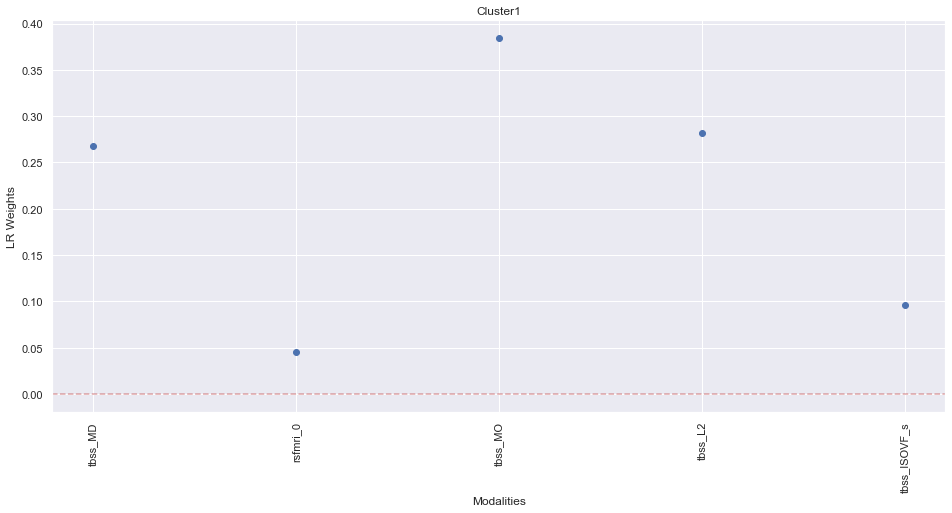

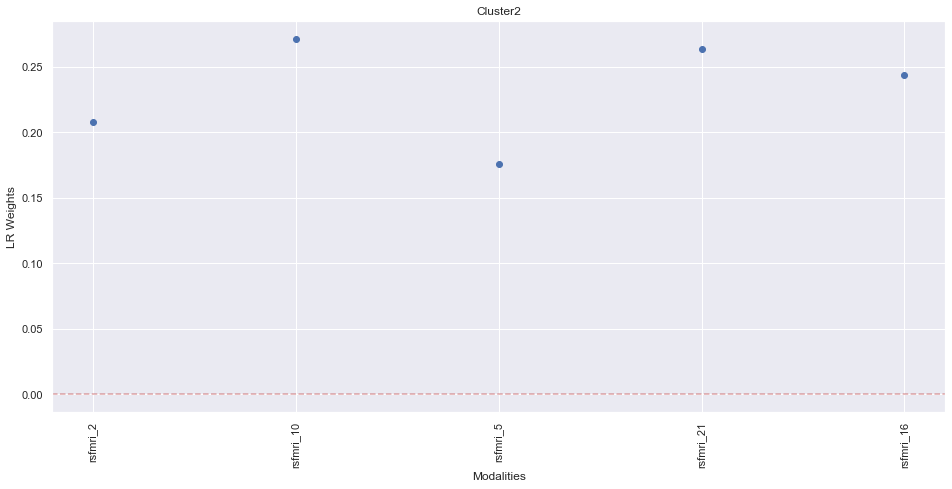

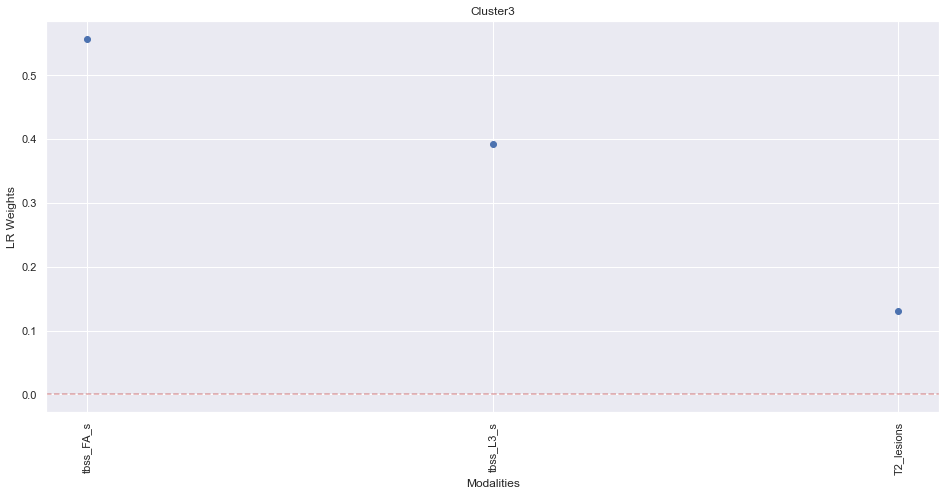

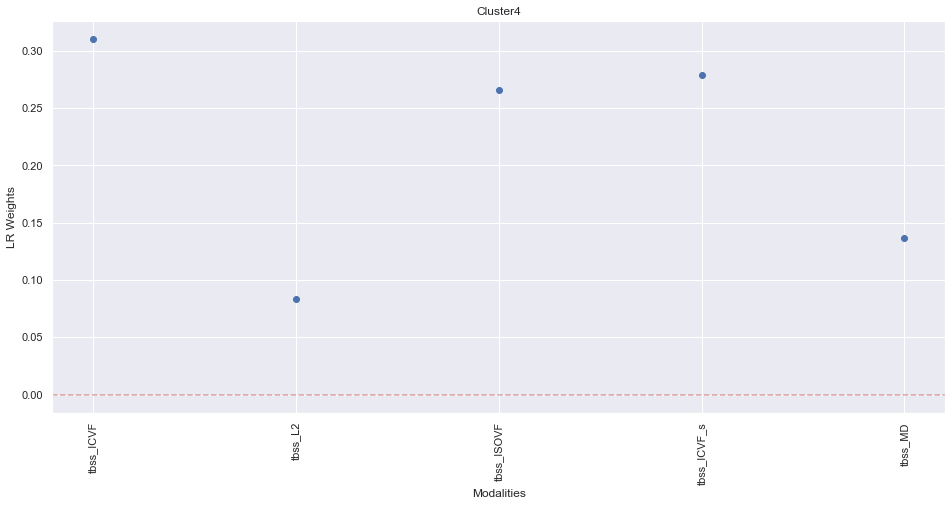

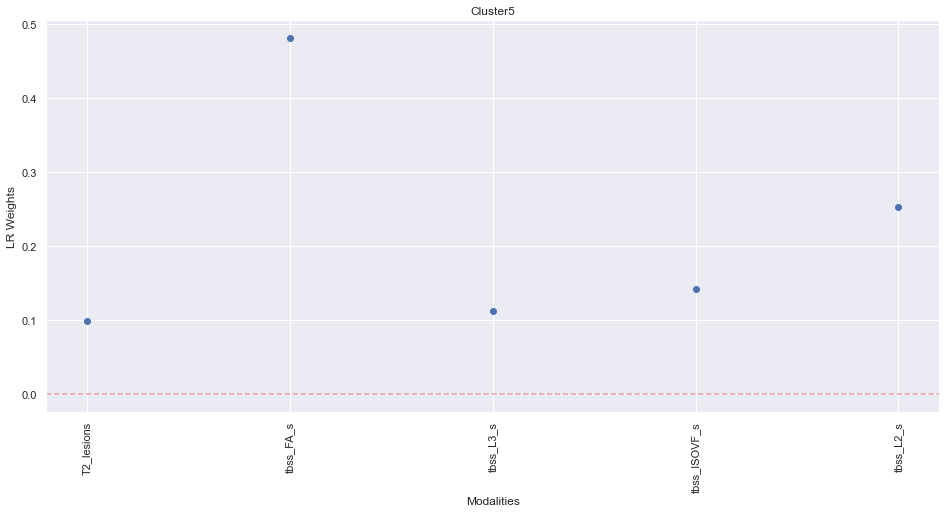

In [35]:
mods = [cluster1, cluster2, cluster3, cluster4, cluster5]

idx = 1
for mod in mods:
    x = ElasticNet_wrap(df_train, df_test, modalities=mod, 
                   number_of_modalities=None, show_plots=False, verbose=False,
                   cross_validation_flag = True, deconfound=True)
    print('mods:', idx, '|', x[3])
    print(x[0].alpha_, x[0].l1_ratio_)
     
    cluster_name = 'Cluster' + str(idx)
    
    plt.figure(figsize=(16, 7.2))
    plt.scatter(np.arange(0, x[5].shape[0]), x[1])
    plt.xticks(np.arange(0, x[5].shape[0]), mod, rotation=90);
    plt.xlabel("Modalities")
    plt.ylabel("LR Weights")
    plt.axhline(y=0, color='r', linestyle='--', alpha=0.5);
    plt.title(cluster_name)

    idx +=1
    
    df_output = pd.DataFrame.from_dict({
    'modality': cluster_name,
    'dataframe': [pd.DataFrame.from_dict({
            'Unnamed: 0': subjects_testB,
            'age_delta_decon': x[10]
            })]
    })

    output_name = 'female_ensembles_vars_select_testset.pkl'
    
    if os.path.exists(output_name):
        df_ensambles = pd.read_pickle(output_name)
        if df_output.iloc[0].modality in df_ensambles.modality.to_list():
#             iloc_idx = np.where(df_ensambles.modality.to_numpy() == df_output.iloc[0].modality)[0][0]
#             df_ensambles.iloc[iloc_idx].dataframe = pd.DataFrame.copy(df_output.iloc[0].dataframe)
#             df_output.to_pickle(output_name, protocol = 4)
            pass
        else:
            df_ensambles = pd.concat([df_ensambles, df_output])
            df_ensambles.to_pickle(output_name, protocol = 4)
    else:
        df_output.to_pickle(output_name, protocol = 4)

In [36]:
output_name = 'female_ensembles_vars_select_testset.pkl'
f_ensambles = pd.read_pickle(output_name)
df_ensambles

,modality,dataframe
0,Cluster1,Unnamed: 0 age_delta_decon 0 2573...
0,Cluster2,Unnamed: 0 age_delta_decon 0 2573...
0,Cluster3,Unnamed: 0 age_delta_decon 0 2573...
0,Cluster4,Unnamed: 0 age_delta_decon 0 2573...
0,Cluster5,Unnamed: 0 age_delta_decon 0 2573...


In [11]:
cluster1 = ['T1_nonlinear', 'T2_nonlinear']
cluster2 = ['T1_nonlinear', 'tbss_FA']
cluster0 = ['T1_nonlinear', 'T2_nonlinear', 'tbss_FA']

MAE= 2.011328006399313
PR= 0.9374836417022603
Time To Complete: 0:00:24.899723
MAE Decon= 2.156637265604285
PR Decon= 0.9374836417022601


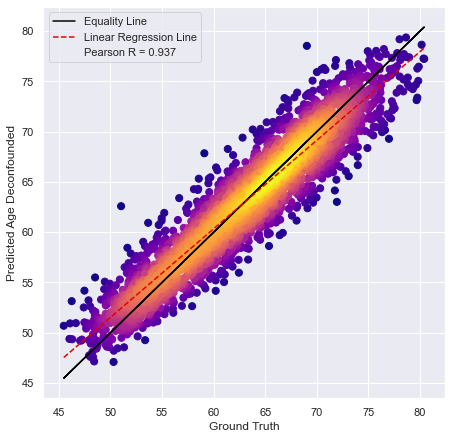

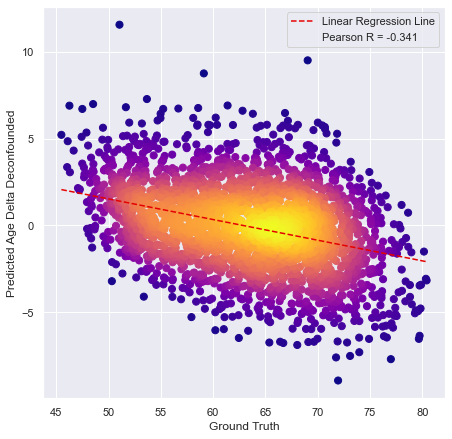

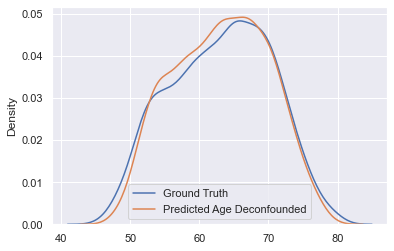

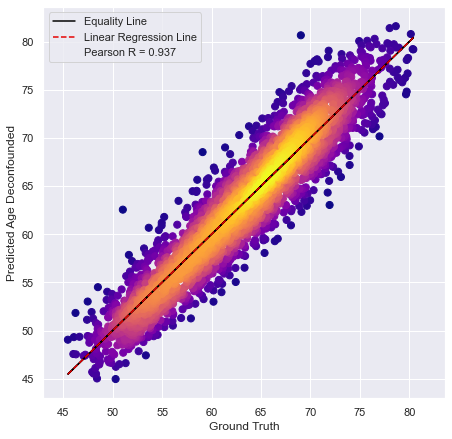

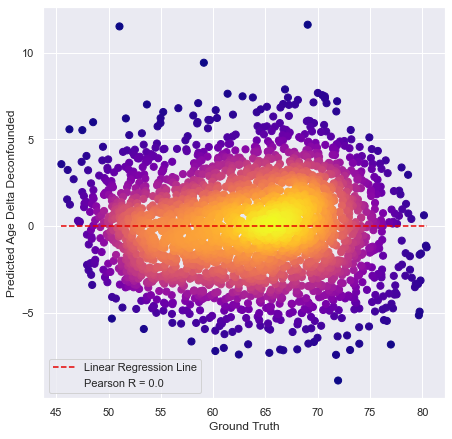

(ElasticNetCV(l1_ratio=[0.01, 0.1, 0.11, 0.12, 0.13, 0.14, 0.15, 0.16, 0.17,
                        0.18, 0.19, 0.2, 0.21, 0.22, 0.23, 0.24, 0.25, 0.26,
                        0.27, 0.28, 0.29, 0.3, 0.4, 0.5, 0.51, 0.52, 0.53, 0.54,
                        0.55, 0.56, ...],
              n_alphas=1000),
 array([0.43184966, 0.42941862, 0.19834539]),
 -3.7611683982921065,
 2.156637265604285,
 0.9374836417022601,
 array([[66.70941667, 60.94423633, 69.98628367, ..., 69.20997333,
         52.488741  , 66.74188333],
        [69.16434167, 59.93761867, 66.86063133, ..., 68.785348  ,
         54.686887  , 67.05977667],
        [62.182788  , 59.94387567, 69.09555667, ..., 63.84217067,
         52.26990133, 67.745382  ]]),
 array([66.44988584, 56.75079909, 74.18139269, ..., 69.44193989,
        55.86221461, 68.10468037]),
 array([[63.24576333, 65.72323833, 70.62548833, ..., 59.68887433,
         70.85736333, 54.231527  ],
        [60.572191  , 61.33633767, 67.95374   , ..., 57.404459  ,
       

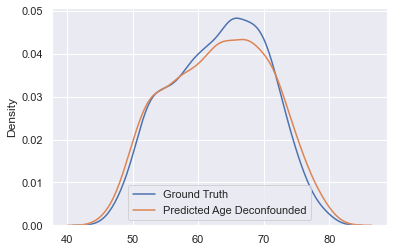

In [12]:
ElasticNet_wrap(df_train, df_test, modalities=cluster0, 
                   number_of_modalities=None, show_plots=True, verbose=True,
                   cross_validation_flag = True, deconfound=True)

MAE= 2.038410122487072
PR= 0.9355783318634394
Time To Complete: 0:00:26.843117
MAE Decon= 2.189957930761129
PR Decon= 0.9355783318634396


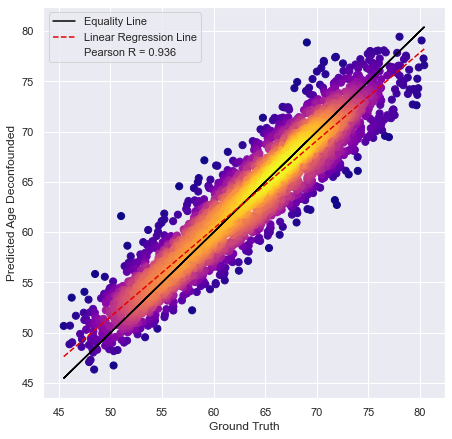

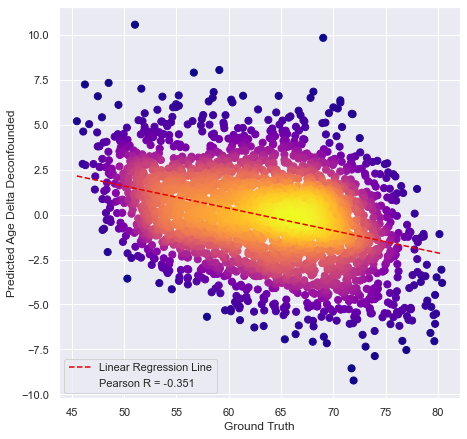

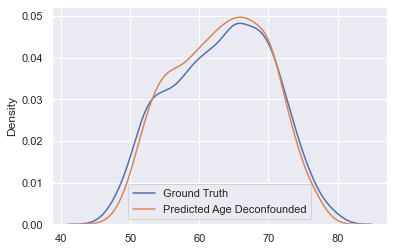

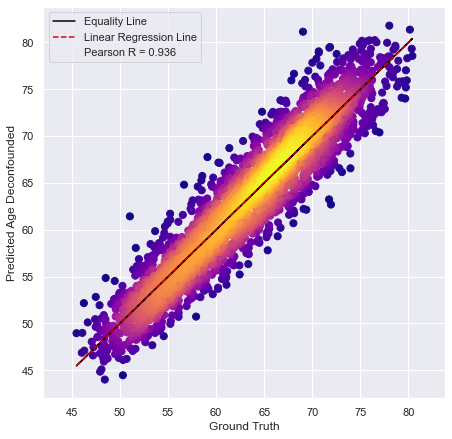

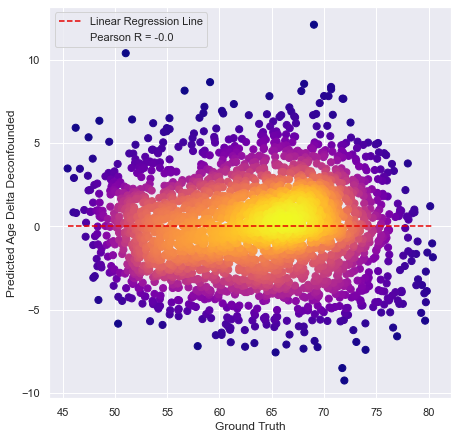

(ElasticNetCV(l1_ratio=[0.01, 0.1, 0.11, 0.12, 0.13, 0.14, 0.15, 0.16, 0.17,
                        0.18, 0.19, 0.2, 0.21, 0.22, 0.23, 0.24, 0.25, 0.26,
                        0.27, 0.28, 0.29, 0.3, 0.4, 0.5, 0.51, 0.52, 0.53, 0.54,
                        0.55, 0.56, ...],
              n_alphas=1000),
 array([0.52845176, 0.51578487]),
 -2.790098901869804,
 2.189957930761129,
 0.9355783318634396,
 array([[66.70941667, 60.94423633, 69.98628367, ..., 69.20997333,
         52.488741  , 66.74188333],
        [69.16434167, 59.93761867, 66.86063133, ..., 68.785348  ,
         54.686887  , 67.05977667]]),
 array([66.44988584, 56.75079909, 74.18139269, ..., 69.44193989,
        55.86221461, 68.10468037]),
 array([[63.24576333, 65.72323833, 70.62548833, ..., 59.68887433,
         70.85736333, 54.231527  ],
        [60.572191  , 61.33633767, 67.95374   , ..., 57.404459  ,
         70.10098333, 55.26528167]]),
 array([59.31107306, 67.5239071 , 72.23687215, ..., 57.6181694 ,
        73.83504566

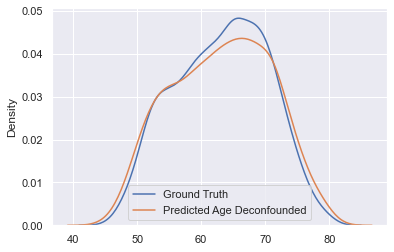

In [13]:
ElasticNet_wrap(df_train, df_test, modalities=cluster1, 
                   number_of_modalities=None, show_plots=True, verbose=True,
                   cross_validation_flag = True, deconfound=True)

MAE= 2.1460718578973537
PR= 0.928631289440187
Time To Complete: 0:00:25.431995
MAE Decon= 2.3368045502381167
PR Decon= 0.9286312894401869


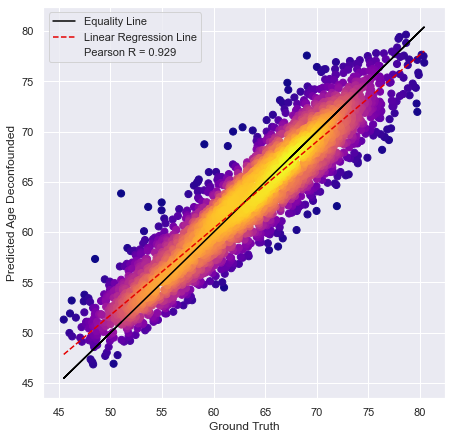

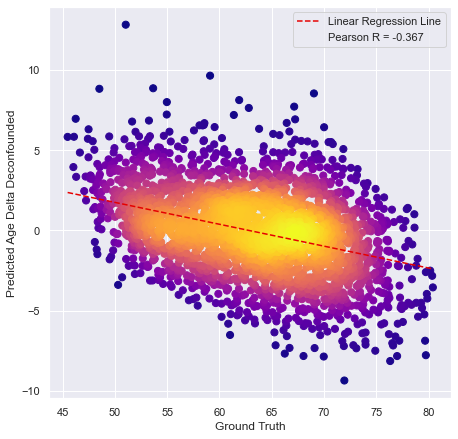

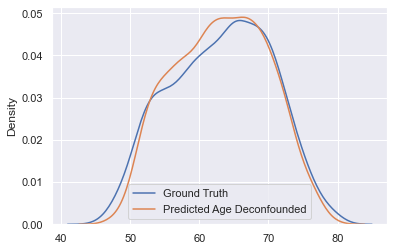

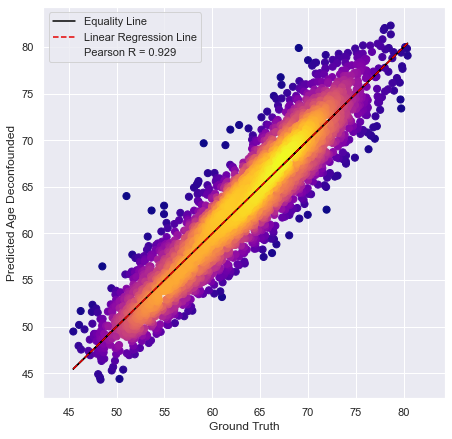

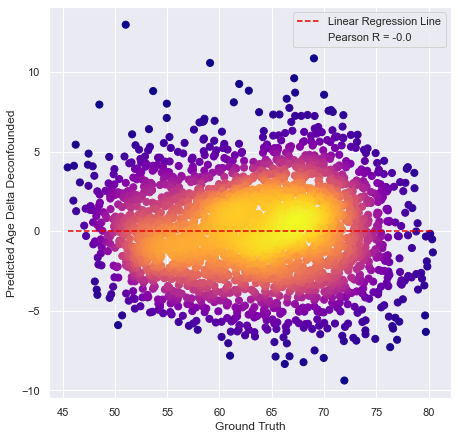

(ElasticNetCV(l1_ratio=[0.01, 0.1, 0.11, 0.12, 0.13, 0.14, 0.15, 0.16, 0.17,
                        0.18, 0.19, 0.2, 0.21, 0.22, 0.23, 0.24, 0.25, 0.26,
                        0.27, 0.28, 0.29, 0.3, 0.4, 0.5, 0.51, 0.52, 0.53, 0.54,
                        0.55, 0.56, ...],
              n_alphas=1000),
 array([0.73421926, 0.29993179]),
 -2.2541275464972657,
 2.3368045502381167,
 0.9286312894401869,
 array([[66.70941667, 60.94423633, 69.98628367, ..., 69.20997333,
         52.488741  , 66.74188333],
        [62.182788  , 59.94387567, 69.09555667, ..., 63.84217067,
         52.26990133, 67.745382  ]]),
 array([66.44988584, 56.75079909, 74.18139269, ..., 69.44193989,
        55.86221461, 68.10468037]),
 array([[63.24576333, 65.72323833, 70.62548833, ..., 59.68887433,
         70.85736333, 54.231527  ],
        [59.64092333, 60.73087933, 69.97046333, ..., 64.94622333,
         65.896517  , 56.56699233]]),
 array([59.31107306, 67.5239071 , 72.23687215, ..., 57.6181694 ,
        73.835045

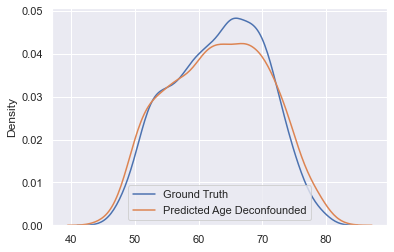

In [14]:
ElasticNet_wrap(df_train, df_test, modalities=cluster2, 
                   number_of_modalities=None, show_plots=True, verbose=True,
                   cross_validation_flag = True, deconfound=True)